# **PRCP-1025: Flight Price Prediction**

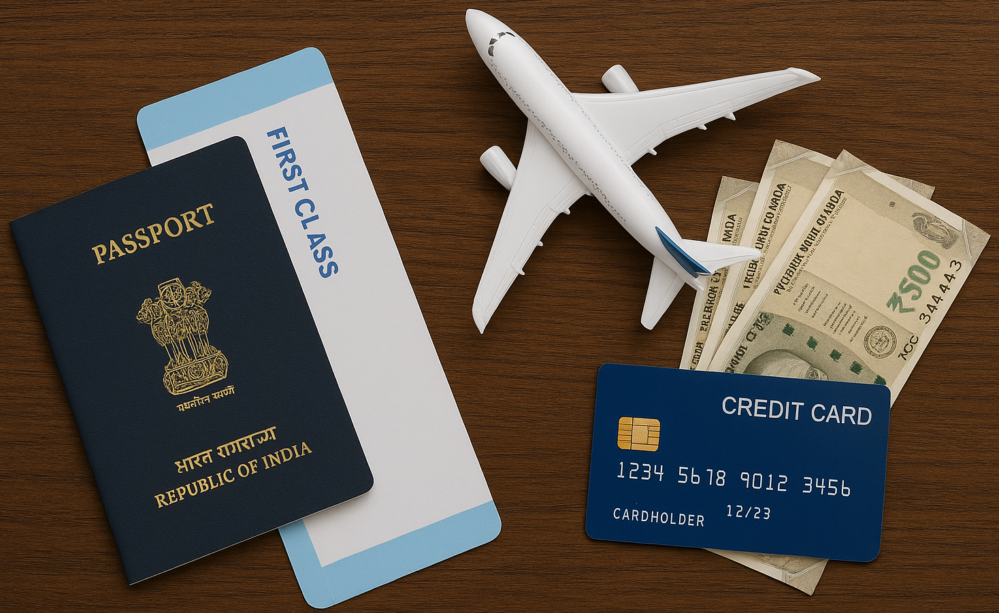

## **Project Type - Regression**

Name - **Ari R**

Contribution - Individual

# **Project Summary:**

* The Flight Price Prediction dataset represents a real-world challenge in the travel and airline industry: forecasting ticket prices based on factors such as airline, route, number of stops, duration, and journey date. Flight pricing is highly dynamic and unpredictable, making it a critical problem for both airlines and travelers. By applying machine learning, stakeholders can better understand price drivers, optimize booking strategies, and improve decision-making.

* The objective of this project is to build a predictive machine learning model capable of estimating flight ticket prices with high accuracy. Such a model can help travelers anticipate costs, enable airlines to analyze competitive pricing, and support online platforms in offering smarter fare recommendations.

* The dataset combines categorical and numerical features, including airline, source, destination, total stops, route, duration, and departure date. Data preprocessing included handling missing values, feature engineering (extracting day and month, converting duration into numeric format), encoding categorical variables, and addressing skewness in price distribution. Exploratory Data Analysis revealed that airline type, number of stops, and duration are the most influential factors driving ticket prices.

* Multiple machine learning models—including Linear Regression, Random Forest, XGBoost, and LightGBM—were applied to predict flight prices. Models were evaluated using R² score, RMSE, and MAE to capture accuracy and error margins. Linear Regression and Decision Tree underperformed, while ensemble models like Random Forest methods showed strong predictive power.

* Ensemble models, particularly LightGBM and XGBoost, delivered the strongest performance, with LightGBM emerging as the best model due to its balance of accuracy, generalization, and efficiency. The project demonstrates how machine learning can be leveraged to tackle the complexity of dynamic flight pricing. By accurately predicting ticket prices, this solution can empower travelers, airlines, and booking platforms with actionable insights, driving smarter and more cost-effective travel planning.

# **Problem Statement:**

Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travelers saying that flight ticket prices are so unpredictable. That’s why we will try to use machine learning to solve this problem. This can help airlines by predicting what prices they can maintain.


\
**Task 1:** Prepare a complete data analysis report on the given data.

**Task 2:** Create a predictive model which will help the customers to predict future flight prices and plan their journey accordingly.

# ***Let's Begin!***

# **1. Know Your Data**

## **1.1. Import Libraries:**

In [3]:
# ===== Imports =====

# ===== General =====
import numpy as np
import pandas as pd
import math
import warnings
warnings.filterwarnings('ignore')

# ===== Visualization =====
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
import scipy.stats as stats
from matplotlib import patheffects
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects
%matplotlib inline

# ===== Hypotheses testing =====
from scipy.stats import chi2_contingency
from scipy import stats
from scipy.stats import f_oneway
from scipy.stats import pearsonr

# ===== Preprocessing =====
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from category_encoders import CountEncoder
from sklearn.pipeline import Pipeline

# ===== Outlier Influence =====
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm

# ===== Imbalanced handling =====
from imblearn.over_sampling import SMOTE

# ===== Model Selection =====
import time
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# ===== Evaluation Metrics =====
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import (mean_squared_error, mean_absolute_error, r2_score, explained_variance_score, mean_absolute_percentage_error)
from sklearn.model_selection import cross_val_score, KFold
from sklearn.model_selection import RandomizedSearchCV

## **1.2. Data Collection / Loading:**

In [4]:
# ===== Load Data =====
df = pd.read_excel('Flight_Fare.xlsx')

# ===== Checking first five rows of dataset =====
df.head(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [5]:
# ===== Checking last five rows of dataset =====
df.tail(5)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648
10682,Air India,9/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,10:55,19:15,8h 20m,2 stops,No info,11753


## **1.3. Basic Overview:**

In [6]:
# ===== Basic Overview =====

# ===== To view the summary stats of numerical columns =====
df.describe()

,Price
count,10683.000000
mean,9087.064121
std,4611.359167
min,1759.000000
25%,5277.000000
50%,8372.000000
75%,12373.000000
max,79512.000000


In [7]:
# ===== To View the categorical columns =====
df.describe(include='O').T

,count,unique,top,freq
Airline,10683,12,Jet Airways,3849
Date_of_Journey,10683,44,18/05/2019,504
Source,10683,5,Delhi,4537
Destination,10683,6,Cochin,4537
Route,10682,128,DEL → BOM → COK,2376
Dep_Time,10683,222,18:55,233
Arrival_Time,10683,1343,19:00,423
Duration,10683,368,2h 50m,550
Total_Stops,10682,5,1 stop,5625
Additional_Info,10683,10,No info,8345


## **1.4. Dataset Information:**

### **1.4.1. Information**

In [8]:
# ===== Checking the info of dataset =====
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [9]:
# ===== Checking the no. of rows and columns =====
df.shape

(10683, 11)

### **1.4.2. Domain Analysis:**

In [10]:
# ===== Domain Analysis =====
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

### **Domain Analysis Report:**

| **Feature No.** | **Feature Name**  | **Type**                         | **Description / Categories**                                   |
| --------------- | ----------------- | -------------------------------- | -------------------------------------------------------------- |
| 1               | Airline           | Categorical (object)             | Types of airlines (e.g., Indigo, Jet Airways, Air India, etc.) |
| 2               | Date\_of\_Journey | Date/Time (object → datetime)    | Journey start date of the passenger                            |
| 3               | Source            | Categorical (object)             | Starting location of the journey                               |
| 4               | Destination       | Categorical (object)             | Destination location of the journey                            |
| 5               | Route             | Categorical (object)             | Route taken from source to destination                         |
| 6               | Dep\_Time         | Time (object → datetime/time)    | Departure time of the flight                                   |
| 7               | Arrival\_Time     | Time (object → datetime/time)    | Arrival time at the destination                                |
| 8               | Duration          | String → Numeric (minutes/hours) | Total travel time of the flight                                |
| 9               | Total\_Stops      | Categorical (object)             | Number of stops in the journey                                 |
| 10              | Additional\_Info  | Categorical (object)             | Extra details (e.g., food, baggage, amenities)                 |
| 11              | Price             | Numerical (int64)                | Total ticket price (target variable)                           |

**Observation:**

| Column            | Dtype  | Notes                                                |
| ----------------- | ------ | -----------------------------------------------------|
| Airline           | object | categorical                                          |
| Date\_of\_Journey | object | categorical to should be **datetime**                               |
| Source            | object | categorical                                          |
| Destination       | object | categorical                                          |
| Route             | object | categorical                                  |
| Dep\_Time         | object | categorical to should be **datetime/time**                          |
| Arrival\_Time     | object | categorical to should be **datetime/time**                          |
| Duration          | object | categorical to **numeric (hours/minutes)** |
| Total\_Stops      | object | categorical   |
| Additional\_Info  | object | categorical                                          |
| Price             | int64  | numeric target variable                              |

**1. Date_of_Journey → datetime**

* Raw form = string ("24/03/2019") → ML models cannot learn from plain text dates.

* Converting to datetime64 allows you to extract useful patterns:

* Day of journey (weekend vs weekday)

* Month (seasonal trends: holidays, festivals, peak travel)

* Weekday (Monday vs Friday flights differ in price)

* Helps the model capture temporal seasonality.

**2. Dep_Time → datetime / numeric**

* Raw form = string ("22:20") → not usable by ML directly.

* Converting to time gives features like:

* Departure minutes from midnight (numeric)

* Or hour of departure (morning vs evening flights → price difference)

* Captures time-of-day effect on fares.

**3. Arrival_Time → datetime / numeric**

* Raw form = string ("01:10") → again, string is useless.

* Converted into minutes since midnight (or with next-day correction).

* Tells the model whether flights arrive at odd hours vs peak hours (affects ticket cost).

* Captures arrival convenience factor.

**4. Duration → numeric (hours/minutes)**

* Raw form = string ("22h 20m") → ML models cannot parse text like "h" or "m".

* Converted into total minutes (e.g., 1340).

* Flight duration is one of the strongest predictors of price.

* Converts unstructured text into a continuous variable.

### **1.4.3. Change the dtypes and column names:**

In [11]:
# ===== Change the dtypes and column names =====
# ===== Convert Date_of_Journey =====
df['Date_of_Journey'] = pd.to_datetime(df['Date_of_Journey'], format='%d/%m/%Y', errors='coerce')
df['Journey_day'] = df['Date_of_Journey'].dt.day
df['Journey_month'] = df['Date_of_Journey'].dt.month
df['Journey_weekday'] = df['Date_of_Journey'].dt.weekday   # Monday=0, Sunday=6

# ===== Departure Time → minutes since midnight =====
df['Dep_Time'] = pd.to_datetime(df['Dep_Time'], format='%H:%M', errors='coerce')
df['Dep_minutes'] = df['Dep_Time'].dt.hour * 60 + df['Dep_Time'].dt.minute

# ===== Arrival Time → minutes since midnight (with next-day correction) =====
def convert_arrival(x):
    try:
        # Remove "Next Day" if present
        if " " in x:
            time_part = x.split(" ")[0]
            next_day = True
        else:
            time_part = x
            next_day = False

        t = pd.to_datetime(time_part, format='%H:%M', errors='coerce')
        if pd.isna(t):
            return np.nan
        minutes = t.hour * 60 + t.minute
        if next_day:
            minutes += 24*60   # ===== add 1440 minutes for next-day arrival =====
        return minutes
    except:
        return np.nan

df['Arrival_minutes'] = df['Arrival_Time'].apply(convert_arrival)

# ===== Duration → total minutes =====
def convert_duration(x):
    try:
        h, m = 0, 0
        if 'h' in x:
            h = int(x.split('h')[0].strip())
            x = x.split('h')[1]
        if 'm' in x:
            m = int(x.split('m')[0].strip())
        return h*60 + m
    except:
        return np.nan

df['Duration_minutes'] = df['Duration'].apply(convert_duration)

# ===== Final Cleanup (Drop Original Columns) =====
df = df.drop(['Date_of_Journey','Dep_Time','Arrival_Time','Duration'], axis=1)

df.head()

,Airline,Source,Destination,Route,Total_Stops,Additional_Info,Price,Journey_day,Journey_month,Journey_weekday,Dep_minutes,Arrival_minutes,Duration_minutes
0,IndiGo,Banglore,New Delhi,BLR → DEL,non-stop,No info,3897,24,3,6,1340,1510,170
1,Air India,Kolkata,Banglore,CCU → IXR → BBI → BLR,2 stops,No info,7662,1,5,2,350,795,445
2,Jet Airways,Delhi,Cochin,DEL → LKO → BOM → COK,2 stops,No info,13882,9,6,6,565,1705,1140
3,IndiGo,Kolkata,Banglore,CCU → NAG → BLR,1 stop,No info,6218,12,5,6,1085,1410,325
4,IndiGo,Banglore,New Delhi,BLR → NAG → DEL,1 stop,No info,13302,1,3,4,1010,1295,285


In [12]:
# ===== Checking the info of dataset =====
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Airline           10683 non-null  object
 1   Source            10683 non-null  object
 2   Destination       10683 non-null  object
 3   Route             10682 non-null  object
 4   Total_Stops       10682 non-null  object
 5   Additional_Info   10683 non-null  object
 6   Price             10683 non-null  int64 
 7   Journey_day       10683 non-null  int32 
 8   Journey_month     10683 non-null  int32 
 9   Journey_weekday   10683 non-null  int32 
 10  Dep_minutes       10683 non-null  int32 
 11  Arrival_minutes   10683 non-null  int64 
 12  Duration_minutes  10683 non-null  int64 
dtypes: int32(4), int64(3), object(6)
memory usage: 918.2+ KB


* The dataset contains 10,683 flight records with 13 columns.

* Target variable: Price (int64) — flight ticket price.

* Categorical features: Airline, Source, Destination, Route, Total_Stops, Additional_Info (all object).

* Date/time features have been transformed into numeric: Journey_day, Journey_month, Journey_weekday, Dep_minutes, Arrival_minutes, Duration_minutes.

* Clean Dataset – Only Route and Total_Stops have 1 missing value each (easy to fix). Otherwise, the dataset is complete and consistent, suitable for predictive modeling.

In [13]:
# ===== Checking the no. of rows and columns =====
df.shape

(10683, 13)

# **2. Data wrangling / Cleaning**

## **2.1. Extracting categorical and numerical columns**

In [14]:
# ===== Extracting categorical and numerical columns =====
cat_col = [col for col in df.columns if df[col].dtype == 'object']
num_col = [col for col in df.columns if df[col].dtype != 'object']

# ===== Looking at unique values in categorical and numerical columns =====
print("Categorical Columns:\n")
for col in cat_col:
    print(f'\n{col}:\n{df[col].unique()}')

print("\nNumerical Columns:\n")
for col in num_col:
    print(f'\n{col}:\n{df[col].unique()}')

Categorical Columns:


Airline:
['IndiGo' 'Air India' 'Jet Airways' 'SpiceJet' 'Multiple carriers' 'GoAir'
 'Vistara' 'Air Asia' 'Vistara Premium economy' 'Jet Airways Business'
 'Multiple carriers Premium economy' 'Trujet']

Source:
['Banglore' 'Kolkata' 'Delhi' 'Chennai' 'Mumbai']

Destination:
['New Delhi' 'Banglore' 'Cochin' 'Kolkata' 'Delhi' 'Hyderabad']

Route:
['BLR → DEL' 'CCU → IXR → BBI → BLR' 'DEL → LKO → BOM → COK'
 'CCU → NAG → BLR' 'BLR → NAG → DEL' 'CCU → BLR' 'BLR → BOM → DEL'
 'DEL → BOM → COK' 'DEL → BLR → COK' 'MAA → CCU' 'CCU → BOM → BLR'
 'DEL → AMD → BOM → COK' 'DEL → PNQ → COK' 'DEL → CCU → BOM → COK'
 'BLR → COK → DEL' 'DEL → IDR → BOM → COK' 'DEL → LKO → COK'
 'CCU → GAU → DEL → BLR' 'DEL → NAG → BOM → COK' 'CCU → MAA → BLR'
 'DEL → HYD → COK' 'CCU → HYD → BLR' 'DEL → COK' 'CCU → DEL → BLR'
 'BLR → BOM → AMD → DEL' 'BOM → DEL → HYD' 'DEL → MAA → COK' 'BOM → HYD'
 'DEL → BHO → BOM → COK' 'DEL → JAI → BOM → COK' 'DEL → ATQ → BOM → COK'
 'DEL → JDH → BOM → COK' 'C

**Observations from Categorical Columns**

| Column               | Unique Values (Sample)                                                                                                          | Count of Unique Values  | Notes                                                               |
| -------------------- | ------------------------------------------------------------------------------------------------------------------------------- | ----------------------- | ------------------------------------------------------------------- |
| **Airline**          | IndiGo, Air India, Jet Airways, SpiceJet, Multiple carriers, GoAir, Vistara, Air Asia, …                                        | 12                      | Multiple airlines including economy, premium, and business classes. |
| **Source**           | Banglore, Kolkata, Delhi, Chennai, Mumbai                                                                                       | 5                       | Major metro cities as departure points.                             |
| **Destination**      | New Delhi, Banglore, Cochin, Kolkata, Delhi, Hyderabad                                                                          | 6                       | Key arrival cities, mix of metros and tier-2.                       |
| **Route**            | BLR → DEL, CCU → IXR → BBI → BLR, DEL → LKO → BOM → COK, CCU → NAG → BLR, BLR → NAG → DEL, …                                    | 90+ (many combinations) | Complex routes with 1–4 layovers; some missing values (`NaN`).      |
| **Total\_Stops**     | non-stop, 1 stop, 2 stops, 3 stops, 4 stops, NaN                                                                                | 6                       | Indicates layovers; missing values present.                         |
| **Additional\_Info** | No info, In-flight meal not included, No check-in baggage included, 1 Short layover, Change airports, Business class, Red-eye … | 10                      | Mix of service details; “No info/No Info” redundancy observed.      |


**Observations from Numerical Columns**

| Column                | Range (Min–Max) | Count of Unique Values | Notes                                                                                     |
| --------------------- | --------------- | ---------------------- | ----------------------------------------------------------------------------------------- |
| **Price**             | 3,897 – 13,882  | Many (continuous)      | Ticket price; continuous variable, positively skewed (higher fares exist).                |
| **Journey\_day**      | 1 – 31          | 10                     | Represents day of month extracted from journey date.                                      |
| **Journey\_month**    | 3 – 6           | 4                      | Only months March → June are present in dataset.                                          |
| **Journey\_weekday**  | 0 – 6           | 7                      | Encoded as `0=Monday … 6=Sunday`. Covers all days of week.                                |
| **Dep\_minutes**      | 0 – 1435        | Many (≈ 200+)          | Departure time converted into minutes of day (00:00 → 23:59).                             |
| **Arrival\_minutes**  | 20 – 2875       | Many (≈ 300+)          | Arrival time in minutes; >1440 means next-day or 2-day flights.                           |
| **Duration\_minutes** | 5 – 2860        | Many (≈ 300+)          | Flight duration; highly variable, indicates layovers (short = direct, long = multi-stop). |


## **2.2. Observations from Categorical Columns and Imputation**

In [15]:
# ===== Count the number of unique values =====
for col in cat_col:
    print(f"Column: '{col}'")
    print(f" * Unique Categories: {df[col].nunique()}")
    print(f" * Category Distribution:\n{df[col].value_counts(dropna=False)}")
    print("-" * 30)

Column: 'Airline'
 * Unique Categories: 12
 * Category Distribution:
Airline
Jet Airways                          3849
IndiGo                               2053
Air India                            1752
Multiple carriers                    1196
SpiceJet                              818
Vistara                               479
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: count, dtype: int64
------------------------------
Column: 'Source'
 * Unique Categories: 5
 * Category Distribution:
Source
Delhi       4537
Kolkata     2871
Banglore    2197
Mumbai       697
Chennai      381
Name: count, dtype: int64
------------------------------
Column: 'Destination'
 * Unique Categories: 6
 * Category Distribution:
Destination
Cochin       4537
Banglore     2871
Delhi        1265
New Delh

### **Observations from Categorical Columns**

### **1. Null Counts:**

| **Column**           | **NaN Count** | **% of Data** | **Recommended Handling**                                                      |
| -------------------- | ------------- | ------------- | ----------------------------------------------------------------------------- |
| **Airline**          | 0             | 0%            | No action needed.                                                             |
| **Source**           | 0             | 0%            | No action needed.                                                             |
| **Destination**      | 0             | 0%            | No action needed.                                                             |
| **Route**            | 1             | \~0.009%      | Drop the row (too small)						       |
| **Total\_Stops**     | 1             | \~0.009%      | Drop the row (too small)	                                               |
| **Additional\_Info** | 0             | 0%            | No action needed.                                                             |
| **Price**            | 0             | 0%            | No action needed.                                                             |

### **2. Need to name change:**

**Destination**

* Issue: "Delhi" (1265) and "New Delhi" (932) represent the same city.
* Merge them under a single consistent name, preferably "Delhi"

**Additional_Info**

* "No info" (8345) and "No Info" (3) are duplicates with different capitalization.

* Standardize them into "No info"

In [16]:
# ===== Imputation of categorical features =====
# ===== Drop rare NaN rows in Route and Total_Stops =====
df = df.dropna(subset=['Route', 'Total_Stops'])

# ===== Fix naming issues in Destination =====
df['Destination'] = df['Destination'].replace({'New Delhi': 'Delhi'})

# ===== Fix naming issues in Additional_Info =====
df['Additional_Info'] = df['Additional_Info'].replace({'No Info': 'No info'})

## **2.3. Check for and remove duplicate values**

In [17]:
# ===== Check duplicate values =====
# ===== Total number of rows =====
total_rows = len(df)

# ===== Count duplicate rows =====
duplicate_count = df.duplicated().sum()

# ===== Percentage of duplicates =====
duplicate_percentage = (duplicate_count / total_rows) * 100

print(f"Total Rows: {total_rows}")
print(f"Duplicate Rows: {duplicate_count}")
print(f"Percentage of Duplicates: {duplicate_percentage:.2f}%")

Total Rows: 10682
Duplicate Rows: 222
Percentage of Duplicates: 2.08%


In [18]:
# ===== Drop exact duplicates =====
df = df.drop_duplicates()

* The dataset initially consisted of 10,682 rows and 13 columns, out of which 222 rows (2.08%) were identified as exact duplicates. Since these duplicate records did not provide any additional insights and could potentially bias the analysis, they were removed. Additionally, a few rows containing missing values in the Route and Total_Stops columns (~0.009% each) were dropped, as their proportion was negligible. To improve consistency, categorical labels were also standardized, such as merging “Delhi” and “New Delhi” under a single category, and correcting capitalization differences in “No info” vs. “No Info”.

* After these cleaning steps, the dataset was reduced to 10,460 unique records and 13 columns, ensuring higher data quality and reliability for further analysis.

# **3. Task 1 - Exploratory Data Analysis (EDA)**

## **3.1. Univariate Analysis: Investigating Individual Features**

### **3.1.1. Categorical Features**

### **Chart-1. Distribution of Categorical Features**

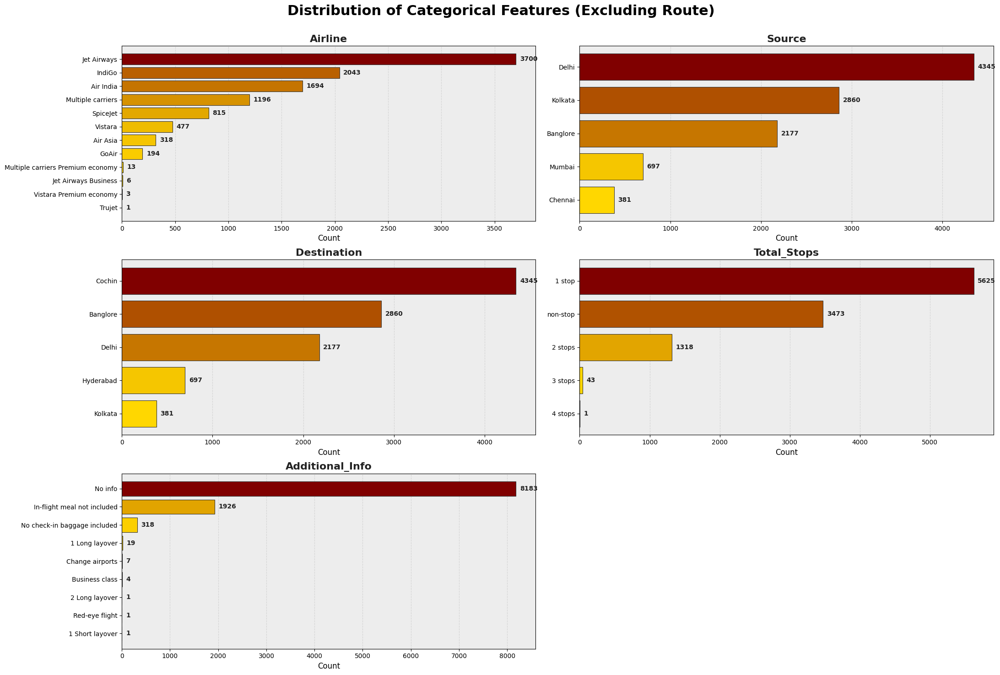

In [19]:
# ===== Categorical Features =====
# ===== Select categorical columns and exclude 'Route' =====
categorical_cols = df.select_dtypes(include='object').columns
categorical_cols = [col for col in categorical_cols if col != 'Route']

# ===== Subplot grid =====
n_cols = 2
n_rows = (len(categorical_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 5*n_rows))
axes = axes.flatten()

# ===== Main title =====
fig.suptitle('Distribution of Categorical Features (Excluding Route)', fontsize=22, fontweight='bold', y=0.98)

# ===== Background color =====
bg_color = '#EDEDED'

# ===== Maroon → Golden Gradient =====
colors_list = ['#FFD700', '#800000']  # Golden → Maroon
custom_cmap = LinearSegmentedColormap.from_list('gold_maroon', colors_list)

# ===== Loop through categorical columns =====
for i, col in enumerate(categorical_cols):
    axes[i].set_facecolor(bg_color)
    axes[i].grid(axis='x', linestyle='--', alpha=0.4, zorder=0)
    axes[i].set_title(f'{col}', fontsize=16, fontweight='bold', color='#222222')
    axes[i].set_xlabel('Count', fontsize=12)

    # ===== All categories sorted ascending for horizontal bars =====
    ctab = df[col].value_counts().sort_values(ascending=True)
    categories = ctab.index
    values = ctab.values

    # ===== Gradient colors proportional to values =====
    norm_values = (values - values.min()) / (values.max() - values.min())
    colors = [custom_cmap(v) for v in norm_values]

    # ===== Horizontal bar plot =====
    bars = axes[i].barh(categories, values, color=colors, edgecolor='#333333', linewidth=0.8, zorder=2)

    # ===== Add counts elegantly =====
    for bar, val in zip(bars, values):
        axes[i].text(val + max(values)*0.01, bar.get_y() + bar.get_height()/2,
                     f"{val}", va='center', fontsize=10, fontweight='bold', color='#222222')

    axes[i].tick_params(axis='y', labelsize=10)

# ===== Remove empty subplots =====
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

### **Categorical Feature Observations**

**1. Airline Distribution**

* Jet Airways dominates the dataset with 3700 flights, followed by IndiGo (2043) and Air India (1694).

* Airlines like SpiceJet (815), Vistara (477), and Air Asia (318) are present in smaller proportions.

* Premium categories such as Jet Airways Business (6), Vistara Premium Economy (3), and Trujet (1) are very rare.

* Insight: The dataset is heavily skewed towards Jet Airways and IndiGo, meaning models may learn price patterns biased towards these airlines. Rare airlines may not significantly impact predictions.

**2. Source Distribution**

* Delhi (4345) is the most common source city, followed by Kolkata (2860) and Bangalore (2177).

* Mumbai (697) and Chennai (381) have fewer entries.

* Insight: Most flights in the dataset originate from Delhi, indicating it’s a major hub. Chennai contributes the least data, meaning fewer insights for Chennai-origin flights.

**3. Destination Distribution**

* Cochin (4345) is the top destination, followed by Bangalore (2860) and Delhi (2177).

* Hyderabad (697) and Kolkata (381) are much smaller in count.

* Insight: Cochin is the most frequent destination in this dataset, showing strong traffic towards it.

**4. Total Stops Distribution**

* 1 stop (5625) is the most frequent, followed by non-stop (3473).

* 2 stops (1318) exist but are much less common.

* 3 stops (43) and 4 stops (1) are extremely rare.

* Insight: Majority of flights are 1 stop or non-stop, meaning longer layovers are rare. This feature is highly imbalanced.

**5. Additional Info Distribution**

* The majority of records have "No info" (8183), followed by "In-flight meal not included" (1926).

* Other categories like "No check-in baggage included (318)", "1 Long layover (19)", and "Change airports (7)" are very rare.

* Insight: The “Additional Info” feature is mostly uninformative since 98%+ of entries are just “No info” or “In-flight meal not included”. The rare categories will have minimal impact.

**Overall Insights:**

* The dataset is imbalanced across categories, especially in airlines, source, and stops.

* Jet Airways, Delhi (Source), and Cochin (Destination) dominate the dataset.

* 1-stop and non-stop flights cover the majority of the records.

* Additional_Info column has limited variation and may not add much predictive power.

### **Chart-2. Distribution of Route Categorical Feature**

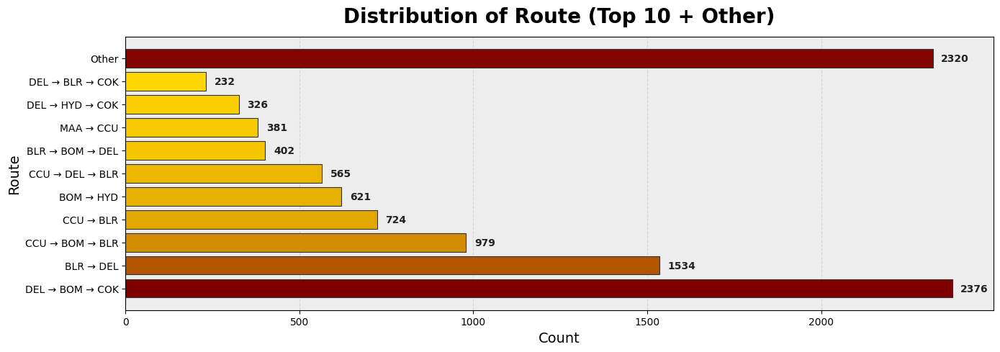

In [20]:
# ===== Categorical Features(Route) =====
column_to_plot = 'Route'
top_n = 10
bg_color = '#EDEDED'
colors_list = ['#FFD700', '#800000']  # ===== Golden → Maroon gradient =====
custom_cmap = LinearSegmentedColormap.from_list('gold_maroon', colors_list)

# ===== Prepare data =====
ctab = df[column_to_plot].value_counts()
top_ctab = ctab.nlargest(top_n)
other_count = ctab.iloc[top_n:].sum()

# ===== Combine top categories and 'Other' =====
top_ctab['Other'] = other_count
categories = top_ctab.index
values = top_ctab.values

# ===== Gradient colors proportional to values =====
norm_values = (values - values.min()) / (values.max() - values.min())
colors = [custom_cmap(v) for v in norm_values]

# ===== Plot =====
plt.figure(figsize=(14, 5))
plt.title(f'Distribution of {column_to_plot} (Top {top_n} + Other)', fontsize=20, fontweight='bold', y=1.03)
plt.gca().set_facecolor(bg_color)
plt.grid(axis='x', linestyle='--', alpha=0.4, zorder=0)

# ===== Horizontal bar plot =====
bars = plt.barh(categories, values, color=colors, edgecolor='#333333', linewidth=0.8, zorder=2)

# ===== Add counts at the end of bars =====
for bar, val in zip(bars, values):
    plt.text(val + max(values)*0.01, bar.get_y() + bar.get_height()/2,
             f"{val}", va='center', fontsize=10, fontweight='bold', color='#222222')

# ===== Axis labels =====
plt.xlabel('Count', fontsize=14)
plt.ylabel(column_to_plot, fontsize=14)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()

**Insights**

* Delhi and Bangalore dominate as major connecting hubs across multiple routes.

* Cochin appears often as the final destination in the most common routes.

* The top 2 routes alone (DEL → BOM → COK & BLR → DEL) contribute significantly to the dataset.

* The long tail (Other = 2320 flights) indicates a high diversity of routes, but most are individually rare.

### **3.1.2. Visualize distributions of the numerical features**

### **Chart-3. Visualize the distribution of numerical features**

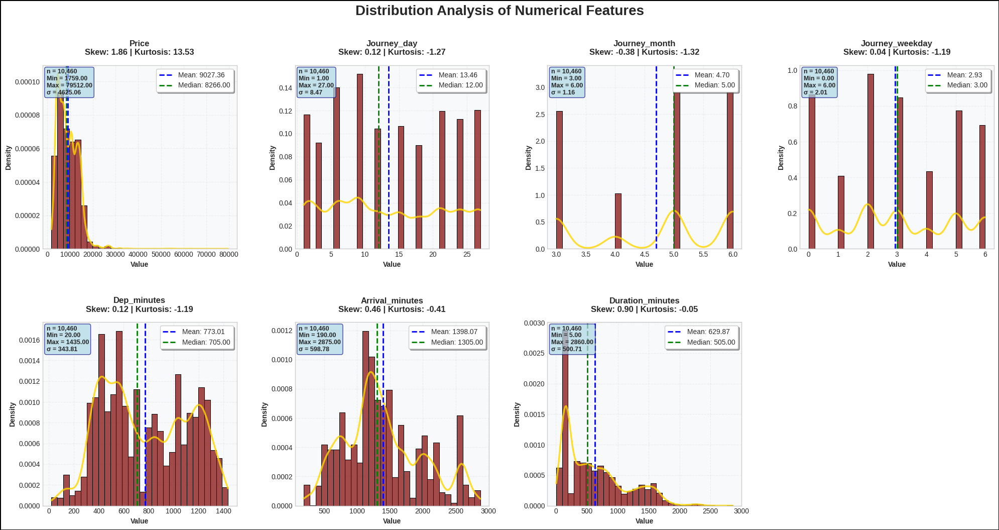

In [21]:
# ===== Distribution of numerical features =====
# ===== Set up =====
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# ===== Select numeric columns =====
numerics = df.select_dtypes(include='number')

# ===== Calculate grid dimensions for subplots - 4 columns per row =====
n_cols = 4
n_rows = (len(numerics.columns) + n_cols - 1) // n_cols

# ===== Create figure with subplots =====
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
fig.suptitle('Distribution Analysis of Numerical Features',
             fontsize=20, fontweight='bold', y=1.05)

# ===== Flatten axes array for easier indexing =====
axes = axes.flatten()

# ===== Create histplot for each numeric column =====
for i, column in enumerate(numerics.columns):
    # ===== Skip if no more columns =====
    if i >= len(axes):
        break

    # ===== Get data for current column =====
    data = numerics[column].dropna()

    # ===== Create distplot with blue bars and green KDE =====
    sns.histplot(data, kde=True, ax=axes[i], color='#800000',
                 stat='density', alpha=0.7, bins=30)

    # ===== Get KDE line and color it green =====
    # ===== Check if KDE line exists =====
    if axes[i].get_lines():
        kde_line = axes[i].get_lines()[0]
        kde_line.set_color('#FFD700')
        kde_line.set_linewidth(2.5)
        kde_line.set_alpha(0.8)

    # ===== Add statistical information =====
    mean_val = data.mean()
    median_val = data.median()
    skewness = data.skew()
    kurtosis = data.kurtosis()

    # ===== Add vertical lines for mean and median =====
    axes[i].axvline(mean_val, color='blue', linestyle='--', linewidth=2,
                   label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(median_val, color='green', linestyle='--', linewidth=2,
                   label=f'Median: {median_val:.2f}')

    # ===== Set title and labels with enhanced formatting =====
    axes[i].set_title(f'{column}\nSkew: {skewness:.2f} | Kurtosis: {kurtosis:.2f}',
                     fontweight='bold', pad=15)
    axes[i].set_xlabel('Value', fontweight='bold')
    axes[i].set_ylabel('Density', fontweight='bold')

    # ===== Add legend with better positioning =====
    axes[i].legend(loc='upper right', frameon=True, fancybox=True, shadow=True)

    # ===== Add a grid for better readability =====
    axes[i].grid(True, alpha=0.3, linestyle='--')

    # ===== Add a box with summary statistics =====
    textstr = f'n = {len(data):,}\nMin = {data.min():.2f}\nMax = {data.max():.2f}\nσ = {data.std():.2f}'
    props = dict(boxstyle='round', facecolor='lightblue', alpha=0.7, edgecolor='navy')
    axes[i].text(0.02, 0.98, textstr, transform=axes[i].transAxes, fontsize=9,
                verticalalignment='top', bbox=props, fontweight='bold')

    # ===== Set background color for subplot =====
    axes[i].set_facecolor('#f8f9fa')

# ===== Hide any empty subplots =====
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# ===== Adjust layout with better spacing =====
plt.tight_layout()
plt.subplots_adjust(top=0.93, hspace=0.4, wspace=0.3)

# ===== Add a border around the entire figure =====
fig.patch.set_edgecolor('black')
fig.patch.set_linewidth(2)

plt.show()

### **Insights from Numerical Feature Distributions**

**1. Price**

* Range: ₹1759 – ₹79,512.

* Mean (9027) > Median (8266) → Right-skewed distribution (skew = 1.86).

* Heavy positive skew and high kurtosis (13.53) → presence of outliers (very expensive flights).

* Insight: Most ticket prices are concentrated below ₹20,000, but a few extremely high fares create long tails.

**2. Journey_day**

* Range: 1 – 27.

* Fairly even spread across days, with no strong peaks.

* Mean (13.46) ≈ Median (12) → almost symmetric.

* Insight: Flights are fairly distributed across the month, with no strong day-of-month bias.

**3. Journey_month**

* Range: March (3) – June (6).

* Flights are concentrated in May and June.

* Mean (4.7) ≈ Median (5) → nearly balanced.

* Insight: Dataset covers only 4 months, with higher flight frequency in May & June (possible seasonal trend).

**4. Journey_weekday**

* Range: 0 – 6 (Sunday–Saturday).

* Distribution is fairly balanced across weekdays, with some variations.

* Mean (2.93) ≈ Median (3) → symmetric.

* Insight: Flights are not biased towards weekdays or weekends → fairly uniform distribution.

**5. Dep_minutes (Departure Time in Minutes)**

* Range: 20 – 1435 minutes (~00:20 – 23:55).

* Distribution shows multiple peaks, suggesting higher flight frequency in morning and evening.

* Mean (773) ≈ Median (705) → nearly symmetric.

* Insight: Peak departures are likely during morning and evening rush hours.

**6. Arrival_minutes (Arrival Time in Minutes)**

* Range: 190 – 2875 minutes.

* Mean (1398) > Median (1305) → slightly right-skewed.

* Multiple peaks indicate popular arrival windows.

* Insight: Arrival times are clustered around afternoon and late evening.

**7. Duration_minutes**

* Range: 5 – 2860 minutes (~48 hours).

* Mean (629) > Median (505) → right-skewed.

* Most flights last < 1000 minutes (~16 hours), with few very long flights (possibly multi-stop).

* Insight: Majority of flights are short-to-medium duration; very long flights are rare outliers.

**Overall Insights:**

* Price and Duration are highly skewed → outliers must be treated for better model performance.

* Journey_day, Journey_month, and Journey_weekday are fairly balanced, so time-based seasonal/weekly effects may be important predictors.

* Departure & Arrival times show clear time-of-day peaks, which can be critical features in predicting price.

### **Numerical Feature Observations**

| Feature                           | Skewness / Kurtosis                                  | Observation                                                                                     |
| --------------------------------- | ---------------------------------------------------- | ----------------------------------------------------------------------------------------------- |
| **Price**                         | Skew = **1.86** (Right-skewed), Kurtosis = **13.53** | Most ticket prices are below ₹20,000, but extreme high fares create long tails (outliers).      |
| **Journey\_day**                  | Skew = **0.12**, Kurtosis = **-1.27**                | Fairly uniform distribution across days of month; almost symmetric with no strong peaks.        |
| **Journey\_month**                | Skew = **-0.38**, Kurtosis = **-1.32**               | Data spans March–June; flights concentrated in May & June → possible seasonal effect.           |
| **Journey\_weekday**              | Skew = **0.04**, Kurtosis = **-1.19**                | Balanced distribution across weekdays; no strong weekday vs weekend bias.                       |
| **Dep\_minutes** (Departure Time) | Skew = **0.12**, Kurtosis = **-1.19**                | Multiple peaks → higher departures during **morning & evening rush hours**.                     |
| **Arrival\_minutes**              | Skew = **0.46**, Kurtosis = **-0.41**                | Slight right skew; arrivals mostly in **afternoon & late evening** with multiple peaks.         |
| **Duration\_minutes**             | Skew = **0.90**, Kurtosis = **-0.05**                | Right-skewed; most flights under **1000 mins (\~16 hrs)**; very long flights are rare outliers. |


### **3.1.3. Distribution of categorical features**

### **Chart-4. Pie Chart Distribution of Categorical Features**

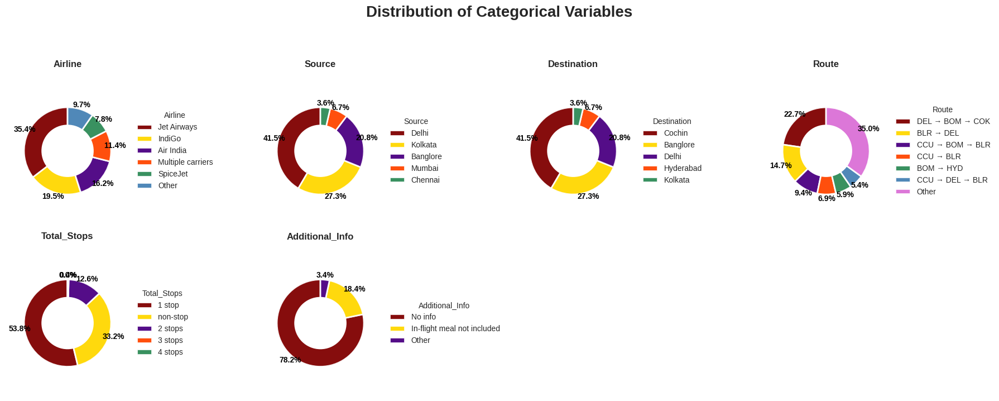

In [22]:
# ===== Pie Chart Distribution of Categorical Features =====
plt.figure(figsize=(18, 14))
# ===== Clean style with grid =====
plt.style.use('seaborn-v0_8-whitegrid')

# ===== Define a smooth, elegant blue-green palette with accents =====
colors = ['#800000', '#FFD700', '#4B0082', '#FF4500',  '#2E8B57',  '#4682B4', '#DA70D6']

# ===== Select categorical columns =====
categorical_cols = df.select_dtypes(include='object')

for i, col in enumerate(categorical_cols):
    plt.subplot(4, 4, i + 1)

    # ===== Get value counts and handle potential many categories =====
    value_counts = df[col].value_counts(dropna=False)

    # ===== Group small categories into "Other" =====
    if len(value_counts) > 6:
        threshold = 0.05 * value_counts.sum()
        small_categories = value_counts[value_counts < threshold]
        if len(small_categories) > 0:
            value_counts = value_counts[value_counts >= threshold]
            value_counts['Other'] = small_categories.sum()

    labels = [str(x) for x in value_counts.index]
    sizes = value_counts.values

    # ===== Create dynamic colors =====
    n_categories = len(value_counts)
    chart_colors = [colors[j % len(colors)] for j in range(n_categories)]

    # ===== Plot donut chart with percentages inside =====
    wedges, texts, autotexts = plt.pie(
        sizes,
        # ===== Remove labels from outside =====
        labels=None,
        colors=chart_colors,
        autopct='%1.1f%%',
        startangle=90,
        pctdistance=1.1,
        labeldistance=1.2,
        wedgeprops={'edgecolor': 'white', 'linewidth': 2, 'alpha': 0.95},
        textprops={'fontsize': 9, 'weight': 'bold', 'color': 'black'}
    )

    # ===== Style percentages =====
    for autotext in autotexts:
        autotext.set_weight('bold')
        autotext.set_fontsize(10)

    # ===== Donut effect =====
    centre_circle = plt.Circle((0, 0), 0.60, fc='white')
    plt.gca().add_artist(centre_circle)

    # ===== Add legend instead of labels outside =====
    plt.legend(wedges, labels, title=col.title(), loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # ===== Keep it circular =====
    plt.axis('equal')
    plt.title(col.title(), fontsize=12, weight='bold', pad=15)

plt.suptitle('Distribution of Categorical Variables', fontsize=20, weight='bold', y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

**1. Why did you pick the specific chart?**

* I used donut/pie charts because they are effective for showing the proportion of categories within each variable.

* Since variables like Airline, Source, Destination, Route, Total Stops, and Additional Info are categorical, these charts clearly highlight which categories dominate and which are rare.

* Donut charts make it easier for stakeholders to visually compare category shares at a glance, especially in datasets with imbalances.

**2. What insights are found from the chart?**

* Airline: Jet Airways (35.4%) and IndiGo (19.5%) dominate, while smaller airlines contribute little.

* Source & Destination: Delhi (41.5%) is the top source city, and Cochin (41.5%) is the top destination.

* Route: The route DEL → BOM → COK (22.7%) and BLR → DEL (14.7%) are highly frequent, while many other routes are rare (35% grouped as “Other”).

* Total Stops: Most flights are 1 stop (53.8%) or non-stop (33.2%); very few flights have 2+ stops.

* Additional Info: Majority of flights provide “No info” (78.2%), with only 18.4% marked as “In-flight meal not included”.

**3. Will the gained insights help create a positive business impact?**

* Yes, these insights are business-relevant:

* Airlines & Routes: Businesses (airlines or travel agencies) can focus marketing and dynamic pricing strategies on popular carriers (Jet Airways, IndiGo) and high-frequency routes.

* Sources & Destinations: Airports like Delhi (source) and Cochin (destination) * can plan better resource allocation (check-in counters, staff, baggage handling) to manage heavy traffic.

* Stops: Highlighting non-stop and 1-stop flights in promotions can attract customers since they make up 87%+ of flights.

* Additional Info: Since most flights don’t provide clear “additional info,” there’s an opportunity for airlines to differentiate through transparency (e.g., promoting baggage allowance, meals, business class perks).

## **3.2. Bivariate Analysis: Examining Relationships Between Variable Pairs**

### **3.2.1. Regression plot of feature vs Target Variable**

### **Chart-5. Regression plot of feature vs Target Variable**

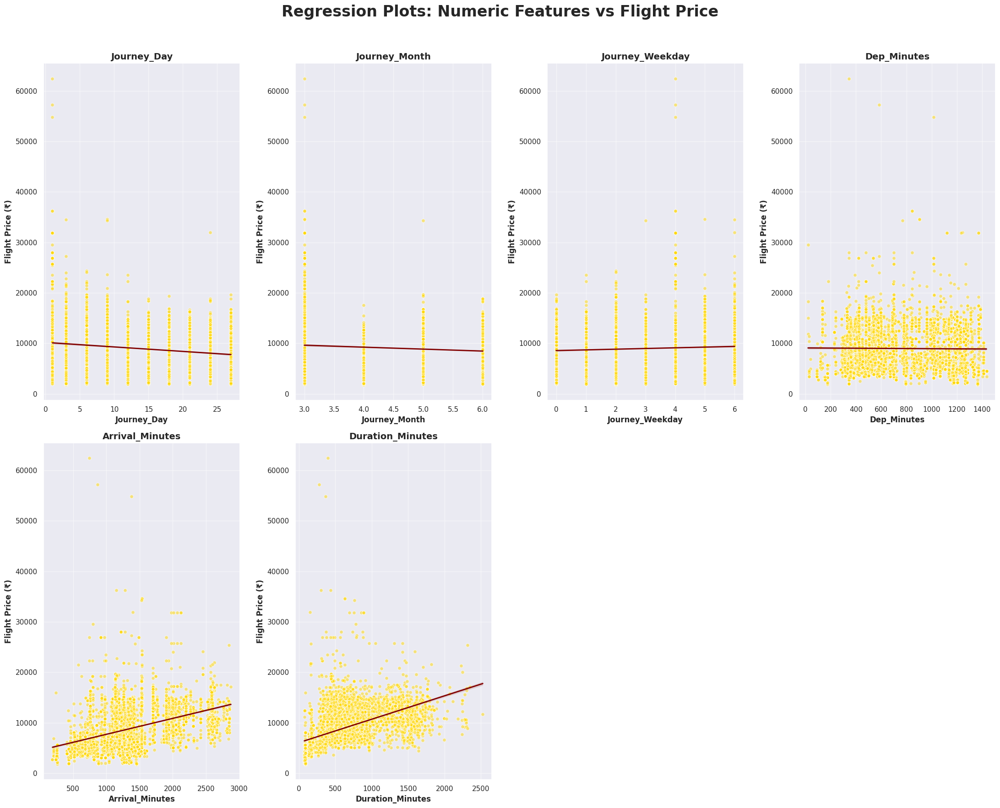

In [23]:
# ===== Regression plot of feature vs Target Variable =====
# ===== gray background =====
sns.set_theme(style="darkgrid")

# ===== Select numeric columns =====
numerics = df.select_dtypes(include='number').columns.tolist()

# ===== Define target column (Price) =====
target_col = 'Price'

# Remove target from feature list
if target_col in numerics:
    numerics.remove(target_col)

# ===== Copy numeric features and target column =====
numeric_df_copied = df[numerics + [target_col]].copy()

# ===== Drop missing values =====
numeric_df_copied = numeric_df_copied.dropna()

# ===== Sample data for faster plotting =====
if len(numeric_df_copied) > 5000:
    numeric_df_copied = numeric_df_copied.sample(5000, random_state=42)

# ===== Setup subplots =====
n_cols = 4
n_rows = int(np.ceil(len(numerics) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 18))
axes = axes.flatten()

fig.suptitle('Regression Plots: Numeric Features vs Flight Price',
             fontsize=24, fontweight='bold', y=0.98)

for i, column in enumerate(numerics):
    ax = axes[i]

    # ===== Scatter + Regression line =====
    sns.regplot(
        data=numeric_df_copied,
        x=column,
        y=target_col,
        scatter_kws={'alpha':0.5, 's':30, 'color':'#FFD700', 'edgecolor':'white'},
        line_kws={'color':'#800000', 'linewidth':2},
        ci=95,
        ax=ax
    )

    # ===== Customize =====
    ax.set_title(column.title(), fontsize=14, fontweight='bold')
    ax.set_xlabel(column.title(), fontsize=12, fontweight='bold')
    ax.set_ylabel('Flight Price (₹)', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.5)

# ===== Remove empty subplots if extra =====
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Observations: Regression Plots (Numeric Features vs Flight Price)**

| Feature               | Observation                                                                                                                                    |
| --------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------- |
| **Journey\_Day**      | No strong trend. Flight price remains scattered across all days. Slight downward slope suggests prices may be marginally lower mid/late month. |
| **Journey\_Month**    | No clear relationship. Price distribution is similar across months.                                                                            |
| **Journey\_Weekday**  | No strong impact. Prices are spread throughout the week, with minor variations.                                                                |
| **Dep\_Minutes**      | Weak relationship. Departure time (in minutes) doesn’t strongly influence price. Prices remain scattered throughout the day.                   |
| **Arrival\_Minutes**  | Slight positive trend. Later arrival times are weakly associated with higher prices.                                                           |
| **Duration\_Minutes** | Strongest positive correlation. Longer flight durations clearly lead to higher prices. This feature is highly significant for prediction.      |


**1. Why did you pick the specific chart?**

* I used regression plots because they visually represent the relationship between numeric features and the target variable (flight price). This allows us to see both the trend (line fit) and the spread of data (scatter points) in a single chart, making it easier to identify which features have predictive power.

**2. What is/are the insight(s) found from the chart?**

* Duration_Minutes has a strong positive correlation with price → longer flights are more expensive.

* Arrival_Minutes shows a slight upward trend → later arrivals may cost more.

* Journey_Day, Journey_Month, Journey_Weekday → minimal impact, prices remain widely scattered.

* Dep_Minutes → weak influence, departure time alone doesn’t drive price significantly.

**3. Will the gained insights help create a positive business impact?**

* Yes. These insights directly impact business strategy:

* Airlines can adjust pricing strategies by accounting for flight duration, which is the strongest cost driver.

* Marketing and discount campaigns can focus on features with weaker effects (like weekdays or departure times) to attract more customers without significantly affecting revenue.

* Customers can be better informed about why longer flights are priced higher, improving transparency and trust.

* Overall, these insights support more accurate price prediction models and smarter revenue management, leading to a positive business impact.

### **3.2.2. Airline segmentation analysis of the price variable**

### **Chart-6. CountPlot for Airline segmentation analysis of the price variable**

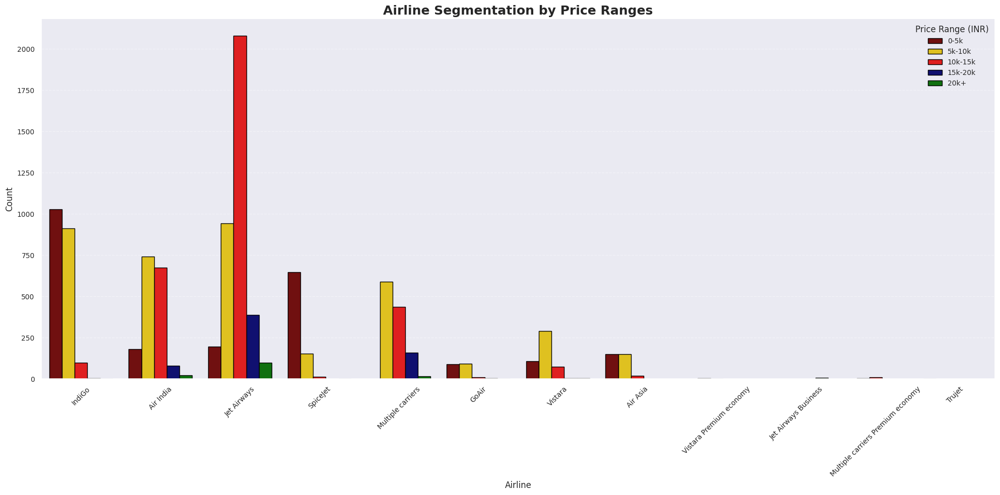

In [24]:
# ===== Visualization code =====
# ===== Bin Price into categories =====
df_air = df.copy()
bins = [0, 5000, 10000, 15000, 20000, df_air['Price'].max()]
labels = ['0-5k', '5k-10k', '10k-15k', '15k-20k', '20k+']
df_air['Price_Range'] = pd.cut(df_air['Price'], bins=bins, labels=labels)

plt.figure(figsize=(20,10))
sns.countplot(
    data=df_air,
    x='Airline',
    hue='Price_Range',
    palette=['#800000', '#FFD700', 'red', 'navy', 'green'],
    edgecolor='black'
)

plt.title("Airline Segmentation by Price Ranges", fontsize=18, weight='bold')
plt.xlabel("Airline", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(title='Price Range (INR)', title_fontsize=12, fontsize=10, loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

### **3.2.3. Airline segmentation analysis of the price variable**

### **Chart-7. Barplot for Airline segmentation analysis of the price variable**

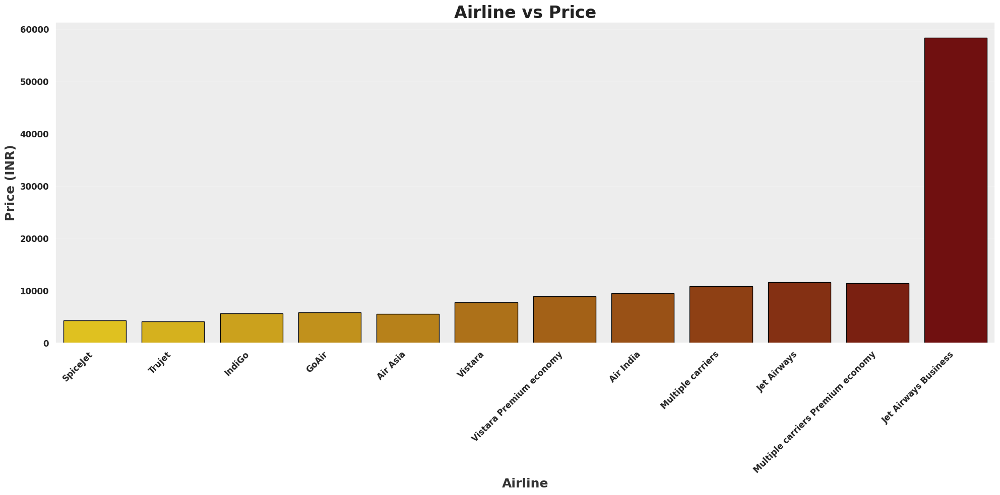

In [25]:
# ===== Figure settings =====
plt.figure(figsize=(20, 10))
ax = plt.gca()

# ===== Sort airlines by median price for better visual =====
airline_order = df.groupby('Airline')['Price'].median().sort_values().index

colors = np.linspace(0, 1, len(df['Airline'].unique()))
cmap = LinearSegmentedColormap.from_list("maroon_gold", ["#FFD700", "#800000"])
bar_colors = [cmap(val) for val in colors]

sns.barplot(
    x='Airline',
    y='Price',
    data=df,
    order=airline_order,
    palette=bar_colors,
    edgecolor='black',
    ci=None
)

ax.set_facecolor('#EDEDED')
ax.grid(axis='y', linestyle='-', alpha=0.2)
plt.title('Airline vs Price', fontsize=24, weight='bold', color='#222222')
plt.xlabel('Airline', fontsize=18, weight='bold', color='#333333')
plt.ylabel('Price (INR)', fontsize=18, weight='bold', color='#333333')
plt.xticks(rotation=45, ha='right', fontsize=12, weight='bold', color='#222222')
plt.yticks(fontsize=12, weight='bold', color='#222222')

plt.tight_layout()
plt.show()

**1. Why did you pick the specific chart?**

* A bar chart is best suited for comparing categorical variables (Airlines) against a numerical variable (Price).

* It provides a clear visual comparison of average ticket prices across different airlines and classes.

* The chart makes it easy to spot outliers and trends, such as which airline or service class is significantly more expensive.

**2. What is/are the insight(s) found from the chart?**

* Low-cost carriers (SpiceJet, Trujet, IndiGo, GoAir, Air Asia) have the lowest average ticket prices (₹4,000–₹6,000).

* Full-service airlines like Vistara and Air India charge moderate fares (₹7,000–₹12,000).

* Premium Economy fares are slightly higher (₹10,000–₹12,000).

* Jet Airways Business Class is a major outlier, priced at ~₹58,000, which is 5–10 times higher than economy fares.

* Pricing differences are influenced more by class of travel than the airline itself.

**3. Will the gained insights help creating a positive business impact?**

*  Yes.

* These insights help in market segmentation (budget vs premium travelers).

* Airlines can adjust pricing strategies and highlight value-added services to justify higher prices.

* Travel agencies and booking platforms can personalize recommendations based on customer budget and preferences, improving customer satisfaction and conversion rates.

* Helps businesses target promotions effectively (e.g., discounts for economy class to attract price-sensitive travelers, premium packages for business class customers).

### **3.2.4. Categorigal features analysis of the price variable**

### **Chart-8. Baxplot for Categorical features analysis of the price variable**

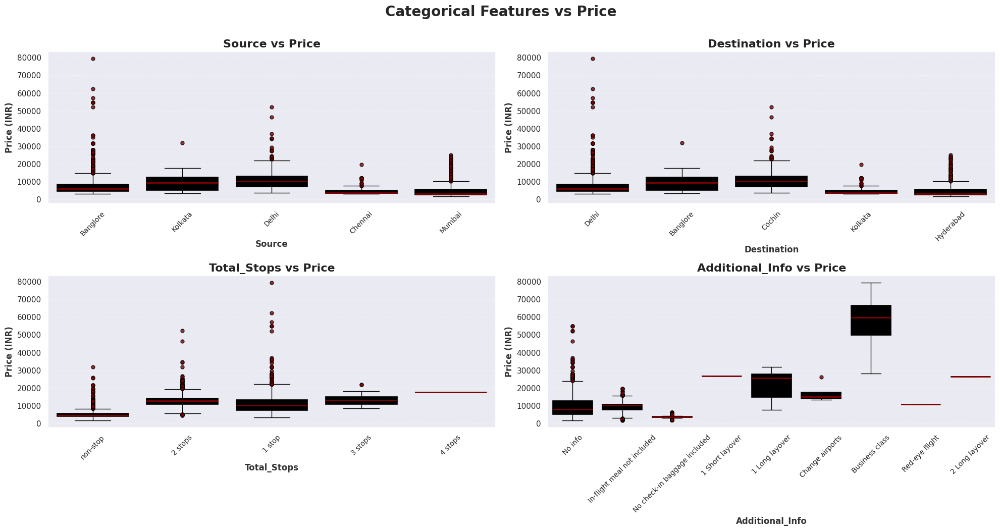

In [26]:
# ===== Select categorical columns excluding 'Route' and 'Airline' =====
categorical_cols = df.select_dtypes(include='object').columns
categorical_cols = [col for col in categorical_cols if col not in ['Route', 'Airline']]

# ===== Figure settings =====
n_cols = 2
n_rows = (len(categorical_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()

# ===== Loop through categorical columns =====
for i, col in enumerate(categorical_cols):
    ax = axes[i]
    # ===== Boxplot =====
    sns.boxplot(
        x=col,
        y='Price',
        data=df,
        ax=ax,
        boxprops=dict(facecolor='#FFD700', color='black', linewidth=1.2),
        whiskerprops=dict(color='black', linewidth=1),
        capprops=dict(color='black', linewidth=1),
        medianprops=dict(color='#800000', linewidth=2),
        flierprops=dict(marker='o', markerfacecolor='#800000', markersize=5, alpha=0.8, markeredgecolor='black')
    )

    ax.set_title(f'{col} vs Price', fontsize=16, weight='bold', color='#222222')
    ax.set_xlabel(col, fontsize=12, weight='bold', color='#333333')
    ax.set_ylabel('Price (INR)', fontsize=12, weight='bold', color='#333333')
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Categorical Features vs Price', fontsize=20, weight='bold', y=1.05)
plt.show()

**1. Source vs Price**

* Flights originating from Delhi and Kolkata generally have higher median prices compared to other cities.

* Chennai and Mumbai show lower price ranges on average.

* Bangalore has a wide range of prices, including extreme outliers (up to 80,000 INR).

* Price variation is highly dependent on source location, suggesting departure city impacts ticket pricing.

**2. Destination vs Price**

* Flights with destination Cochin and Banglore generally show higher price ranges.

* Delhi and Hyderabad destinations have moderate prices.

* Kolkata as a destination is relatively cheaper compared to others.

* Like the source, destination significantly influences ticket price variations.

**3. Total Stops vs Price**

* Non-stop flights are the cheapest overall.

* 1 stop and 2 stops have noticeably higher median prices.

* 3 stops and especially 4 stops flights are very expensive (close to 20k–30k INR consistently).

* Prices increase with the number of stops, though not always linearly (e.g., 1-stop flights are often more expensive than 2-stop flights due to demand/supply factors).

**4. Additional Info vs Price**

* Business class flights have the highest ticket prices, with a wide range reaching 80,000 INR.

* Passengers with “No info” or basic inclusions/exclusions (like no check-in baggage or meals not included) tend to pay less.

* Flights with layovers or changes in airports are priced higher than simple direct ones.

* Red-eye flights are among the cheapest options.

* This shows service and travel conditions strongly influence prices.

**Overall Insights:**

* Ticket prices are strongly influenced by categorical factors like source, destination, number of stops, and additional services.

* Business class and multi-stop flights are significantly more expensive.

* Non-stop, red-eye, and flights from certain cities (like Chennai & Kolkata) tend to be cheaper.

## **3.3. Multivariate Analysis: Examines multiple variables simultaneously**

### **3.3.1. Correlation Heatmap: Highlights correlations between numerical features**

### **Chart-9. Correlation Heatmap**

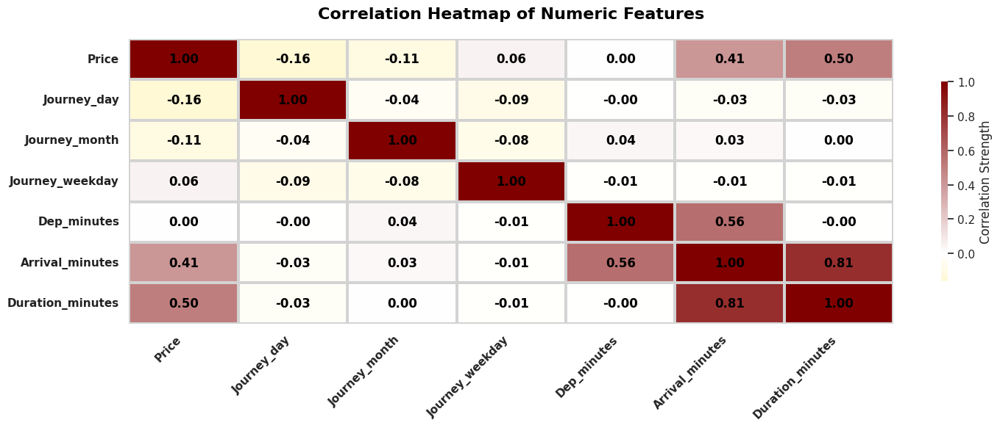

In [27]:
# ===== Correlation Heatmap visualization code =====
numeric_df = df.select_dtypes(include=['number'])

custom_cmap = sns.color_palette("blend:#FFD700,white,#800000", as_cmap=True)

plt.figure(figsize=(15,6))
sns.heatmap(
    numeric_df.corr(),
    annot=True,
    fmt=".2f",
    cmap=custom_cmap,
    center=0,
    linewidths=1.5,
    linecolor="lightgrey",
    annot_kws={"size":12, "weight":"bold", "color":"black"},
    cbar_kws={"shrink":0.7, "aspect":30, "label":"Correlation Strength"}
)

plt.title("Correlation Heatmap of Numeric Features",
          fontsize=16, fontweight="bold", color="black", pad=20)
plt.xticks(rotation=45, ha="right", fontsize=11, weight="bold", color="#222")
plt.yticks(rotation=0, fontsize=11, weight="bold", color="#222")
plt.grid(False)
plt.tight_layout()
plt.show()

**Strong Positive Correlations:**

| Feature 1        | Feature 2         | Correlation (r) |
| ---------------- | ----------------- | --------------- |
| Arrival\_minutes | Duration\_minutes | 0.81            |

**Moderate Positive Correlations:**

| Feature 1    | Feature 2         | Correlation (r) |
| ------------ | ----------------- | --------------- |
| Price        | Arrival\_minutes  | 0.41            |
| Price        | Duration\_minutes | 0.50            |
| Dep\_minutes | Arrival\_minutes  | 0.56            |


**Weak Positive Correlations:**

| Feature 1        | Feature 2        |  Correlation (r)  |
| ---------------- | ---------------- |  -----------------|
| Price            | Journey\_weekday |  0.06             |
| Journey\_month   | Dep\_minutes     |  0.04             |
| Journey\_month   | Arrival\_minutes |  0.03             |

**Weak Negative Correlations:**

| Feature 1      | Feature 2         | Correlation (r) |
| -------------- | ----------------- | --------------- |
| Price          | Journey\_day      | -0.16           |
| Price          | Journey\_month    | -0.11           |
| Journey\_day   | Journey\_month    | -0.04           |
| Journey\_day   | Journey\_weekday  | -0.09           |
| Journey\_day   | Dep\_minutes      | -0.00           |
| Journey\_day   | Arrival\_minutes  | -0.03           |
| Journey\_day   | Duration\_minutes | -0.03           |
| Journey\_month | Journey\_weekday  | -0.08           |


### **3.3.2. Stacked Bar Chart – Airline vs Source vs Price**

### **Chart-10. Stacked Bar Chart – Airline vs Source vs Price**

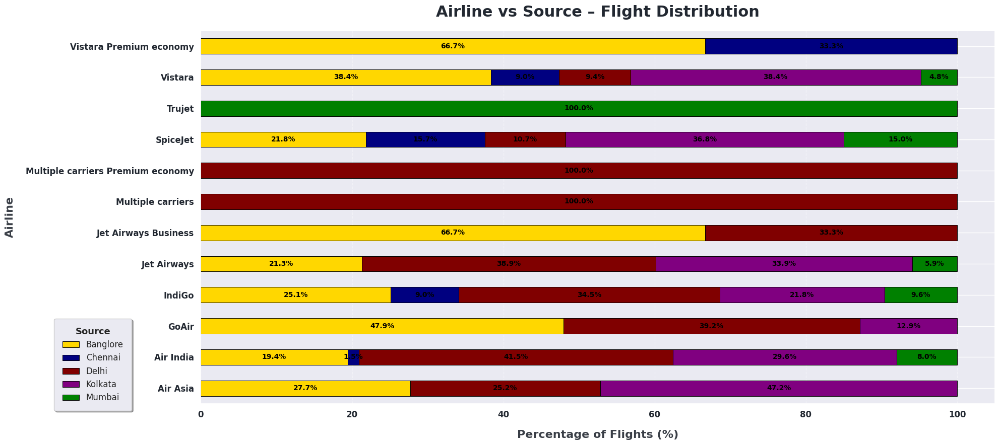

In [28]:
# ===== Stacked Bar Chart – Airline vs Source vs Price   =====
# === Prepare grouped data ===
route_airline = df.groupby(["Airline", "Source"])["Price"].count().unstack().fillna(0)

# ===== Convert counts to percentages =====
route_airline_pct = route_airline.div(route_airline.sum(axis=1), axis=0) * 100

# === Define custom color palette for Sources ===
custom_colors = {
    "Banglore": "gold",
    "Chennai": "navy",
    "Delhi": "maroon",
    "Kolkata": "purple",
    "Mumbai": "green"
}

colors = [custom_colors.get(col, "gray") for col in route_airline_pct.columns]
fig, ax = plt.subplots(figsize=(20,9))
route_airline_pct.plot(
    kind="barh",
    stacked=True,
    color=colors,
    edgecolor="black",
    linewidth=0.7,
    ax=ax
)

# Title & Labels
plt.title("Airline vs Source – Flight Distribution", fontsize=22, weight="bold", color="#222831", pad=20)
plt.xlabel("Percentage of Flights (%)", fontsize=16, weight="bold", color="#393E46", labelpad=15)
plt.ylabel("Airline", fontsize=16, weight="bold", color="#393E46", labelpad=15)

# Y-axis ticks
plt.yticks(fontsize=12, weight="bold", color="#222831")

# X-axis ticks
plt.xticks(fontsize=12, weight="bold", color="#222831")

# Grid only on x-axis
plt.grid(axis="x", linestyle="--", alpha=0.4)

# Legend styling (bottom left, outside plot area)
legend = plt.legend(
    title="Source",
    fontsize=12,
    title_fontsize=13,
    loc="lower left",
    bbox_to_anchor=(-0.19, -0.03),
    frameon=True,
    shadow=True,
    fancybox=True,
    borderpad=1
)
plt.setp(legend.get_title(), weight="bold")

# === Annotate percentages inside bars (skip 0%) ===
for container in ax.containers:
    labels = [f"{w:.1f}%" if w > 0 else "" for w in container.datavalues]
    ax.bar_label(container, labels=labels, label_type="center", fontsize=10, weight="bold", color="black")

plt.tight_layout()
plt.show()

### **Insights:**

* Bangalore is the leading source city, dominating airlines like Vistara Premium Economy (66.7%) and Jet Airways Business (66.7%).

* Delhi is the second strongest hub, contributing 100% for Multiple carriers and over 40% for Air India.

* TruJet flights originate only from Kolkata (100%), showing city exclusivity.

* Multiple carriers (regular and premium economy) depend entirely on Delhi (100%).

* SpiceJet shows a balanced spread, with Hyderabad (36.8%), Bangalore (21.8%), Chennai (15.7%), and Mumbai (15%).

* Vistara is also well distributed, with nearly equal contributions from Bangalore (38.4%) and Hyderabad (38.4%).

* IndiGo has the widest mix: Delhi (34.5%), Bangalore (25.1%), and notable shares from other cities.

* GoAir is split between Bangalore (47.9%) and Delhi (39.2%), with a smaller share from Mumbai (12.9%).

* Air India is Delhi-heavy (41.5%), but also significant in Hyderabad (29.6%) and Bangalore (19.4%).

* Mumbai and Chennai play supporting roles, contributing moderate shares in multi-city airlines but rarely dominate.

### **3.3.3. Pairplot**

### **Chart-11. Pairplot**

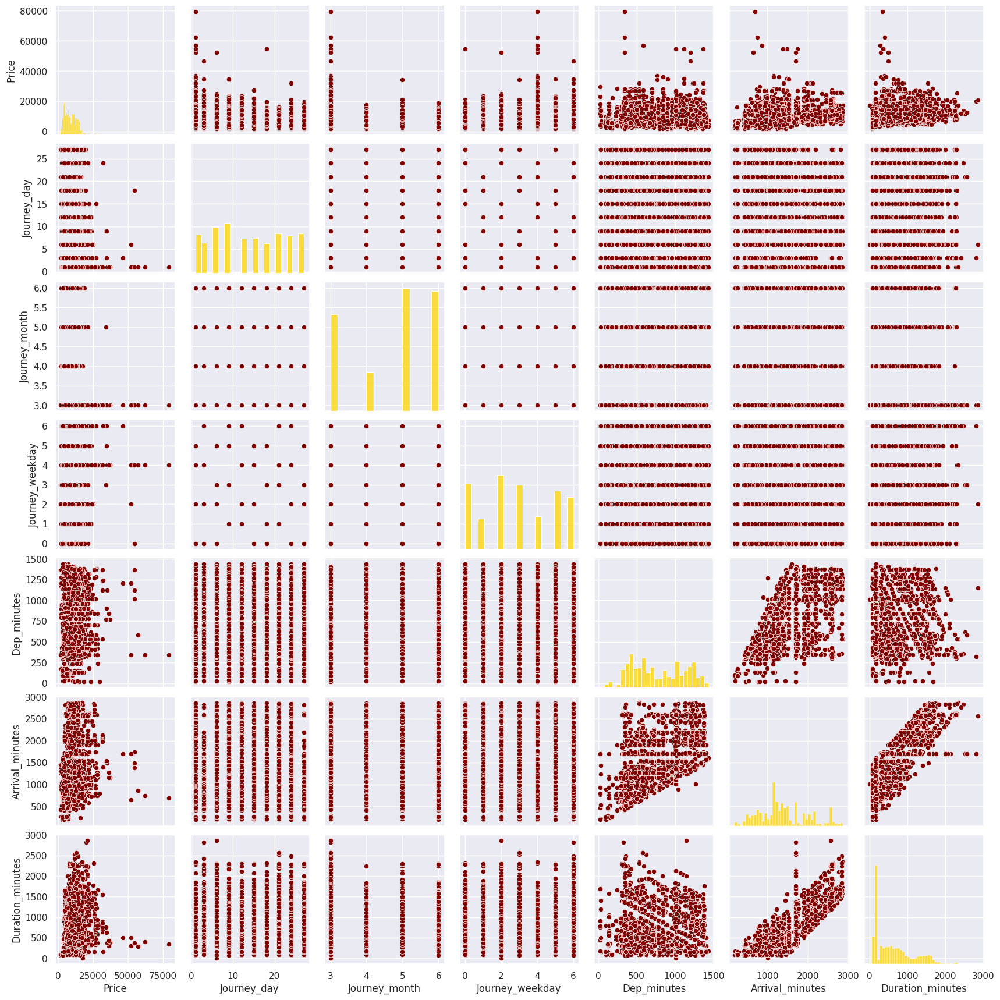

In [29]:
# ===== Pair Plot visualization code =====
numeric_df = df.select_dtypes(include=['number'])

sns.pairplot(numeric_df, plot_kws={"color": "maroon"}, diag_kws={"color": "#FFD700"})
plt.show()

**1. Why did you pick the specific chart?**

* Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters.

## **3.4. Hypothesis Testing**

### Based on the chart experiments, define three hypothetical statements about the dataset. In the next three answers, perform hypothesis testing to obtain a final conclusion about the statements through your code and statistical testing.

### **3.4.1. Hypothetical Statement - 1**

### **1. State Your research hypothesis as a null hypothesis and alternate hypothesis.**

**Hypotheses:**

* Null Hypothesis (H0): Average flight price is the same across all airlines.

* Alternative Hypothesis (H1): Average flight price significantly differs among airlines.

### **2. Perform an appropriate statistical test**

In [30]:
# ===== Create contingency table =====
# ===== Group prices by Airline =====
groups = [df[df['Airline'] == airline]['Price'] for airline in df['Airline'].unique()]

# ===== Perform ANOVA =====
f_stat, p_val = f_oneway(*groups)

print("Airline vs Price - ANOVA Test\n")
print("F-statistic:", f_stat)
print("P-value:", p_val)

# ===== Interpretation =====
if p_val < 0.05:
    print("\nResult: Reject H0 → Airline has a significant impact on flight price.")
else:
    print("\nResult: Fail to Reject H0 → No significant difference across Airlines.")

Airline vs Price - ANOVA Test

F-statistic: 654.1998364047217
P-value: 0.0

Result: Reject H0 → Airline has a significant impact on flight price.


**Why One-way ANOVA test?**

* Because Airline is categorical and Price is continuous, ANOVA tests whether the mean prices differ significantly across multiple airlines.

### **3. Business Insight:**

* Different airlines charge significantly different ticket prices → pricing is not uniform across airlines.

* Airline choice strongly influences customer cost, so passengers may compare airlines for affordability, while airlines can use this insight for competitive pricing.

### **3.4.2. Hypothetical Statement - 2**

### **1. State Your research hypothesis as a null hypothesis and alternate hypothesis.**

**Hypotheses:**

* Null Hypothesis (H0): The number of stops has no impact on ticket prices.

* Alternative Hypothesis (H1): The number of stops significantly affects ticket prices.

### **2. Perform an appropriate statistical test**

In [31]:
# ===== Create contingency table =====
# ===== Group prices by Total Stops =====
groups = [df[df['Total_Stops'] == stop]['Price'] for stop in df['Total_Stops'].unique()]

# ===== Perform ANOVA =====
f_stat, p_val = f_oneway(*groups)

print("Total_Stops vs Price - ANOVA Test\n")
print("F-statistic:", f_stat)
print("P-value:", p_val)

# ===== Interpretation =====
if p_val < 0.05:
    print("\nResult: Reject H0 → Number of stops significantly affects flight price.")
else:
    print("\nResult: Fail to Reject H0 → Stops do not significantly affect flight price.")

Total_Stops vs Price - ANOVA Test

F-statistic: 1722.028490860059
P-value: 0.0

Result: Reject H0 → Number of stops significantly affects flight price.


**Why One-way ANOVA test?**

* Total_Stops is a categorical variable with more than two groups (non-stop, 1 stop, 2 stops, etc.).

* ANOVA checks if the average ticket prices are significantly different across these multiple categories.

### **3. Business Insight:**

* Flights with longer durations or multiple stops tend to be priced higher, showing that passengers are often paying extra for convenience and faster travel.

* Airlines can use this to optimize pricing strategies by offering competitive fares on high-demand, time-saving routes.

### **3.4.3. Hypothetical Statement - 3**

### **1. State Your research hypothesis as a null hypothesis and alternate hypothesis.**

**Hypotheses:**

* Null Hypothesis (H0): Flight duration has no correlation with ticket price.

* Alternative Hypothesis (H1): Flight duration is significantly correlated with ticket price.

### **2. Perform an appropriate statistical test**

In [32]:
# ===== Create contingency table =====
# ===== Perform Pearson Correlation =====
corr, p_val = pearsonr(df['Duration_minutes'], df['Price'])

print("\nDuration vs Price - Correlation Test\n")
print("Correlation Coefficient:", corr)
print("P-value:", p_val)

# ===== Interpretation =====
if p_val < 0.05:
    print("\nResult: Reject H0 → Flight duration is significantly correlated with Price.")
else:
    print("\nResult: Fail to Reject H0 → No significant correlation between Duration and Price.")


Duration vs Price - Correlation Test

Correlation Coefficient: 0.5017099519431807
P-value: 0.0

Result: Reject H0 → Flight duration is significantly correlated with Price.


**Why Correlation test?**

* Both Duration_minutes and Price are numeric (continuous) variables.

* Correlation test (Pearson’s r) checks whether there is a linear relationship between flight duration and ticket price.


### **3. Business Insight:**

* Longer flight durations are strongly associated with higher ticket prices. This indicates that as the travel time increases (especially for long-haul routes), the price tends to rise, which is crucial for both airlines in pricing strategy and passengers in planning cost-effective journeys.

# **4. Data Pre-Processing**

## **4.1. Handling Missing Values / Null Values**

In [33]:
# ===== Finding a missing values =====
df.isnull().sum().to_frame("Missing_Values")

,Missing_Values
Airline,0
Source,0
Destination,0
Route,0
Total_Stops,0
Additional_Info,0
Price,0
Journey_day,0
Journey_month,0
Journey_weekday,0


The dataset has been checked for missing values, and no null or missing entries were found, indicating that the data is complete and clean for analysis.

## **4.2. Handling Outliers: Detection and Treatment Strategies**

### **4.2.1. Perform outlier detection:**

### **Chart-12. Plotting box plots for all numerical variable**

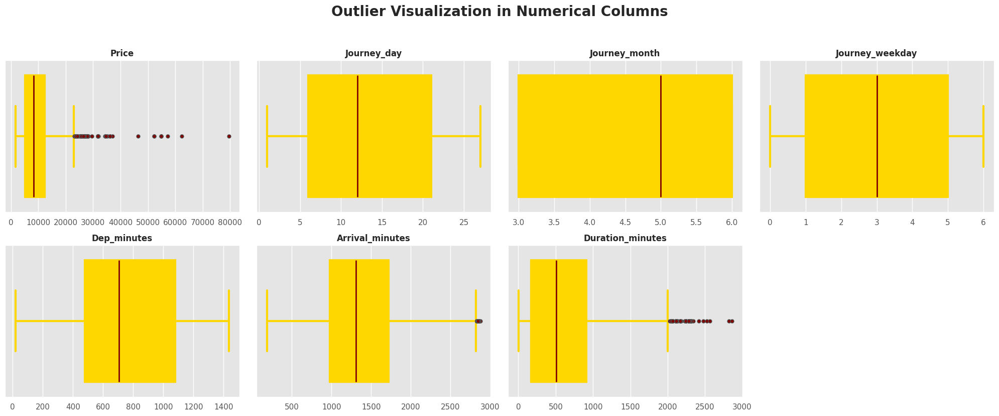

In [34]:
# ===== Plotting box plots for all numerical variable =====
numeric_df = df.select_dtypes(include=['number'])

# ===== Background =====
plt.style.use('ggplot')

plt.figure(figsize=(20, 15))
num_plots = min(len(numeric_df.columns), 13)

for i, col in enumerate(numeric_df.columns[:num_plots]):
    plt.subplot(4, 4, i + 1)

    sns.boxplot(
        data=df,
        x=col,
        boxprops=dict(color='#FFD700', facecolor='#800000', linewidth=3),
        flierprops=dict(marker='o', markerfacecolor='#800000', markersize=5, linestyle='none'),
        medianprops=dict(color='#800000', linewidth=2),
        whiskerprops=dict(color='#FFD700', linewidth=3),
        capprops=dict(color='#FFD700', linewidth=3)
    )

    plt.title(col, fontsize=12, fontweight='bold')
    plt.xlabel('')

plt.suptitle("Outlier Visualization in Numerical Columns", fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### **4.2.2. Calculate the number of outliers and their percentage:**

In [35]:
# ===== Defining the function for outlier detection and percentage calculation using IQR =====

def detect_outliers(data):
    data = np.array(data)

    # ===== Quartiles =====
    q1 = np.percentile(data, 25)
    q2 = np.percentile(data, 50)
    q3 = np.percentile(data, 75)

    # ===== IQR & boundsa =====
    IQR = q3 - q1
    lower_bound = q1 - 1.5 * IQR
    upper_bound = q3 + 1.5 * IQR

    # ===== Outlier detection =====
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    outlier_count = len(outliers)
    outlier_percent = round(outlier_count * 100 / len(data), 2)

    # ===== Display results =====
    print(f"Q1 = {q1}, Q2 (Median) = {q2:.2f}, Q3 = {q3}")
    print(f"IQR = {IQR:.2f}")
    print(f"Lower Bound = {lower_bound:.2f}, Upper Bound = {upper_bound:.2f}")
    print(f"Outliers Detected: {outlier_count}")
    print(f"Outlier Percentage: {outlier_percent}%\n")

In [36]:
# ===== Calculating IQR, Lower/Upper Bounds, and Outlier Counts for Continuous Numerical Features =====

for feature in numeric_df:
  print(feature,":")
  detect_outliers(df[feature])
  print("*"*50)

Price :
Q1 = 5224.0, Q2 (Median) = 8266.00, Q3 = 12346.25
IQR = 7122.25
Lower Bound = -5459.38, Upper Bound = 23029.62
Outliers Detected: 94
Outlier Percentage: 0.9%

**************************************************
Journey_day :
Q1 = 6.0, Q2 (Median) = 12.00, Q3 = 21.0
IQR = 15.00
Lower Bound = -16.50, Upper Bound = 43.50
Outliers Detected: 0
Outlier Percentage: 0.0%

**************************************************
Journey_month :
Q1 = 3.0, Q2 (Median) = 5.00, Q3 = 6.0
IQR = 3.00
Lower Bound = -1.50, Upper Bound = 10.50
Outliers Detected: 0
Outlier Percentage: 0.0%

**************************************************
Journey_weekday :
Q1 = 1.0, Q2 (Median) = 3.00, Q3 = 5.0
IQR = 4.00
Lower Bound = -5.00, Upper Bound = 11.00
Outliers Detected: 0
Outlier Percentage: 0.0%

**************************************************
Dep_minutes :
Q1 = 480.0, Q2 (Median) = 705.00, Q3 = 1080.0
IQR = 600.00
Lower Bound = -420.00, Upper Bound = 1980.00
Outliers Detected: 0
Outlier Percentage: 0.0%

| Feature Name          | Outlier % | Action   | Reason                                                                   |
| --------------------- | --------- | -------- | ------------------------------------------------------------------------ |
| **Price**             | 0.9%      | **Rectify**  | Small % of high-ticket prices; may represent premium/business class.     |
| **Journey\_day**      | 0.0%      | Keep     | No outliers detected; values lie within 1–31.                            |
| **Journey\_month**    | 0.0%      | Keep     | No outliers detected; values are within valid month range (1–12).        |
| **Journey\_weekday**  | 0.0%      | Keep     | No outliers detected; weekdays range between 0–6.                        |
| **Dep\_minutes**      | 0.0%      | Keep     | No outliers detected; departure times are valid (0–1440 min).            |
| **Arrival\_minutes**  | 0.54%     | Keep | Very few late arrivals; possible due to long-haul flights.               |
| **Duration\_minutes** | 0.72%     | **Rectify**  | Some extreme durations; may reflect connecting or international flights. |

### **4.2.3. Outlier removal operation:**

In [37]:
# ===== Defining the function for outlier removal code =====

def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    filtered_df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    print(f"Removed {df.shape[0] - filtered_df.shape[0]} outliers from '{column}'")
    return filtered_df

In [38]:
# ===== Run code =====
# ===== copy for camparison purposs =====
df_clean = df.copy()

df_clean = remove_outliers_iqr(df_clean, 'Price')
df_clean = remove_outliers_iqr(df_clean, 'Duration_minutes')

Removed 94 outliers from 'Price'
Removed 74 outliers from 'Duration_minutes'


### **4.2.4. After the outliers were removed:**

### **Chart-13. Boxplot Comparison (Before and After)**

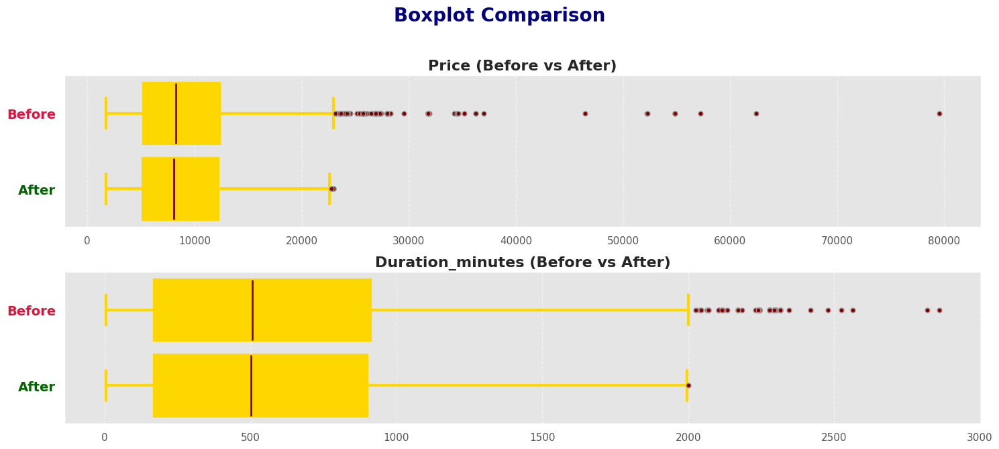

In [39]:
# ===== Boxplot comparison code =====

box_style = dict(
    boxprops=dict(color='#FFD700', facecolor='#FFD700', linewidth=3),
    flierprops=dict(marker='o', markerfacecolor='#800000', markersize=5, linestyle='none'),
    medianprops=dict(color='#800000', linewidth=2),
    whiskerprops=dict(color='#FFD700', linewidth=3),
    capprops=dict(color='#FFD700', linewidth=3)
)

columns_to_plot = ['Price', 'Duration_minutes']
titles = ['Price', 'Duration_minutes']

fig, axes = plt.subplots(2, 1, figsize=(15, 7))

for i, col in enumerate(columns_to_plot):
    combined_data = pd.concat([df[col], df_clean[col]])
    group_labels = ['Before'] * len(df[col]) + ['After'] * len(df_clean[col])

    sns.boxplot(
        y=group_labels,
        x=combined_data,
        ax=axes[i],
        color='white',
        **box_style
    )

    axes[i].set_title(f'{titles[i]} (Before vs After)', fontsize=16, fontweight='bold')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].grid(True, axis='x', linestyle='--', alpha=0.5)

    axes[i].set_yticklabels(['Before', 'After'], fontsize=14, weight='bold')
    for tick in axes[i].get_yticklabels():
        if tick.get_text() == 'Before':
            tick.set_color('crimson')
        elif tick.get_text() == 'After':
            tick.set_color('darkgreen')

plt.suptitle('Boxplot Comparison', fontsize=20, fontweight='bold', color='navy')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [40]:
# ===== After comparing box plots, I made the following changes =====

df = df_clean.copy()

# **5. Feature Engineering**

## **5.1. Feature Selection**

### **5.1.1. Encoding Categorical Variables**

In [41]:
# ===== Categorical Features =====
# ===== Run code =====
categorical_cols = df.select_dtypes(include='object')
for col in categorical_cols:
    print(f"Column: '{col}'")
    print(f" * Unique Categories: {df[col].nunique()}")
    print(f" * Category Distribution:\n{df[col].value_counts(dropna=False)}")
    print("-" * 35)

Column: 'Airline'
 * Unique Categories: 11
 * Category Distribution:
Airline
Jet Airways                          3613
IndiGo                               2043
Air India                            1630
Multiple carriers                    1186
SpiceJet                              814
Vistara                               477
Air Asia                              318
GoAir                                 194
Multiple carriers Premium economy      13
Vistara Premium economy                 3
Trujet                                  1
Name: count, dtype: int64
-----------------------------------
Column: 'Source'
 * Unique Categories: 5
 * Category Distribution:
Source
Delhi       4271
Kolkata     2853
Banglore    2097
Mumbai       690
Chennai      381
Name: count, dtype: int64
-----------------------------------
Column: 'Destination'
 * Unique Categories: 5
 * Category Distribution:
Destination
Cochin       4271
Banglore     2853
Delhi        2097
Hyderabad     690
Kolkata       381
Name

| **Feature Name** | **Type**                     | **Example Values**                                   | **Recommended Encoding**        | **Reason**                                                       |
| ---------------- | ---------------------------- | ---------------------------------------------------- | ------------------------------- | ---------------------------------------------------------------- |
| Airline          | Categorical (Multi-class)    | Jet Airways, IndiGo, Air India, SpiceJet, Vistara    | **One-Hot Encoding**            | Nominal variable with no order; model should not assume ranking. |
| Source           | Categorical (Multi-class)    | Delhi, Kolkata, Banglore, Mumbai, Chennai            | **One-Hot Encoding**            | Nominal locations; no ordinal relationship.                      |
| Destination      | Categorical (Multi-class)    | Cochin, Banglore, Delhi, Hyderabad, Kolkata          | **One-Hot Encoding**            | Nominal locations; no ordinal relationship.                      |
| Route            | High-cardinality Categorical | DEL → BOM → COK, BLR → DEL, CCU → BLR (125 unique)   | **Target / Frequency Encoding** | Too many categories; one-hot would explode dimensionality.       |
| Total\_Stops     | Ordinal Categorical          | non-stop, 1 stop, 2 stops, 3 stops, 4 stops          | **Ordinal Encoding**            | Clear increasing order; can be mapped (e.g., 0–4).               |
| Additional\_Info | Categorical (Multi-class)    | No info, In-flight meal not included, Red-eye flight | **One-Hot Encoding**            | Few categories, no order; one-hot is simple and effective.       |


In [42]:
# ===== Encode the categorical features =====
# ===== Define Feature Groups =====
one_hot_features = ["Airline", "Source", "Destination", "Additional_Info"]
ordinal_features = ["Total_Stops"]
frequency_features = ['Route']

# Ordinal mapping for Total_Stops
ordinal_mapping = [['non-stop', '1 stop', '2 stops', '3 stops', '4 stops']]

# ===== Build Encoding Pipeline =====
preprocessor = ColumnTransformer(
    transformers=[
        ("onehot", OneHotEncoder(drop="first"), one_hot_features),
        ("ordinal", OrdinalEncoder(categories=ordinal_mapping), ordinal_features),
        ("freq", CountEncoder(), frequency_features)
    ],
    # ===== keep numeric + binary features =====
    remainder="passthrough"
)

# ===== Fit & Transform =====
df_fit = preprocessor.fit_transform(df)

# ===== Get Feature Names =====
onehot_feature_names = preprocessor.named_transformers_["onehot"].get_feature_names_out(one_hot_features)
ordinal_feature_names = ordinal_features
frequency_features_names = frequency_features
passthrough_features = [col for col in df.columns if col not in one_hot_features + ordinal_features + frequency_features]

# Final feature names
final_feature_names = list(onehot_feature_names) + ordinal_feature_names + frequency_features_names + passthrough_features

# ===== Convert to DataFrame =====
df_encoded = pd.DataFrame(df_fit, columns=final_feature_names, index=df.index)

# ===== Convert all boolean columns to integers =====
bool_cols = df_encoded.select_dtypes(include='bool').columns
df_encoded[bool_cols] = df_encoded[bool_cols].astype(int)

# ===== Final Output =====
print("Shape of encoded dataset:", df_encoded.shape)
print(df_encoded.head())

Shape of encoded dataset: (10292, 32)
   Airline_Air India  Airline_GoAir  Airline_IndiGo  Airline_Jet Airways  \
0                0.0            0.0             1.0                  0.0   
1                1.0            0.0             0.0                  0.0   
2                0.0            0.0             0.0                  1.0   
3                0.0            0.0             1.0                  0.0   
4                0.0            0.0             1.0                  0.0   

   Airline_Multiple carriers  Airline_Multiple carriers Premium economy  \
0                        0.0                                        0.0   
1                        0.0                                        0.0   
2                        0.0                                        0.0   
3                        0.0                                        0.0   
4                        0.0                                        0.0   

   Airline_SpiceJet  Airline_Trujet  Airline_Vistara  

This code is building a clean encoding pipeline for the Flight Price Prediction dataset. First, binary or numeric features are kept as they are using remainder="passthrough". Then, categorical variables such as Airline, Source, Destination, and Additional_Info are transformed using One-Hot Encoding, while Total_Stops is handled with Ordinal Encoding based on the natural stop hierarchy (non-stop < 1 stop < 2 stops < …). The Route feature is encoded using Frequency Encoding to capture the importance of popular versus rare routes. After transformation, the code neatly reconstructs a DataFrame with proper feature names, ensuring that the dataset is fully prepared for downstream machine learning models.

In [43]:
# ===== Checking =====
df_encoded.tail(10).T

,10671,10674,10675,10676,10677,10678,10679,10680,10681,10682
Airline_Air India,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
Airline_GoAir,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Airline_IndiGo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Airline_Jet Airways,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
Airline_Multiple carriers,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Airline_Multiple carriers Premium economy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Airline_SpiceJet,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Airline_Trujet,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Airline_Vistara,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Airline_Vistara Premium economy,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### **5.1.2. Correlation Heatmap of Features**

### **Chart-14. Correlation Heatmap of Features**

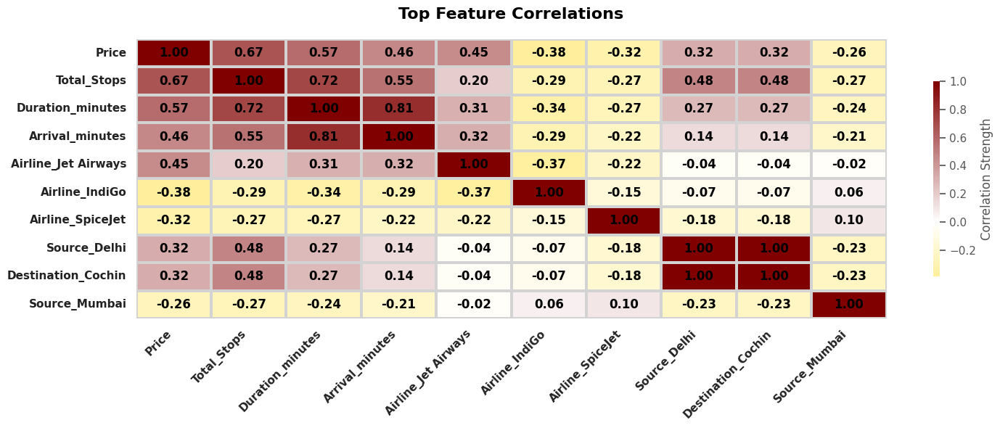

In [44]:
# ===== Select your features wisely to avoid overfitting =====
# ===== Correlation Heatmap visualization code =====

corr = df_encoded.corr(numeric_only=True)
top_features = corr.abs().nlargest(10, 'Price').index
top_corr = df_encoded[top_features].corr()

custom_cmap = sns.color_palette("blend:#FFD700,white,#800000", as_cmap=True)

plt.figure(figsize=(15,6))
sns.heatmap(
    top_corr,
    annot=True,
    fmt=".2f",
    cmap=custom_cmap,
    center=0,
    linewidths=1.5,
    linecolor="lightgrey",
    annot_kws={"size":12, "weight":"bold", "color":"black"},
    cbar_kws={"shrink":0.7, "aspect":30, "label":"Correlation Strength"}
)

plt.title("Top Feature Correlations",
          fontsize=16, fontweight="bold", color="black", pad=20)
plt.xticks(rotation=45, ha="right", fontsize=11, weight="bold", color="#222")
plt.yticks(rotation=0, fontsize=11, weight="bold", color="#222")
plt.grid(False)
plt.tight_layout()
plt.show()

The final dataframe will include only the most influential features, with multicollinearity checked using Variance Inflation Factor (VIF)

| **Feature**              | **Correlation with Price** | **Type of Relationship** | **Observation**                                                          |
| ------------------------ | -------------------------- | ------------------------ | ------------------------------------------------------------------------ |
| **Total\_Stops**         | +0.67                      | Strong Positive          | More stops significantly increase ticket prices.                         |
| **Duration\_minutes**    | +0.57                      | Positive                 | Longer flight durations tend to have higher prices.                      |
| **Arrival\_minutes**     | +0.46                      | Positive                 | Later arrival times are moderately linked with higher ticket prices.     |
| **Airline\_Jet Airways** | +0.45                      | Positive                 | Jet Airways tickets are strongly associated with higher prices.          |
| **Airline\_IndiGo**      | -0.38                      | Negative                 | IndiGo flights generally have lower ticket prices.                       |
| **Airline\_SpiceJet**    | -0.32                      | Negative                 | SpiceJet flights are associated with cheaper prices.                     |
| **Source\_Delhi**        | +0.32                      | Positive                 | Flights originating from Delhi are moderately linked with higher prices. |
| **Destination\_Cochin**  | +0.32                      | Positive                 | Cochin as a destination correlates with higher flight prices.            |
| **Source\_Mumbai**       | -0.26                      | Negative                 | Mumbai-origin flights tend to have lower prices.                         |


**The strongest predictors for Price are:**

* Positive: Total_Stops, Duration_minutes, Arrival_minutes, Airline_Jet Airways, Source_Delhi, Destination_Cochin

* Negative: Airline_IndiGo, Airline_SpiceJet, Source_Mumbai

### **5.1.3. Variance Inflation Factor**

In [45]:
# ===== Defining a function for variance_inflation_factor =====

def calc_vif(df):
    """
    Calculates Variance Inflation Factor (VIF) for each numerical feature in the dataframe.

    Parameters:
        df (pd.DataFrame): Input dataframe with features

    Returns:
        pd.DataFrame: VIF values sorted in descending order
    """
    # ===== Select only numeric columns =====
    X = df.select_dtypes(include=[np.number])

    # ===== Add constant to the model for intercept =====
    X = add_constant(X)

    # ===== Compute VIF for each feature =====
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    # ===== Drop the constant term and sort results =====
    vif_data = vif_data[vif_data["Feature"] != "const"]
    return vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)

### **VIF (Variance Inflation Factor):**

Calculating VIF(Variance Inflation Factor) by excluding:

| **VIF Value** | **Interpretation**                           |
| ------------- | -------------------------------------------- |
| 1             | No multicollinearity                         |
| 1–5           | Moderate multicollinearity (generally okay)  |
| > 5           | High multicollinearity (needs investigation) |
| > 10          | Severe multicollinearity (consider removal)  |

"Price" -> As it is target variable

In [46]:
# ===== Run code =====
df_encoded_vif = df_encoded.drop("Price", axis=1).copy()
vif_result = calc_vif(df_encoded_vif)
print(vif_result)

                                         Feature         VIF
0                                 Source_Kolkata         inf
1                                  Source_Mumbai         inf
2                             Destination_Cochin         inf
3                                   Source_Delhi         inf
4                                 Source_Chennai         inf
5                          Destination_Hyderabad         inf
6                              Destination_Delhi         inf
7                            Destination_Kolkata         inf
8                        Additional_Info_No info  197.207779
9    Additional_Info_In-flight meal not included  176.318554
10                               Arrival_minutes   77.797906
11                              Duration_minutes   52.058923
12  Additional_Info_No check-in baggage included   36.026966
13                                   Dep_minutes   26.214838
14                           Airline_Jet Airways    9.309516
15                      

**1. Extremely High VIF (very strong multicollinearity)**

| **Variable**                                   | **VIF** | **Observation**                                                               |
| ---------------------------------------------- | ------- | ----------------------------------------------------------------------------- |
| Source\_Kolkata                                | ∞       | Perfect multicollinearity with other Source/Destination features.             |
| Source\_Mumbai                                 | ∞       | Perfect multicollinearity with other Source/Destination features.             |
| Source\_Delhi                                  | ∞       | Perfect multicollinearity with other Source/Destination features.             |
| Source\_Chennai                                | ∞       | Perfect multicollinearity with other Source/Destination features.             |
| Destination\_Cochin                            | ∞       | Perfect multicollinearity with other Destination variables.                   |
| Destination\_Hyderabad                         | ∞       | Perfect multicollinearity with other Destination variables.                   |
| Destination\_Delhi                             | ∞       | Perfect multicollinearity with other Destination variables.                   |
| Destination\_Kolkata                           | ∞       | Perfect multicollinearity with other Destination variables.                   |
| Additional\_Info\_No info                      | 197.21  | Extremely high redundancy, not informative when combined with other features. |
| Additional\_Info\_In-flight meal not included  | 176.32  | Extremely high redundancy, overlaps with other `Additional_Info` categories.  |
| Arrival\_minutes                               | 77.80   | Very strong correlation with Duration and Departure time.                     |
| Duration\_minutes                              | 52.06   | Multicollinear with Arrival/Departure minutes.                                |
| Additional\_Info\_No check-in baggage included | 36.03   | Strong redundancy with other `Additional_Info` features.                      |
| Dep\_minutes                                   | 26.21   | Multicollinear with Duration and Arrival time.                                |


**2. High Multicollinearity**

| **Variable**         | **VIF** | **Observation**                                      |
| -------------------- | ------- | ---------------------------------------------------- |
| Airline\_Jet Airways | 9.31    | High correlation with other airline dummy variables. |


**3. Moderate Multicollinearity**

| **Variable**               | **VIF** | **Observation**                                 |
| -------------------------- | ------- | ----------------------------------------------- |
| Airline\_IndiGo            | 6.11    | Some correlation with other airline categories. |
| Airline\_Air India         | 5.63    | Some correlation with other airline categories. |
| Airline\_Multiple carriers | 5.02    | Some correlation with other airline categories. |


**4. Low VIF (safe to keep)**

| **Variable**                               | **VIF** | **Observation**                      |
| ------------------------------------------ | ------- | ------------------------------------ |
| Airline\_SpiceJet                          | 3.96    | Safe, minor correlation.             |
| Total\_Stops                               | 3.72    | Safe, slight correlation with Route. |
| Airline\_Vistara                           | 2.46    | Safe, low correlation.               |
| Route                                      | 2.02    | Safe, captures travel path info.     |
| Additional\_Info\_Change airports          | 1.67    | Safe, independent.                   |
| Airline\_GoAir                             | 1.61    | Safe, independent.                   |
| Additional\_Info\_Red-eye flight           | 1.12    | Safe, independent.                   |
| Journey\_month                             | 1.10    | Safe, independent.                   |
| Airline\_Multiple carriers Premium economy | 1.06    | Safe, independent.                   |
| Journey\_day                               | 1.03    | Safe, independent.                   |
| Journey\_weekday                           | 1.02    | Safe, independent.                   |
| Airline\_Vistara Premium economy           | 1.01    | Safe, independent.                   |
| Airline\_Trujet                            | 1.01    | Safe, independent.                   |


**Observations:**

* Source & Destination dummies create perfect multicollinearity (VIF = ∞) since they are mutually exclusive categories.

* Time-related variables (Dep_minutes, Arrival_minutes, Duration_minutes) are highly correlated, leading to inflated VIF values.

* Variables with VIF < 5 are perfectly fine for modeling.

Based on observational insights, the final model will use these 8 influential features, excluding the target variable 'Price'

| S.No | Feature Name      | Reason for Choosing                                                                                              |
| ---- | ----------------- | ---------------------------------------------------------------------------------------------------------------- |
| 1    | airline           | Categorical feature representing different airlines; flight prices vary significantly depending on the airline.  |
| 2    | total\_stops      | Number of stops in the journey; more stops usually reduce price, making it a strong predictor of flight cost.    |
| 3    | route             | Flight path from source to destination; captures route-specific pricing patterns and stop combinations.          |
| 4    | journey\_day      | Day of the month when the flight is scheduled; helps capture date-specific pricing trends.                       |
| 5    | Journey\_weekday  | Day of the week; helps model weekly demand patterns, e.g., weekends vs weekdays.                                 |
| 6    | Journey\_month    | Month of travel; captures seasonal trends and peak/off-peak pricing.                                             |
| 7    | Arrival\_minutes  | Arrival time in minutes; affects price based on arrival convenience, while duration captures the journey length. |
| 8    | Duration\_minutes | Total flight duration in minutes; longer flights generally cost more, making it a key predictor.                 |

### **5.1.4. Feature selection:**

In [47]:
# ===== Checking =====
df_encoded.columns

Index(['Airline_Air India', 'Airline_GoAir', 'Airline_IndiGo',
       'Airline_Jet Airways', 'Airline_Multiple carriers',
       'Airline_Multiple carriers Premium economy', 'Airline_SpiceJet',
       'Airline_Trujet', 'Airline_Vistara', 'Airline_Vistara Premium economy',
       'Source_Chennai', 'Source_Delhi', 'Source_Kolkata', 'Source_Mumbai',
       'Destination_Cochin', 'Destination_Delhi', 'Destination_Hyderabad',
       'Destination_Kolkata', 'Additional_Info_Change airports',
       'Additional_Info_In-flight meal not included',
       'Additional_Info_No check-in baggage included',
       'Additional_Info_No info', 'Additional_Info_Red-eye flight',
       'Total_Stops', 'Route', 'Price', 'Journey_day', 'Journey_month',
       'Journey_weekday', 'Dep_minutes', 'Arrival_minutes',
       'Duration_minutes'],
      dtype='object')

In [48]:
# ===== Creating final dataframe considering above selected features =====
final_df= df_encoded[['Airline_Air India', 'Airline_GoAir', 'Airline_IndiGo', 'Airline_Jet Airways', 'Airline_Multiple carriers', 'Airline_Multiple carriers Premium economy',
                      'Airline_SpiceJet', 'Airline_Trujet', 'Airline_Vistara', 'Airline_Vistara Premium economy', 'Route', 'Total_Stops', 'Journey_day', 'Journey_month',
                      'Journey_weekday', 'Arrival_minutes', 'Duration_minutes', 'Price']]

**Categorical Features:**

* Airline_Air India

* Airline_GoAir

* Airline_IndiGo

* Airline_Jet Airways

* Airline_Multiple carriers

* Airline_Multiple carriers Premium economy

* Airline_SpiceJet

* Airline_Trujet

* Airline_Vistara

* Airline_Vistara Premium economy

* Route

* Total_Stops

* Journey_day

* Journey_weekday

* Journey_month

**Numerical Features:**

* Arrival_minutes

* Duration_minutes

**Target Variable:**

* Price

In [49]:
# ===== Check a final dataset =====

final_df.head().T

,0,1,2,3,4
Airline_Air India,0.0,1.0,0.0,0.0,0.0
Airline_GoAir,0.0,0.0,0.0,0.0,0.0
Airline_IndiGo,1.0,0.0,0.0,1.0,1.0
Airline_Jet Airways,0.0,0.0,1.0,0.0,0.0
Airline_Multiple carriers,0.0,0.0,0.0,0.0,0.0
Airline_Multiple carriers Premium economy,0.0,0.0,0.0,0.0,0.0
Airline_SpiceJet,0.0,0.0,0.0,0.0,0.0
Airline_Trujet,0.0,0.0,0.0,0.0,0.0
Airline_Vistara,0.0,0.0,0.0,0.0,0.0
Airline_Vistara Premium economy,0.0,0.0,0.0,0.0,0.0


## **5.2. Data Transformation**

### **5.2.1. Identify which features require transformation**

In [50]:
# ===== checking which of the variables are continous in nature =====

for i in final_df.columns:
  print(f"The number of unique counts in feature {i} is: {final_df[i].nunique()}")

The number of unique counts in feature Airline_Air India is: 2
The number of unique counts in feature Airline_GoAir is: 2
The number of unique counts in feature Airline_IndiGo is: 2
The number of unique counts in feature Airline_Jet Airways is: 2
The number of unique counts in feature Airline_Multiple carriers is: 2
The number of unique counts in feature Airline_Multiple carriers Premium economy is: 2
The number of unique counts in feature Airline_SpiceJet is: 2
The number of unique counts in feature Airline_Trujet is: 2
The number of unique counts in feature Airline_Vistara is: 2
The number of unique counts in feature Airline_Vistara Premium economy is: 2
The number of unique counts in feature Route is: 54
The number of unique counts in feature Total_Stops is: 5
The number of unique counts in feature Journey_day is: 10
The number of unique counts in feature Journey_month is: 4
The number of unique counts in feature Journey_weekday is: 7
The number of unique counts in feature Arrival_m

Applying transformation techniques to the following features:

| Feature                | Unique Counts |
| ---------------------- | ------------- |
|  Arrival_minutes       | 301           |
|  Duration_minutes      | 343           |
|  Price                 | 1805          |

### **5.2.2. Evaluate and apply necessary transformations**

### **Chart-15. Examining the distribution and Q-Q plots for each continuous variable in our final dataframe**

Skewness Before Transformation:
  Arrival_minutes: 0.46
  Duration_minutes: 0.81
  Price: 0.45


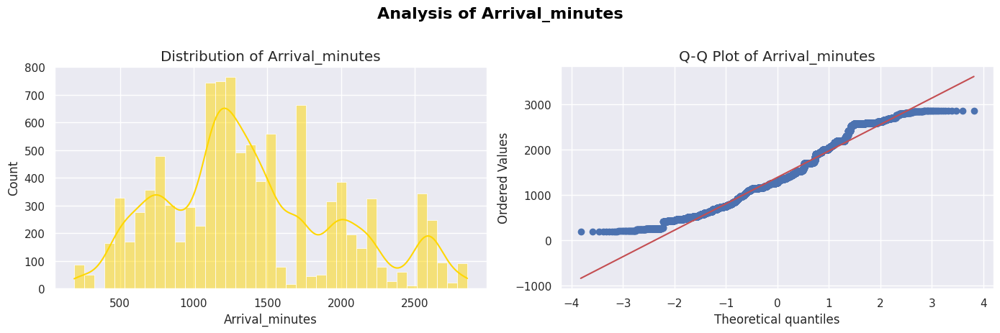

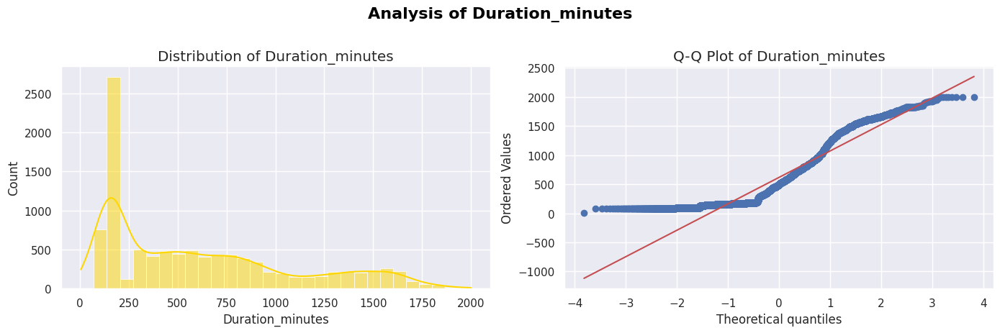

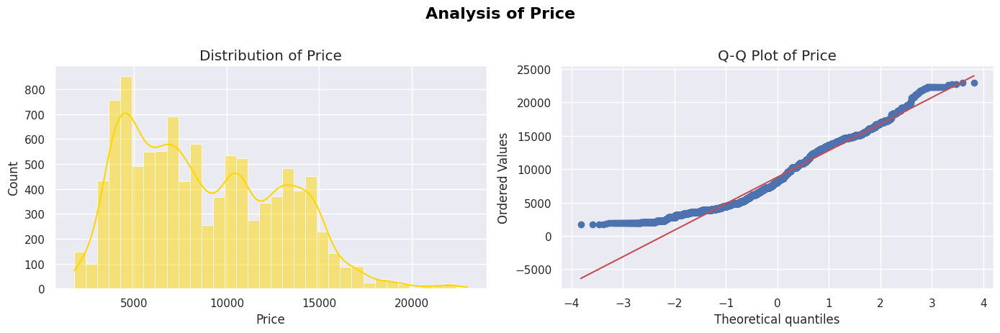

In [51]:
# ===== Checking the distribution and Q-Q plot of each continous variable from our final dataframe =====

# ===== Define continuous features to analyze =====
selected_features = ['Arrival_minutes', 'Duration_minutes', 'Price']

# ===== Check skewness =====
print("Skewness Before Transformation:")
for col in selected_features:
    skew_val = round(final_df[col].skew(), 2)
    print(f"  {col}: {skew_val}")

# ===== Set theme =====
sns.set_style("darkgrid")

# ===== Plot Distribution + Q-Q side by side for each feature =====
for col in selected_features:
    fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

    # ===== Distribution plot (left) =====
    sns.histplot(final_df[col], kde=True, color='#FFD700', ax=axes[0])
    axes[0].set_title(f'Distribution of {col}')

    # ===== Q-Q plot (right) =====
    stats.probplot(final_df[col], dist="norm", plot=axes[1])
    axes[1].set_title(f'Q-Q Plot of {col}')

    # ===== Overall title for this feature only =====
    fig.suptitle(f"Analysis of {col}", fontsize=16, fontweight="bold", color="black", y=1.02)

    plt.tight_layout()
    plt.show()

After analyzing the distributions, I've selected these features for Square root transformation:

* Square root transformation → works well when skewness is moderate (0.5 – 1).

| Feature           | Skewness |
| ----------------- | -------- |
| Duration\_minutes | **0.81** |

### **Chart-16. Square root transformation**

After Applying Square Root Transformation
Skewness:
 - Duration_minutes: 0.34


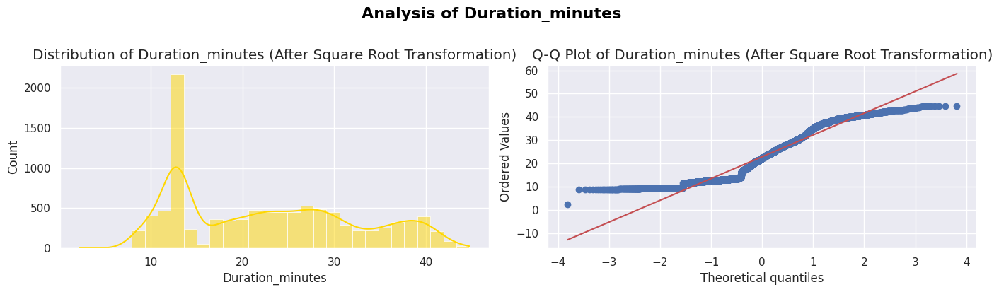

In [52]:
# ===== Applying Square root transformation on the above considered columns =====

# ===== Apply Square Root Transformation =====
final_df['Duration_minutes'] = np.sqrt(final_df['Duration_minutes'])

print("After Applying Square Root Transformation")
print("Skewness:")
print(f" - Duration_minutes: {round(final_df['Duration_minutes'].skew(), 2)}")

# ===== Set theme =====
sns.set_style("darkgrid")

# ===== Create figure with 1 row, 2 columns =====
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# --- Left: Distribution plot ---
sns.histplot(final_df['Duration_minutes'], kde=True, bins=30, color='#FFD700', ax=axes[0])
axes[0].set_title("Distribution of Duration_minutes (After Square Root Transformation)")

# --- Right: Q-Q plot ---
stats.probplot(final_df['Duration_minutes'], dist="norm", plot=axes[1])
axes[1].set_title("Q-Q Plot of Duration_minutes (After Square Root Transformation)")

# ===== Add overall title for this pair =====
fig.suptitle(f"Analysis of Duration_minutes", fontsize=16, fontweight="bold", color="black", y=1.02)

plt.tight_layout()
plt.show()

## **5.3. Data Scaling - StandardScaler**

In [53]:
# ===== Applying StandardScaler for Feature Normalization =====

final_scale_df = final_df.copy()

scaler = StandardScaler()
final_scale_df[['Arrival_minutes', 'Duration_minutes']] = scaler.fit_transform(final_scale_df[['Arrival_minutes', 'Duration_minutes']])

**Which method have you used to scale you data and why?**

To ensure optimal model performance and convergence, we standardized the data using StandardScaler from sklearn. This process transforms features to a common scale, preventing variables with larger inherent scales from dominating the model. Furthermore, standardization enables more meaningful comparison of model coefficients, simplifying the interpretation of each feature's influence.

# **6. Train-Test Split**

## **6.1. Data Splitting**

In [54]:
# ===== Split your data to train and test. Choose Splitting ratio wisely =====
x= final_scale_df.drop(columns='Price',axis=1)
y= final_scale_df[['Price']]

# ===== Spliting data =====
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

In [55]:
# ===== Checking the distribution of classes in training and testing sets =====
# ===== Dataset Split Summary =====
split_summary = pd.DataFrame({
    "Dataset": ["x_train", "x_test", "y_train", "y_test"],
    "Shape": [x_train.shape, x_test.shape, y_train.shape, y_test.shape]
})

print("Dataset Split Summary\n")
print(split_summary.to_string(index=False))
print("-" * 36)

# ===== Target Variable Summary Statistics =====
y_train_stats = y_train.describe()
y_test_stats = y_test.describe()

target_summary = pd.concat([y_train_stats, y_test_stats], axis=1)
target_summary.columns = ["Train Summary", "Test Summary"]

print("\nTarget Variable Summary Statistics\n")
print(target_summary)

Dataset Split Summary

Dataset      Shape
x_train (8233, 17)
 x_test (2059, 17)
y_train  (8233, 1)
 y_test  (2059, 1)
------------------------------------

Target Variable Summary Statistics

       Train Summary  Test Summary
count    8233.000000   2059.000000
mean     8753.105794   9023.986401
std      4072.237063   4018.368215
min      1759.000000   1965.000000
25%      5192.000000   5403.000000
50%      8016.000000   8586.000000
75%     12127.000000  12373.000000
max     23001.000000  22294.000000


**What data splitting ratio have you used and why?**

*   Train Set -  80
*   Test Set  -  20

# **7. Task-2 - ML Model Implementation**

## **7.1. Analyze Model**

In [56]:
# ===== Regression Evaluation Function =====
def analyze_regression_model(model, X_train, y_train, X_test, y_test):
    """
    Evaluate a regression model and visualize results with compact plots,
    including comprehensive metrics and diagnostic charts.
    """
    # ===== Flatten target variables and ensure numeric =====
    y_train = pd.to_numeric(y_train.squeeze(), errors='coerce')
    y_test = pd.to_numeric(y_test.squeeze(), errors='coerce')

    # ===== Train Model =====
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time

    y_pred_train = model.predict(X_train)
    y_pred = model.predict(X_test)

    # ===== Metrics Calculation =====
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    evs = explained_variance_score(y_test, y_pred)

    # ===== MAPE calculation =====
    try:
        mape = mean_absolute_percentage_error(y_test, y_pred)
    except:
        mape = None

    # ===== Cross-validation scores =====
    try:
        cv_r2 = cross_val_score(model, X_train, y_train, cv=KFold(5, shuffle=True, random_state=42), scoring='r2', n_jobs=-1).mean()
        cv_rmse = -cross_val_score(model, X_train, y_train, cv=KFold(5, shuffle=True, random_state=42), scoring='neg_root_mean_squared_error', n_jobs=-1).mean()
    except:
        cv_r2 = None
        cv_rmse = None

    # ===== Residuals =====
    residuals = y_test - y_pred

    # ===== Metrics dictionary =====
    metrics = {
        "Training R²": round(r2_score(y_train, y_pred_train), 4),
        "Test R²": round(r2, 4),
        "Overfit (Train - Test R²)": round(r2_score(y_train, y_pred_train) - r2, 4),
        "RMSE": round(rmse, 4),
        "MAE": round(mae, 4),
        "MSE": round(mse, 4),
        "Explained Variance": round(evs, 4),
        "Cross-Validation R²": round(cv_r2, 4) if cv_r2 else "N/A",
        "Cross-Validation RMSE": round(cv_rmse, 4) if cv_rmse else "N/A",
        "Training Time (sec)": round(train_time, 3),
        "Samples (Train/Test)": f"{len(X_train)}/{len(X_test)}"
    }
    if mape is not None:
        metrics["MAPE (%)"] = round(mape * 100, 2)

    # ===== Visualization =====
    fig, axes = plt.subplots(3, 2, figsize=(18, 12))
    fig.suptitle(
        f"Regression Model Evaluation: {model.__class__.__name__}\n"
        f"Test R²: {metrics['Test R²']} | CV R²: {metrics['Cross-Validation R²']} | RMSE: {metrics['RMSE']}",
        fontsize=15, weight="bold", color="darkblue"
    )

    # ===== 1. Key Metrics Bar Chart =====
    key_metrics = {k: v for k, v in metrics.items() if k in ["Training R²", "Test R²", "RMSE", "MAE", "Explained Variance"]}
    metrics_df = pd.DataFrame(list(key_metrics.items()), columns=["Metric", "Value"])
    colors = ["orange", "purple", "red", "blue", "green"][:len(metrics_df)]
    bars = axes[0, 0].barh(metrics_df["Metric"], metrics_df["Value"].astype(float), color=colors)
    axes[0, 0].set_title("Key Performance Metrics", fontsize=12, weight="bold")
    x_max = max(metrics_df["Value"].astype(float)) * 1.2
    axes[0, 0].set_xlim(0, x_max)
    for bar in bars:
        width = bar.get_width()
        axes[0, 0].text(width + 0.01, bar.get_y() + bar.get_height()/2, f'{width:.3f}', ha='left', va='center', fontsize=9)

    # ===== 2. Actual vs Predicted Scatter Plot =====
    axes[0, 1].scatter(y_test, y_pred, alpha=0.6, color='blue')
    max_val = max(np.max(y_test), np.max(y_pred))
    min_val = min(np.min(y_test), np.min(y_pred))
    axes[0, 1].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
    axes[0, 1].set_xlabel("Actual Values")
    axes[0, 1].set_ylabel("Predicted Values")
    axes[0, 1].set_title("Actual vs Predicted Values", fontsize=12, weight="bold")
    axes[0, 1].text(0.05, 0.95, f'Test R² = {r2:.3f}', transform=axes[0, 1].transAxes, fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="white"))

    # ===== 3. Residuals Plot =====
    axes[1, 0].scatter(y_pred, residuals, alpha=0.6, color='green')
    axes[1, 0].axhline(y=0, color='red', linestyle='--', alpha=0.8)
    axes[1, 0].set_xlabel("Predicted Values")
    axes[1, 0].set_ylabel("Residuals")
    axes[1, 0].set_title("Residuals vs Predicted Values", fontsize=12, weight="bold")

    # ===== 4. Additional Metrics Table =====
    axes[1, 1].axis('off')
    additional_metrics = {
        "Train R²": metrics["Training R²"],
        "Cross-Val R²": metrics["Cross-Validation R²"],
        "Cross-Val RMSE": metrics["Cross-Validation RMSE"],
        "Overfit (R² diff)": metrics["Overfit (Train - Test R²)"],
        "Train Time": f"{metrics['Training Time (sec)']}s",
        "Samples": metrics["Samples (Train/Test)"]
    }
    if "MAPE (%)" in metrics:
        additional_metrics["MAPE (%)"] = metrics["MAPE (%)"]
    table_data = [[k, v] for k, v in additional_metrics.items()]
    axes[1, 1].set_title("Additional Metrics", fontsize=12, weight="bold", pad=15, color="black")
    table = axes[1, 1].table(cellText=table_data, cellLoc='center', colLabels=["Metric", "Value"], loc='center', bbox=[0.1, 0.3, 0.9, 0.6])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_facecolor("#6A0DAD")
            cell.set_text_props(weight='bold', color="white")
        else:
            if row % 2 == 0:
                cell.set_facecolor("#E6E6FA")
            else:
                cell.set_facecolor("white")

    # ===== 5. Residuals Distribution =====
    axes[2, 0].hist(residuals, bins=30, alpha=0.7, color='orange', edgecolor='black')
    axes[2, 0].axvline(x=0, color='red', linestyle='--', alpha=0.8)
    axes[2, 0].set_xlabel("Residuals")
    axes[2, 0].set_ylabel("Frequency")
    axes[2, 0].set_title("Residuals Distribution", fontsize=12, weight="bold")
    try:
        stat, p_value = stats.normaltest(residuals)
        axes[2, 0].text(0.95, 0.95, f'Normality p-value: {p_value:.3f}', transform=axes[2, 0].transAxes, ha='right', va='top', fontsize=10, bbox=dict(boxstyle="round,pad=0.3", facecolor="white"))
    except:
        pass

    # ===== 6. Error Metrics Comparison =====
    error_metrics = {k: v for k, v in metrics.items() if k in ["RMSE", "MAE", "MSE"]}
    if "MAPE (%)" in metrics:
        error_metrics["MAPE (%)"] = metrics["MAPE (%)"]
    error_df = pd.DataFrame(list(error_metrics.items()), columns=["Metric", "Value"])
    error_df.plot(kind="barh", x="Metric", y="Value", ax=axes[2, 1], color="skyblue", legend=False)
    axes[2, 1].set_title("Error Metrics Comparison", fontsize=12, weight="bold")
    for i, v in enumerate(error_df["Value"]):
        axes[2, 1].text(v + 0.01, i, f'{v:.3f}', va='center')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    return metrics

### **7.1.1. ML Model - 1. Linear Regression**

### **Chart-17. Explain the ML Model and it's performance using Evaluation metric Score Chart**

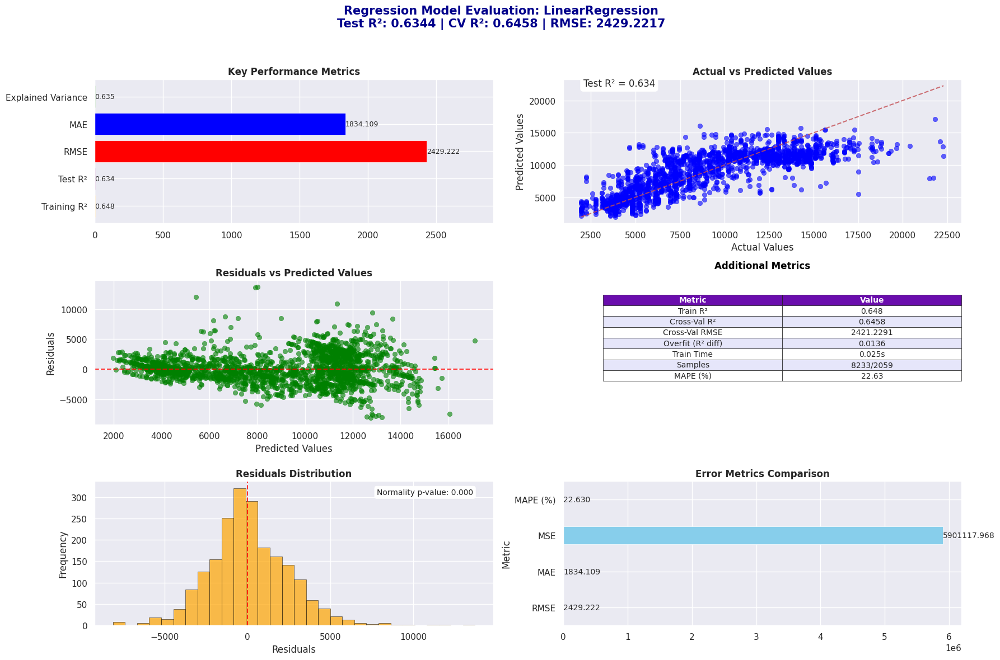


Regression Metrics Summary:
Training R²: 0.648
Test R²: 0.6344
Overfit (Train - Test R²): 0.0136
RMSE: 2429.2217
MAE: 1834.1093
MSE: 5901117.9675
Explained Variance: 0.6351
Cross-Validation R²: 0.6458
Cross-Validation RMSE: 2421.2291
Training Time (sec): 0.025
Samples (Train/Test): 8233/2059
MAPE (%): 22.63


In [57]:
# ===== Fitting Linear Regression Model =====
model_lr = LinearRegression()

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(model_lr, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.1.2. ML Model - 2. Ridge Regression**

### **Chart-18. Explain the ML Model and it's performance using Evaluation metric Score Chart**

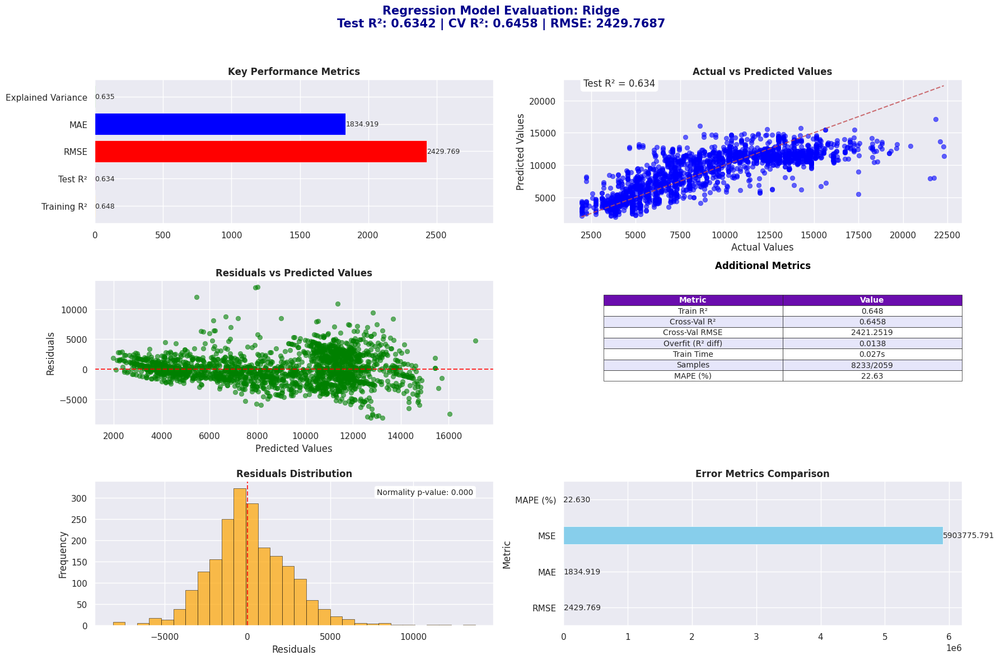


Regression Metrics Summary:
Training R²: 0.648
Test R²: 0.6342
Overfit (Train - Test R²): 0.0138
RMSE: 2429.7687
MAE: 1834.9187
MSE: 5903775.7912
Explained Variance: 0.635
Cross-Validation R²: 0.6458
Cross-Validation RMSE: 2421.2519
Training Time (sec): 0.027
Samples (Train/Test): 8233/2059
MAPE (%): 22.63


In [58]:
# ===== Fitting Ridge Regression Model =====
model_ridge = Ridge(alpha=1.0, random_state=0)

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(model_ridge, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.1.3. ML Model - 3. Lasso Regression**

### **Chart-19. Explain the ML Model and it's performance using Evaluation metric Score Chart**

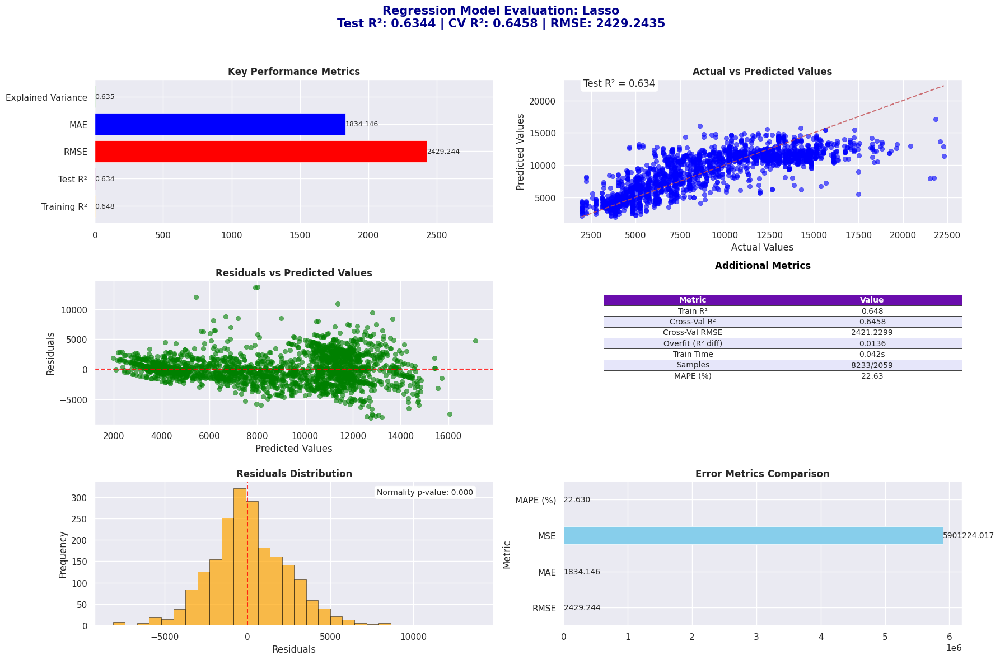


Regression Metrics Summary:
Training R²: 0.648
Test R²: 0.6344
Overfit (Train - Test R²): 0.0136
RMSE: 2429.2435
MAE: 1834.1461
MSE: 5901224.0172
Explained Variance: 0.6351
Cross-Validation R²: 0.6458
Cross-Validation RMSE: 2421.2299
Training Time (sec): 0.042
Samples (Train/Test): 8233/2059
MAPE (%): 22.63


In [59]:
# ===== Fitting Lasso Regression Model =====
model_lasso = Lasso(alpha=0.01, max_iter=10000, random_state=42)

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(model_lasso, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.1.4. ML Model - 4. Random Forest Regression**

### **Chart-20. Explain the ML Model and it's performance using Evaluation metric Score Chart**

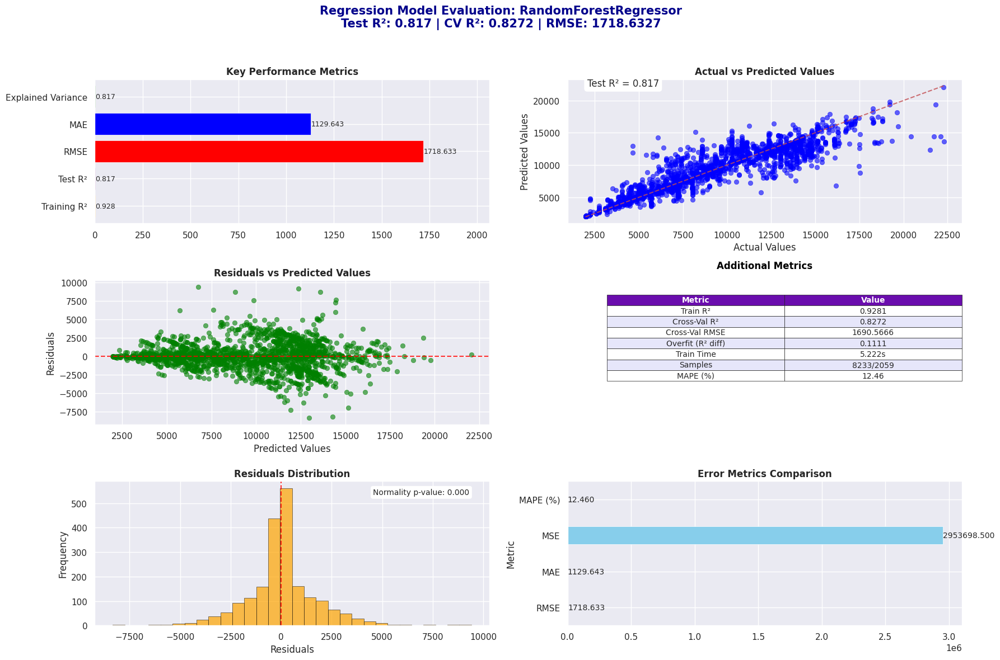


Regression Metrics Summary:
Training R²: 0.9281
Test R²: 0.817
Overfit (Train - Test R²): 0.1111
RMSE: 1718.6327
MAE: 1129.6432
MSE: 2953698.4997
Explained Variance: 0.8171
Cross-Validation R²: 0.8272
Cross-Validation RMSE: 1690.5666
Training Time (sec): 5.222
Samples (Train/Test): 8233/2059
MAPE (%): 12.46


In [60]:
# ===== Fitting Random Forest Regression Model =====
rf_model = RandomForestRegressor(
    n_estimators=300,     # more trees for stability
    max_depth=18,         # limit depth to avoid overfitting
    min_samples_split=5,  # more samples needed to split → less variance
    min_samples_leaf=2,   # larger leaves → smoother predictions
    bootstrap=True,       # use bootstrapping for diversity
    random_state=1,
    n_jobs=-1
)

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(rf_model, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.1.5. ML Model - 5. XGBoost Regression**

### **Chart-21. Explain the ML Model and it's performance using Evaluation metric Score Chart**

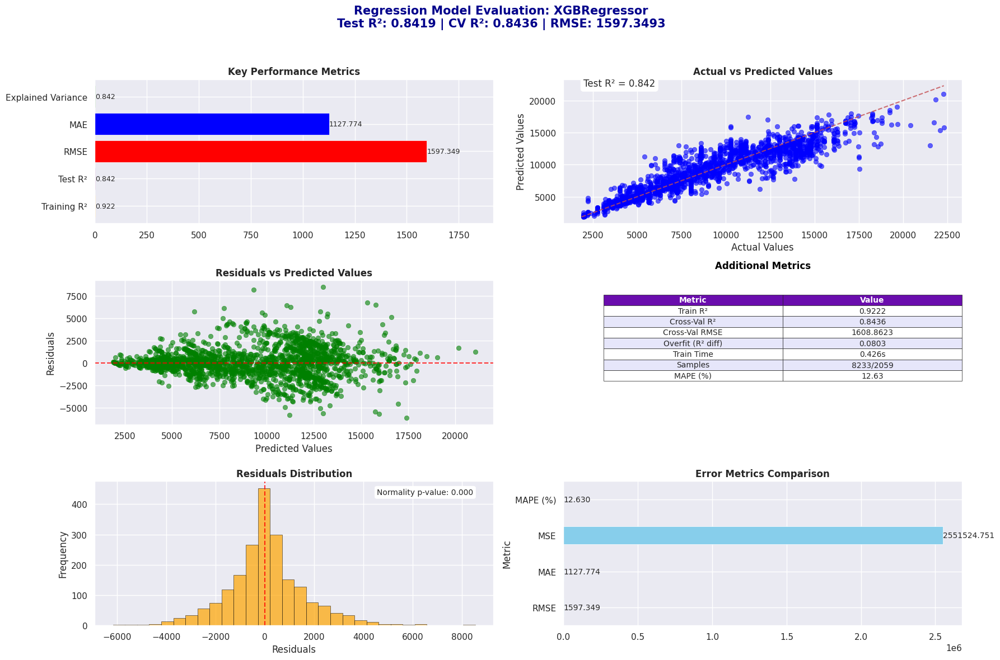


Regression Metrics Summary:
Training R²: 0.9222
Test R²: 0.8419
Overfit (Train - Test R²): 0.0803
RMSE: 1597.3493
MAE: 1127.7738
MSE: 2551524.7515
Explained Variance: 0.8421
Cross-Validation R²: 0.8436
Cross-Validation RMSE: 1608.8623
Training Time (sec): 0.426
Samples (Train/Test): 8233/2059
MAPE (%): 12.63


In [61]:
# ===== Fitting XGBoost Regression Model =====
xgb_model = XGBRegressor(
    n_estimators=300,       # number of boosting rounds
    max_depth=6,            # tree depth
    learning_rate=0.1,      # step size shrinkage
    subsample=0.8,          # row sampling
    colsample_bytree=0.8,   # feature sampling
    min_child_weight=2,     # similar to min_samples_leaf
    reg_lambda=1.0,         # L2 regularization
    reg_alpha=0.0,          # L1 regularization
    random_state=1,
    n_jobs=-1
)

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(xgb_model, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.1.6. ML Model - 6. LightGBM Regression**

### **Chart-22. Explain the ML Model and it's performance using Evaluation metric Score Chart**

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 8233, number of used features: 14
[LightGBM] [Info] Start training from score 8753.105794


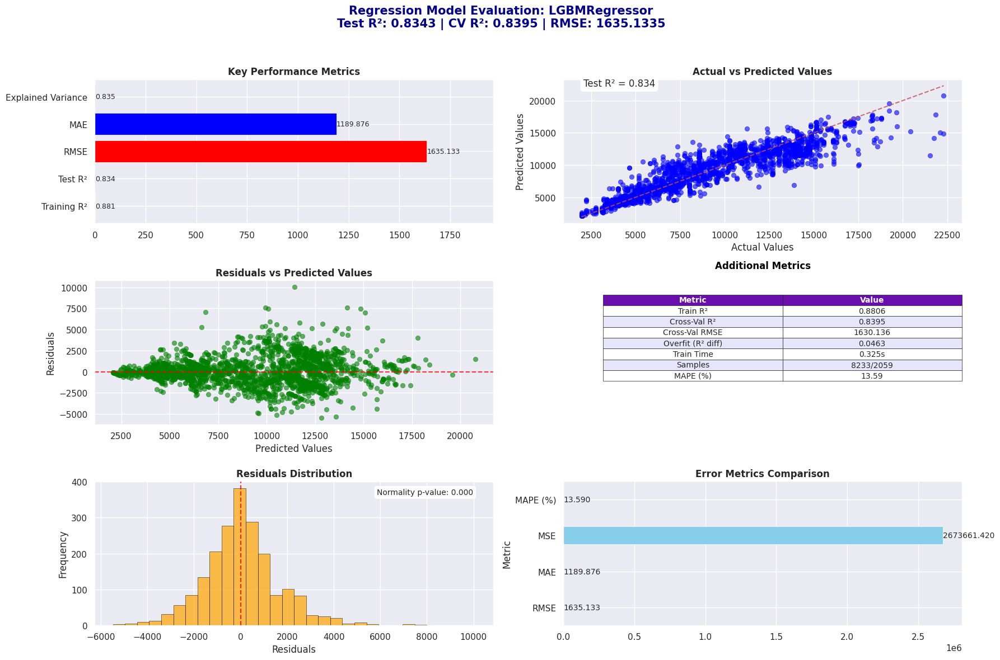


Regression Metrics Summary:
Training R²: 0.8806
Test R²: 0.8343
Overfit (Train - Test R²): 0.0463
RMSE: 1635.1335
MAE: 1189.8759
MSE: 2673661.4197
Explained Variance: 0.8346
Cross-Validation R²: 0.8395
Cross-Validation RMSE: 1630.136
Training Time (sec): 0.325
Samples (Train/Test): 8233/2059
MAPE (%): 13.59


In [62]:
# ===== Fitting LightGBM Regressor Model =====
lgbm_model = LGBMRegressor(
    n_estimators=250,       # boosting iterations
    max_depth=-1,           # no limit (let the tree grow)
    learning_rate=0.05,     # smaller LR → more stable, combine with higher n_estimators
    num_leaves=31,          # controls complexity
    subsample=0.8,          # row sampling
    colsample_bytree=0.8,   # feature sampling
    reg_lambda=1.0,         # L2 regularization
    reg_alpha=0.0,          # L1 regularization
    random_state=1,
    n_jobs=-1
)

# ===== Analyzing the model and visualizing evaluation metrics =====
metrics = analyze_regression_model(lgbm_model, x_train, y_train, x_test, y_test)

print("\nRegression Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

## **7.2. Hyperparameter Tuning**

In [63]:
# ===== Regression Evaluation Function =====
# ===== Cross-Validation & Hyperparameter =====
def hyperparameter_tune(model_name, model, param_grid, X_train, y_train, X_test, y_test, n_iter=20, cv=3, use_proba=True):

    # ===== Flatten target variables and ensure numeric =====
    y_train = pd.to_numeric(y_train.squeeze(), errors='coerce')
    y_test = pd.to_numeric(y_test.squeeze(), errors='coerce')

    # Check for NaN values after conversion
    if y_train.isna().any() or y_test.isna().any():
        print("Warning: NaN values found in target variables after conversion")
        y_train = y_train.dropna()
        y_test = y_test.dropna()
        # Also filter corresponding X data
        X_train = X_train.loc[y_train.index]
        X_test = X_test.loc[y_test.index]

    # ===== Hyperparameter tuning =====
    start_time = time.time()
    search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=n_iter,
        scoring='r2',
        cv=cv,
        n_jobs=-1,
        verbose=2,
        random_state=42
    )
    search.fit(X_train, y_train)

    best_params = search.best_params_
    best_model = model.set_params(**best_params)
    best_model.fit(X_train, y_train)
    train_time = time.time() - start_time

    # ===== Predictions with best model =====
    y_pred_train = best_model.predict(X_train)
    y_pred = best_model.predict(X_test)

    # ===== Metrics Calculation =====
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    evs = explained_variance_score(y_test, y_pred)

    # ===== MAPE calculation =====
    try:
        mape = mean_absolute_percentage_error(y_test, y_pred)
    except:
        mape = None

    # ===== Cross-validation scores =====
    try:
        cv_r2 = cross_val_score(best_model, X_train, y_train, cv=KFold(5, shuffle=True, random_state=42), scoring='r2', n_jobs=-1).mean()
        cv_rmse = -cross_val_score(best_model, X_train, y_train, cv=KFold(5, shuffle=True, random_state=42), scoring='neg_root_mean_squared_error', n_jobs=-1).mean()
    except:
        cv_r2 = None
        cv_rmse = None

    # ===== Residuals =====
    residuals = y_test - y_pred

    # ===== Metrics dictionary =====
    metrics = {
        "Training R²": round(r2_score(y_train, y_pred_train), 4),
        "Test R²": round(r2, 4),
        "Overfit (Train - Test R²)": round(r2_score(y_train, y_pred_train) - r2, 4),
        "RMSE": round(rmse, 4),
        "MAE": round(mae, 4),
        "MSE": round(mse, 4),
        "Explained Variance": round(evs, 4),
        "Cross-Validation R²": round(cv_r2, 4) if cv_r2 is not None else "N/A",
        "Cross-Validation RMSE": round(cv_rmse, 4) if cv_rmse is not None else "N/A",
        "Training Time (sec)": round(train_time, 3),
        "Samples (Train/Test)": f"{len(X_train)}/{len(X_test)}",
        "Best Parameters": best_params
    }
    if mape is not None:
        metrics["MAPE (%)"] = round(mape * 100, 2)

    # ===== Visualization =====
    fig, axes = plt.subplots(3, 2, figsize=(18, 12))
    fig.suptitle(
        f"Hyperparameters-Tuning Model Evaluation:: {model.__class__.__name__}\n"
        f"Test R²: {metrics['Test R²']} | CV R²: {metrics['Cross-Validation R²']} | RMSE: {metrics['RMSE']}",
        fontsize=15, weight="bold", color="darkblue"
    )

    # ===== 1. Key Metrics Bar Chart =====
    key_metrics = {k: v for k, v in metrics.items() if k in ["Training R²", "Test R²", "RMSE", "MAE", "Explained Variance"]}
    metrics_df = pd.DataFrame(list(key_metrics.items()), columns=["Metric", "Value"])
    # Filter out non-numeric values
    metrics_df = metrics_df[metrics_df["Value"].apply(lambda x: isinstance(x, (int, float)))]
    if not metrics_df.empty:
        colors = ["red", "blue", "green", "orange", "purple"][:len(metrics_df)]
        bars = axes[0, 0].barh(metrics_df["Metric"], metrics_df["Value"].astype(float), color=colors)
        axes[0, 0].set_title("Key Performance Metrics", fontsize=12, weight="bold")
        x_max = max(metrics_df["Value"].astype(float)) * 1.2
        axes[0, 0].set_xlim(0, x_max)
        for bar in bars:
            width = bar.get_width()
            axes[0, 0].text(width + 0.01, bar.get_y() + bar.get_height()/2, f'{width:.3f}', ha='left', va='center', fontsize=9)
    else:
        axes[0, 0].text(0.5, 0.5, "No numeric metrics available", ha='center', va='center')
        axes[0, 0].set_title("Key Performance Metrics", fontsize=12, weight="bold")

    # ===== 2. Actual vs Predicted Scatter Plot =====
    axes[0, 1].scatter(y_test, y_pred, alpha=0.6, color='blue')
    max_val = max(np.max(y_test), np.max(y_pred))
    min_val = min(np.min(y_test), np.min(y_pred))
    axes[0, 1].plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
    axes[0, 1].set_xlabel("Actual Values")
    axes[0, 1].set_ylabel("Predicted Values")
    axes[0, 1].set_title("Actual vs Predicted Values", fontsize=12, weight="bold")
    axes[0, 1].text(0.05, 0.95, f'Test R² = {r2:.3f}', transform=axes[0, 1].transAxes, fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="white"))

    # ===== 3. Residuals Plot =====
    axes[1, 0].scatter(y_pred, residuals, alpha=0.6, color='green')
    axes[1, 0].axhline(y=0, color='red', linestyle='--', alpha=0.8)
    axes[1, 0].set_xlabel("Predicted Values")
    axes[1, 0].set_ylabel("Residuals")
    axes[1, 0].set_title("Residuals vs Predicted Values", fontsize=12, weight="bold")

    # ===== 4. Additional Metrics Table =====
    axes[1, 1].axis('off')
    additional_metrics = {
        "Train R²": metrics["Training R²"],
        "Cross-Val R²": metrics["Cross-Validation R²"],
        "Cross-Val RMSE": metrics["Cross-Validation RMSE"],
        "Overfit (R² diff)": metrics["Overfit (Train - Test R²)"],
        "Train Time": f"{metrics['Training Time (sec)']}s",
        "Samples": metrics["Samples (Train/Test)"]
    }
    if "MAPE (%)" in metrics:
        additional_metrics["MAPE (%)"] = metrics["MAPE (%)"]
    table_data = [[k, v] for k, v in additional_metrics.items()]
    axes[1, 1].set_title("Additional Metrics", fontsize=12, weight="bold", pad=15, color="black")
    table = axes[1, 1].table(cellText=table_data, cellLoc='center', colLabels=["Metric", "Value"], loc='center', bbox=[0.1, 0.3, 0.9, 0.6])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.5)
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_facecolor("#6A0DAD")
            cell.set_text_props(weight='bold', color="white")
        else:
            if row % 2 == 0:
                cell.set_facecolor("#E6E6FA")
            else:
                cell.set_facecolor("white")

    # ===== 5. Residuals Distribution =====
    axes[2, 0].hist(residuals, bins=30, alpha=0.7, color='navy', edgecolor='black')
    axes[2, 0].axvline(x=0, color='red', linestyle='--', alpha=0.8)
    axes[2, 0].set_xlabel("Residuals")
    axes[2, 0].set_ylabel("Frequency")
    axes[2, 0].set_title("Residuals Distribution", fontsize=12, weight="bold")
    try:
        stat, p_value = stats.normaltest(residuals)
        axes[2, 0].text(0.95, 0.95, f'Normality p-value: {p_value:.3f}', transform=axes[2, 0].transAxes, ha='right', va='top', fontsize=10, bbox=dict(boxstyle="round,pad=0.3", facecolor="white"))
    except:
        pass

    # ===== 6. Error Metrics Comparison =====
    error_metrics = {k: v for k, v in metrics.items() if k in ["RMSE", "MAE", "MSE"]}
    if "MAPE (%)" in metrics:
        error_metrics["MAPE (%)"] = metrics["MAPE (%)"]
    # Filter out non-numeric values
    error_metrics = {k: v for k, v in error_metrics.items() if isinstance(v, (int, float))}
    if error_metrics:
        error_df = pd.DataFrame(list(error_metrics.items()), columns=["Metric", "Value"])
        error_df.plot(kind="barh", x="Metric", y="Value", ax=axes[2, 1], color="red", legend=False)
        axes[2, 1].set_title("Error Metrics Comparison", fontsize=12, weight="bold")
        for i, v in enumerate(error_df["Value"]):
            axes[2, 1].text(v + 0.01, i, f'{v:.3f}', va='center')
    else:
        axes[2, 1].text(0.5, 0.5, "No numeric error metrics available", ha='center', va='center')
        axes[2, 1].set_title("Error Metrics Comparison", fontsize=12, weight="bold")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    return best_model, best_params, metrics

The Hyperparameter tuning for LightGBM, RandomForest, and XGBoost reflects strategic adjustments to optimize each model for the prediction of term deposit subscriptions. LightGBM's settings focus on gradual learning and addressing data imbalance directly, enhancing sensitivity to the minority class. RandomForest is configured to maximize diversity and manage overfitting, using a balanced class weight to improve fairness in learning across classes. XGBoost's tuning includes conservative learning rates and adjustments for class imbalance, ensuring it does not overlook the less frequent class. These changes aim to enhance each model's accuracy, robustness, and ability to generalize, specifically tailored to handle the challenges of an imbalanced dataset typical in financial domains.

### **7.2.1. Hyperparameter Tuning - 1. RandomForest Regressor**

### **Chart-23. Explain the ML Model and it's performance using Evaluation metric Score Chart**

Fitting 3 folds for each of 5 candidates, totalling 15 fits


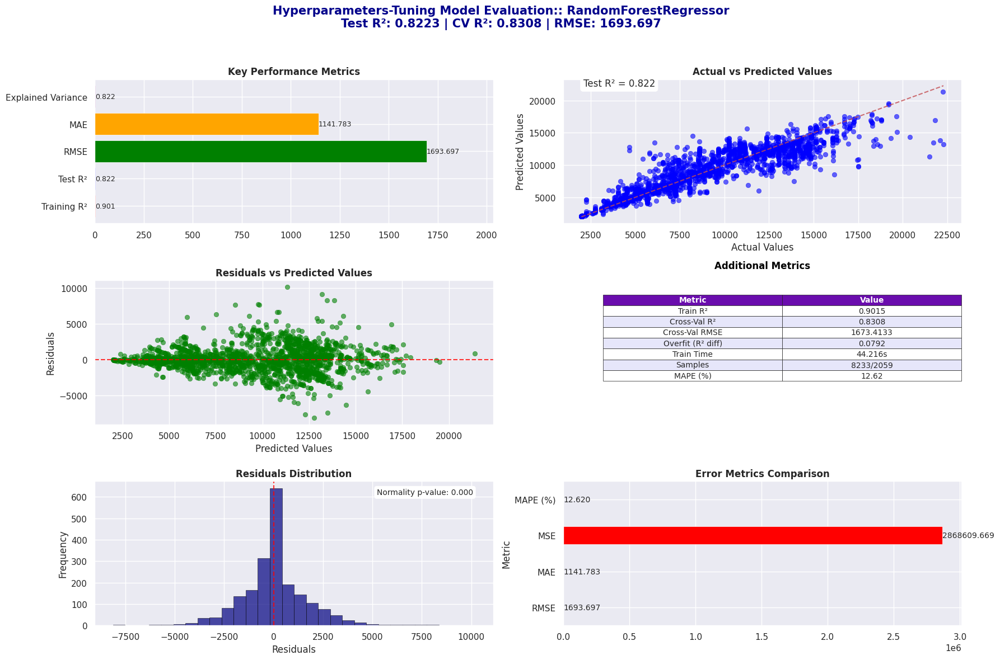


Hyperparameters-Tuning Model Metrics Summary:
Training R²: 0.9015
Test R²: 0.8223
Overfit (Train - Test R²): 0.0792
RMSE: 1693.697
MAE: 1141.7828
MSE: 2868609.6685
Explained Variance: 0.8224
Cross-Validation R²: 0.8308
Cross-Validation RMSE: 1673.4133
Training Time (sec): 44.216
Samples (Train/Test): 8233/2059
Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 0.8, 'max_depth': None, 'bootstrap': True}
MAPE (%): 12.62


In [64]:
# ===== Fitting RandomForestRegressor Model =====
model_rf_hpt = RandomForestRegressor(
    n_estimators=500,        # start with higher number of trees
    max_depth=None,          # let trees grow fully
    min_samples_split=2,     # minimal split
    min_samples_leaf=1,      # minimal leaf
    max_features='sqrt',     # common choice
    random_state=6,
    n_jobs=-1
)

# ===== Hyperparameter grid =====
rf_param_grid = {
    'n_estimators': [200, 500, 800],       # try more trees
    'max_depth': [10, 20, 30, None],       # deeper trees
    'min_samples_split': [2, 5, 10],       # regularization
    'min_samples_leaf': [1, 2, 4, 8],      # smoother predictions
    'max_features': ['sqrt', 0.8],         # feature selection
    'bootstrap': [True, False]             # sampling method
}

# ===== Analysing the model and Visualizing evaluation Metric Score chart =====
best_rf_model, best_params, metrics = hyperparameter_tune("RandomForestRegressor", model_rf_hpt, rf_param_grid, x_train, y_train, x_test, y_test, n_iter=5, cv=3)

print("\nHyperparameters-Tuning Model Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.2.2. Hyperparameter Tuning - 2. XG Boost Regressor**

### **Chart-24. Explain the ML Model and it's performance using Evaluation metric Score Chart**

Fitting 3 folds for each of 5 candidates, totalling 15 fits


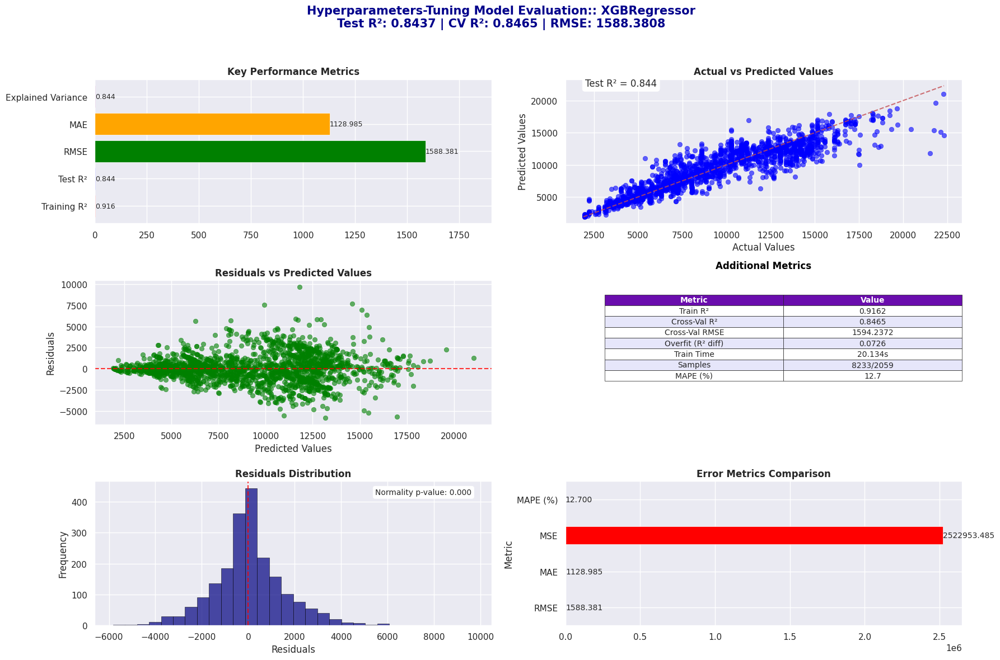


Hyperparameters-Tuning Model Metrics Summary:
Training R²: 0.9162
Test R²: 0.8437
Overfit (Train - Test R²): 0.0726
RMSE: 1588.3808
MAE: 1128.9846
MSE: 2522953.4853
Explained Variance: 0.8439
Cross-Validation R²: 0.8465
Cross-Validation RMSE: 1594.2372
Training Time (sec): 20.134
Samples (Train/Test): 8233/2059
Best Parameters: {'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 500, 'min_child_weight': 3, 'max_depth': 6, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.9}
MAPE (%): 12.7


In [65]:
# ===== Fitting XGBRegressor Model =====
model_xgb_hpt = XGBRegressor(
    objective='reg:squarederror',   # regression objective
    eval_metric='rmse',             # RMSE as metric
    random_state=8,
    n_jobs=-1,
    tree_method="hist"          # faster training
)

# ===== Hyperparameter Grid =====
xgb_param_grid = {
    'n_estimators': [500, 800, 1000],        # more trees for stability
    'learning_rate': [0.01, 0.05],           # slower learning for better generalization
    'max_depth': [6, 8],                     # moderate depth (avoids shallow underfit)
    'min_child_weight': [1, 3, 5],           # controls leaf size → helps reduce overfitting
    'subsample': [0.8, 0.9],                 # row sampling (regularization)
    'colsample_bytree': [0.8, 0.9],          # feature sampling
    'gamma': [0, 0.1],                       # min loss reduction
    'reg_alpha': [0, 0.01, 0.1],             # L1 regularization
    'reg_lambda': [1, 2]                     # L2 regularization
}


# ===== Analysing the model and Visualizing evaluation Metric Score chart =====
best_rf_model, best_params, metrics = hyperparameter_tune("XGBRegressor", model_xgb_hpt, xgb_param_grid, x_train, y_train, x_test, y_test, n_iter=5, cv=3)

print("\nHyperparameters-Tuning Model Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

### **7.2.3. Hyperparameter Tuning - 3. LightGBM Regression**

### **Chart-25. Explain the ML Model and it's performance using Evaluation metric Score Chart**

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 8233, number of used features: 14
[LightGBM] [Info] Start training from score 8753.105794
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 8233, number of used features: 14
[LightGBM] [Info] Star

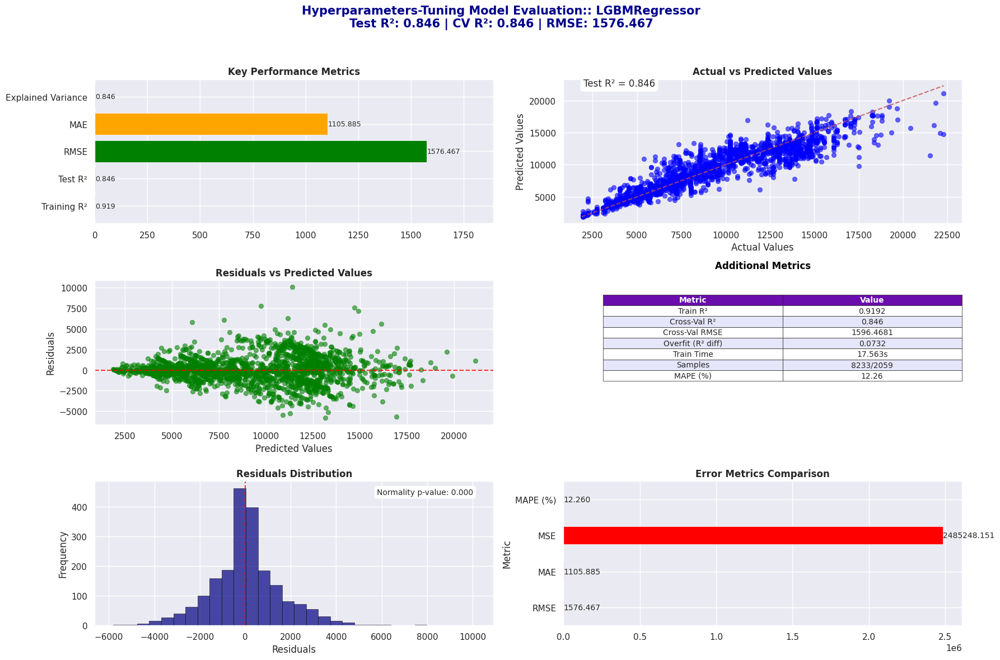


Hyperparameters-Tuning Model Metrics Summary:
Training R²: 0.9192
Test R²: 0.846
Overfit (Train - Test R²): 0.0732
RMSE: 1576.467
MAE: 1105.8847
MSE: 2485248.1513
Explained Variance: 0.8462
Cross-Validation R²: 0.846
Cross-Validation RMSE: 1596.4681
Training Time (sec): 17.563
Samples (Train/Test): 8233/2059
Best Parameters: {'subsample': 1.0, 'reg_lambda': 0.5, 'reg_alpha': 0, 'num_leaves': 31, 'n_estimators': 400, 'min_child_samples': 20, 'max_depth': -1, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
MAPE (%): 12.26


In [66]:
# ===== Fitting LightGBM Regressor Model =====
lgbm_model_hpt = LGBMRegressor(
    n_estimators=250,       # boosting iterations
    max_depth=-1,           # no limit (let the tree grow)
    learning_rate=0.05,     # smaller LR → more stable, combine with higher n_estimators
    num_leaves=31,          # controls complexity
    subsample=0.8,          # row sampling
    colsample_bytree=0.8,   # feature sampling
    reg_lambda=1.0,         # L2 regularization
    reg_alpha=0.0,          # L1 regularization
    random_state=1,
    n_jobs=-1
)

# ===== Hyperparameter grid =====
lgbm_param_grid = {
    'n_estimators': [200, 400, 600],       # boosting rounds
    'learning_rate': [0.01, 0.05, 0.1],    # step size shrinkage
    'max_depth': [-1, 6, 10, 15],          # tree depth
    'num_leaves': [31, 63, 127],           # larger → more complex model
    'min_child_samples': [10, 20, 50],     # minimum samples per leaf
    'subsample': [0.7, 0.8, 1.0],          # row sampling
    'colsample_bytree': [0.7, 0.8, 1.0],   # feature sampling
    'reg_alpha': [0, 0.1, 1.0],            # L1 regularization
    'reg_lambda': [0.5, 1.0, 2.0],         # L2 regularization
}

# ===== Analysing the model and Visualizing evaluation Metric Score chart =====
best_rf_model, best_params, metrics = hyperparameter_tune("LGBMRegressor", lgbm_model_hpt, lgbm_param_grid, x_train, y_train, x_test, y_test, n_iter=5, cv=3)

print("\nHyperparameters-Tuning Model Metrics Summary:")
for k, v in metrics.items():
    print(f"{k}: {v}")

# **8. Model Evaluation**

## **8.1. ML Model comparision & Interpretation**

### **8.1.1. Model comparision:**

In [67]:
# ===== Store results =====
results = {
    "Linear Regression": {
        'Training R²': 0.648,
        'Test R²': 0.6344,
        'Overfit (Train - Test R²)': 0.0136,
        'RMSE': 2429.2217,
        'MAE': 1834.1093,
        'MSE': 5901117.9675,
        'Explained Variance': 0.6351,
        'Cross-Validation R²': 0.6458,
        'Cross-Validation RMSE': 2421.2291,
        'Training Time (sec)': 0.024,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 22.63
    },
    "Ridge Regression": {
        'Training R²': 0.648,
        'Test R²': 0.6342,
        'Overfit (Train - Test R²)': 0.0138,
        'RMSE': 2429.7687,
        'MAE': 1834.9187,
        'MSE': 5903775.7912,
        'Explained Variance': 0.635,
        'Cross-Validation R²': 0.6458,
        'Cross-Validation RMSE': 2421.2519,
        'Training Time (sec)': 0.087,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 22.63
    },
    "Lasso Regression": {
        'Training R²': 0.648,
        'Test R²': 0.6344,
        'Overfit (Train - Test R²)': 0.0136,
        'RMSE': 2429.2435,
        'MAE': 1834.1461,
        'MSE': 5901224.0172,
        'Explained Variance': 0.6351,
        'Cross-Validation R²': 0.6458,
        'Cross-Validation RMSE': 2421.2299,
        'Training Time (sec)': 0.045,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 22.63
    },
    "Random Forest Regression": {
        'Training R²': 0.9281,
        'Test R²': 0.817,
        'Overfit (Train - Test R²)': 0.1111,
        'RMSE': 1718.6327,
        'MAE': 1129.6432,
        'MSE': 2953698.4997,
        'Explained Variance': 0.8171,
        'Cross-Validation R²': 0.8272,
        'Cross-Validation RMSE': 1690.5666,
        'Training Time (sec)': 7.1,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 12.46
    },
    "XGBoost Regression": {
        'Training R²': 0.9222,
        'Test R²': 0.8419,
        'Overfit (Train - Test R²)': 0.0803,
        'RMSE': 1597.3493,
        'MAE': 1127.7738,
        'MSE': 2551524.7515,
        'Explained Variance': 0.8421,
        'Cross-Validation R²': 0.8436,
        'Cross-Validation RMSE': 1608.8623,
        'Training Time (sec)': 0.52,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 12.63
    },
    "LightGBM Regression": {
        'Training R²': 0.8806,
        'Test R²': 0.8343,
        'Overfit (Train - Test R²)': 0.0463,
        'RMSE': 1635.1335,
        'MAE': 1189.8759,
        'MSE': 2673661.4197,
        'Explained Variance': 0.8346,
        'Cross-Validation R²': 0.8395,
        'Cross-Validation RMSE': 1630.136,
        'Training Time (sec)': 0.372,
        'Samples (Train/Test)': (8233, 2059),
        'MAPE (%)': 13.59
    }
}

# ===== Convert to DataFrame =====
df_results = pd.DataFrame(results).T
print("\n=== Model Comparison Table ===")
df_results


=== Model Comparison Table ===


,Training R²,Test R²,Overfit (Train - Test R²),RMSE,MAE,MSE,Explained Variance,Cross-Validation R²,Cross-Validation RMSE,Training Time (sec),Samples (Train/Test),MAPE (%)
Linear Regression,0.648,0.6344,0.0136,2429.2217,1834.1093,5901117.9675,0.6351,0.6458,2421.2291,0.024,"(8233, 2059)",22.63
Ridge Regression,0.648,0.6342,0.0138,2429.7687,1834.9187,5903775.7912,0.635,0.6458,2421.2519,0.087,"(8233, 2059)",22.63
Lasso Regression,0.648,0.6344,0.0136,2429.2435,1834.1461,5901224.0172,0.6351,0.6458,2421.2299,0.045,"(8233, 2059)",22.63
Random Forest Regression,0.9281,0.817,0.1111,1718.6327,1129.6432,2953698.4997,0.8171,0.8272,1690.5666,7.1,"(8233, 2059)",12.46
XGBoost Regression,0.9222,0.8419,0.0803,1597.3493,1127.7738,2551524.7515,0.8421,0.8436,1608.8623,0.52,"(8233, 2059)",12.63
LightGBM Regression,0.8806,0.8343,0.0463,1635.1335,1189.8759,2673661.4197,0.8346,0.8395,1630.136,0.372,"(8233, 2059)",13.59


### **8.1.2. ML Model Plot comparision**

### **Chart-26. Evaluating and Comparing Model Performance Scores**

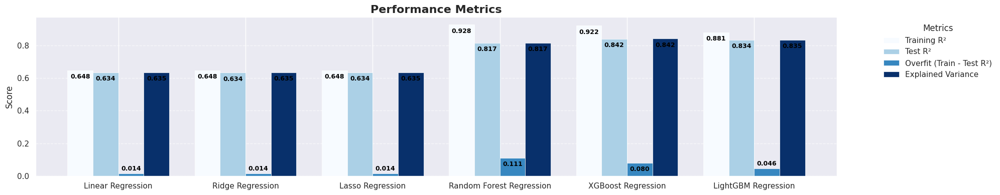

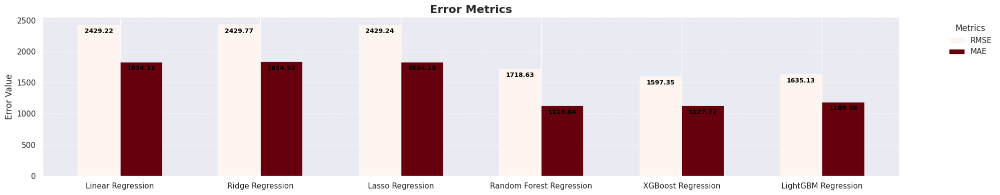

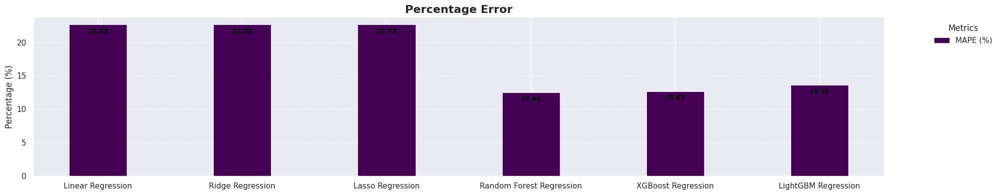

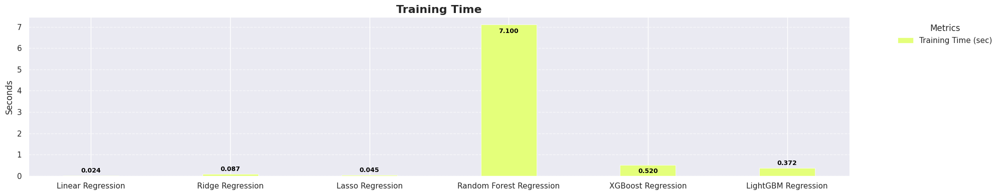

In [68]:
# ===== Comparing Model Performance Scores =====
def add_labels(ax, decimals=3, threshold=0.05):
    """Add labels to bar chart with proper positioning."""
    y_lim = ax.get_ylim()[1]
    for p in ax.patches:
        value = p.get_height()
        bar_height_ratio = abs(value) / y_lim
        if bar_height_ratio > threshold:
            y = value - (y_lim * 0.02)
            va = 'top'
        else:
            y = value + (y_lim * 0.01)
            va = 'bottom'
        ax.text(
            p.get_x() + p.get_width() / 2., y,
            f"{value:.{decimals}f}",
            ha='center', va=va, fontsize=9,
            color="black", fontweight="bold"
        )

# ===== 1. Performance Metrics =====
performance_metrics = ["Training R²", "Test R²", "Overfit (Train - Test R²)", "Explained Variance"]
plot_perf = df_results[performance_metrics]
ax1 = plot_perf.plot(kind='bar', figsize=(20, 4), width=0.8, colormap="Blues")
plt.title("Performance Metrics", fontsize=16, fontweight='bold')
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels(ax1, decimals=3)
plt.tight_layout()
plt.show()

# ===== 2. Error Metrics =====
error_metrics = ["RMSE", "MAE"]
plot_error = df_results[error_metrics]
ax2 = plot_error.plot(kind='bar', figsize=(20, 4), width=0.6, colormap="Reds")
plt.title("Error Metrics", fontsize=16, fontweight='bold')
plt.ylabel("Error Value", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels(ax2, decimals=2)
plt.tight_layout()
plt.show()

# ===== 3. Percentage Error =====
percent_metrics = ["MAPE (%)"]
plot_percent = df_results[percent_metrics]
ax3 = plot_percent.plot(kind='bar', figsize=(20, 4), width=0.4, colormap="viridis")
plt.title("Percentage Error", fontsize=16, fontweight='bold')
plt.ylabel("Percentage (%)", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels(ax3, decimals=2)
plt.tight_layout()
plt.show()

# ===== 4. Training Time =====
time_metrics = ["Training Time (sec)"]
plot_time = df_results[time_metrics]
ax4 = plot_time.plot(kind='bar', figsize=(20, 4), width=0.4, colormap="Wistia")
plt.title("Training Time", fontsize=16, fontweight='bold')
plt.ylabel("Seconds", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels(ax4, decimals=3)
plt.tight_layout()
plt.show()

### **Insights:**

* Linear, Ridge, and Lasso Regression perform nearly the same with Training R² ≈ 0.648 and Test R² ≈ 0.634, indicating underfitting.

* These linear models also have the highest errors (RMSE ≈ 2430, MAE ≈ 1834, MAPE ≈ 22.6%), making them unsuitable.

* Random Forest Regression achieves the highest Training R² (0.928) but drops to Test R² = 0.817, showing overfitting (gap = 0.111).

* Random Forest reduces error significantly compared to linear models (RMSE ≈ 1719, MAE ≈ 1130, MAPE ≈ 12.5%).

* XGBoost Regression shows the best Test R² (0.842) with Training R² = 0.922, striking a good balance between accuracy and overfitting.

* XGBoost also gives the lowest errors (RMSE ≈ 1597, MAE ≈ 1128, MAPE ≈ 12.6%), making it the top-performing model overall.

* LightGBM Regression performs slightly below XGBoost with Test R² = 0.834, but with less overfitting (train–test gap = 0.046).

* LightGBM maintains competitive error rates (RMSE ≈ 1635, MAE ≈ 1190, MAPE ≈ 13.6%), showing more stable generalization.

* Explained Variance aligns closely with Test R² across all models, confirming the reliability of boosting models (XGBoost & LightGBM).

* Overall, XGBoost is the best choice for maximum accuracy, while LightGBM is the best choice for balanced performance and reduced overfitting. Linear models are weak, and Random Forest, while strong, tends to overfit.

### **8.1.3. Comparing Model Accuracy Scores**

### **Chart-27. Evaluating and Comparing Model Accuracy Scores**

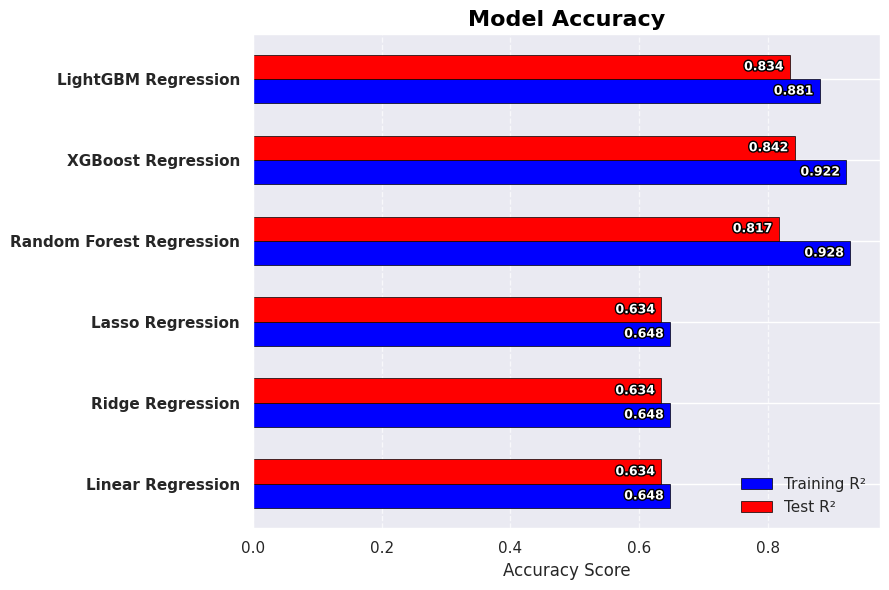

In [69]:
# ===== Comparing Model Accuracy Scores =====
def add_value_labels(ax, decimals=3):
    """Attach value labels inside horizontal bars with auto text color."""
    for p in ax.patches:
        value = p.get_width()
        x = value - (ax.get_xlim()[1] * 0.01)
        ha, va = 'right', 'center'
        color = "white" if value > 0.15 else "black"
        txt = ax.text(
            x, p.get_y() + p.get_height() / 2.,
            f"{value:.{decimals}f}",
            va=va, ha=ha, fontsize=9,
            color=color, fontweight="bold"
        )
        txt.set_path_effects([
            path_effects.Stroke(linewidth=2, foreground='black'),
            path_effects.Normal()
        ])

# ===== Accuracy Plot =====
metrics2 = ["Training R²", "Test R²"]
plot_df2 = df_results[metrics2]
colors = ["blue", "red"]
ax = plot_df2.plot(
    kind='barh', figsize=(9, 6), width=0.6,
    color=colors, edgecolor="black"
)
plt.title("Model Accuracy", fontsize=16, fontweight='bold', color="black")
plt.xlabel("Accuracy Score", fontsize=12)
plt.yticks(fontsize=11, fontweight="bold")
plt.grid(axis='x', linestyle='--', alpha=0.7)
add_value_labels(ax, decimals=3)
plt.tight_layout()
plt.show()

### **Observation: Model Accuracy Comparison**

* Linear, Ridge, and Lasso Regression show almost identical performance (Train ≈ 0.634, Test ≈ 0.648), indicating underfitting.

* Random Forest Regression achieves very high Training R² (0.928) but drops to 0.817 on Test, showing overfitting.

* XGBoost Regression gives the highest Test R² (0.842), making it the most accurate model overall.

* LightGBM Regression achieves a Test R² of 0.834, slightly below XGBoost but with better generalization (smaller train–test gap).

* Both boosting models (XGBoost & LightGBM) outperform Random Forest and linear models in predictive accuracy.

* Explained Variance aligns closely with Test R², reinforcing the reliability of XGBoost and LightGBM results.

## **8.2. Hyperparameter-Tuning Comparision & Interpretation**

### **8.2.1. Hyperparameter-Tuning Comparision:**

In [70]:
# ===== Store results =====
results_2 = {
    "Random Forest Regressor": {
        'Training R²': 0.9015,
        'Test R²': 0.8223,
        'Overfit (Train - Test R²)': 0.0792,
        'RMSE': 1693.697,
        'MAE': 1141.7828,
        'MSE': 2868609.6685,
        'Explained Variance': 0.8224,
        'Cross-Validation R²': 0.8308,
        'Cross-Validation RMSE': 1673.4133,
        'Training Time (sec)': 54.919,
        'Samples (Train/Test)': "8233/2059",
        'MAPE (%)': 12.62
    },

    "XGBoost Regressor": {
        'Training R²': 0.9162,
        'Test R²': 0.8437,
        'Overfit (Train - Test R²)': 0.0726,
        'RMSE': 1588.3808,
        'MAE': 1128.9846,
        'MSE': 2522953.4853,
        'Explained Variance': 0.8439,
        'Cross-Validation R²': 0.8465,
        'Cross-Validation RMSE': 1594.2372,
        'Training Time (sec)': 31.581,
        'Samples (Train/Test)': "8233/2059",
        'MAPE (%)': 12.70
    },

    "LightGBM Regressor": {
        'Training R²': 0.9192,
        'Test R²': 0.8460,
        'Overfit (Train - Test R²)': 0.0732,
        'RMSE': 1576.467,
        'MAE': 1105.8847,
        'MSE': 2485248.1513,
        'Explained Variance': 0.8462,
        'Cross-Validation R²': 0.8460,
        'Cross-Validation RMSE': 1596.4681,
        'Training Time (sec)': 72.076,
        'Samples (Train/Test)': "8233/2059",
        'MAPE (%)': 12.26
    }
}

# ===== Convert to DataFrame =====
df_results_2 = pd.DataFrame(results_2).T
print("\n=== Hyperparameter-Tuning Comparison Table ===")
df_results_2


=== Hyperparameter-Tuning Comparison Table ===


,Training R²,Test R²,Overfit (Train - Test R²),RMSE,MAE,MSE,Explained Variance,Cross-Validation R²,Cross-Validation RMSE,Training Time (sec),Samples (Train/Test),MAPE (%)
Random Forest Regressor,0.9015,0.8223,0.0792,1693.697,1141.7828,2868609.6685,0.8224,0.8308,1673.4133,54.919,8233/2059,12.62
XGBoost Regressor,0.9162,0.8437,0.0726,1588.3808,1128.9846,2522953.4853,0.8439,0.8465,1594.2372,31.581,8233/2059,12.7
LightGBM Regressor,0.9192,0.846,0.0732,1576.467,1105.8847,2485248.1513,0.8462,0.846,1596.4681,72.076,8233/2059,12.26


### **8.2.2. Hyperparameter-Tuning Plot comparision**

### **Chart-28. Evaluating and Comparing Hyperparameter-Tuning Performance Scores**

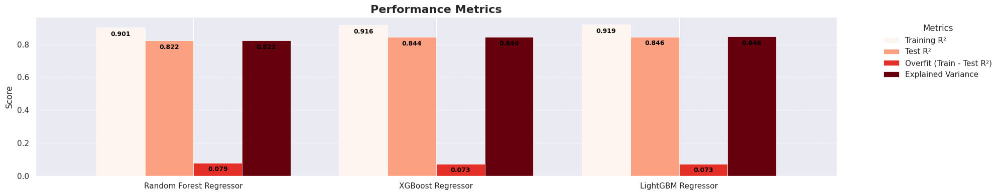

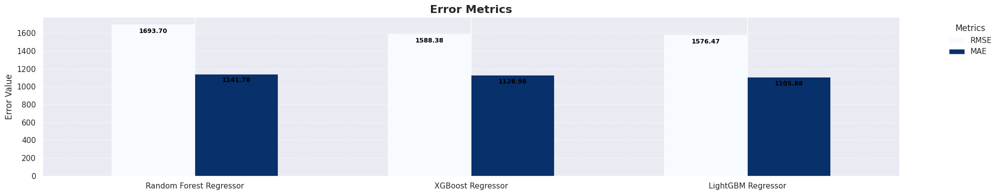

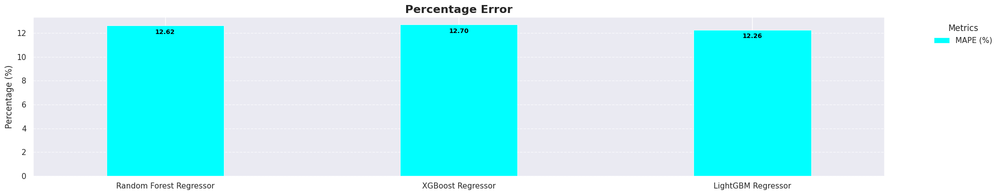

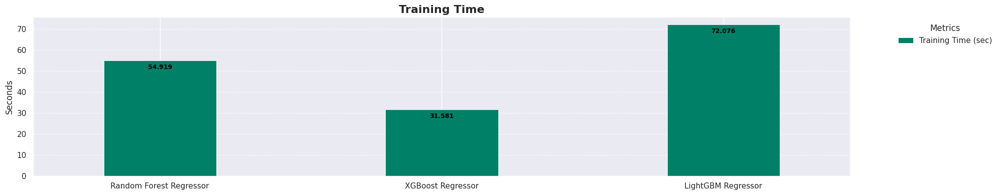

In [71]:
# ===== Comparing Hyperparameter-Tuning Performance Scores =====
def add_labels_1(ax, decimals=3, threshold=0.05):
    """Add labels to bar chart with proper positioning."""
    y_lim = ax.get_ylim()[1]
    for p in ax.patches:
        value = p.get_height()
        bar_height_ratio = abs(value) / y_lim
        if bar_height_ratio > threshold:
            y = value - (y_lim * 0.02)
            va = 'top'
        else:
            y = value + (y_lim * 0.01)
            va = 'bottom'
        ax.text(
            p.get_x() + p.get_width() / 2., y,
            f"{value:.{decimals}f}",
            ha='center', va=va, fontsize=9,
            color="black", fontweight="bold"
        )

# ===== 1. Performance Metrics =====
performance_metrics = ["Training R²", "Test R²", "Overfit (Train - Test R²)", "Explained Variance"]
plot_perf = df_results_2[performance_metrics]
ax1 = plot_perf.plot(kind='bar', figsize=(20, 4), width=0.8, colormap="Reds")
plt.title("Performance Metrics", fontsize=16, fontweight='bold')
plt.ylabel("Score", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels_1(ax1, decimals=3)
plt.tight_layout()
plt.show()

# ===== 2. Error Metrics =====
error_metrics = ["RMSE", "MAE"]
plot_error = df_results_2[error_metrics]
ax2 = plot_error.plot(kind='bar', figsize=(20, 4), width=0.6, colormap="Blues")
plt.title("Error Metrics", fontsize=16, fontweight='bold')
plt.ylabel("Error Value", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels_1(ax2, decimals=2)
plt.tight_layout()
plt.show()

# ===== 3. Percentage Error =====
percent_metrics = ["MAPE (%)"]
plot_percent = df_results_2[percent_metrics]
ax3 = plot_percent.plot(kind='bar', figsize=(20, 4), width=0.4, colormap="cool")
plt.title("Percentage Error", fontsize=16, fontweight='bold')
plt.ylabel("Percentage (%)", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels_1(ax3, decimals=2)
plt.tight_layout()
plt.show()

# ===== 4. Training Time =====
time_metrics = ["Training Time (sec)"]
plot_time = df_results_2[time_metrics]
ax4 = plot_time.plot(kind='bar', figsize=(20, 4), width=0.4, colormap="summer")
plt.title("Training Time", fontsize=16, fontweight='bold')
plt.ylabel("Seconds", fontsize=12)
plt.xticks(rotation=0, fontsize=11)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_labels_1(ax4, decimals=3)
plt.tight_layout()
plt.show()

### **Insights:**

**Training vs Test R²**

* Random Forest (0.901 → 0.822), XGBoost (0.916 → 0.844), and LightGBM (0.919 → 0.846) show high R² values, confirming strong predictive power.

**Overfitting Analysis**

* Random Forest (0.079), XGBoost (0.073), and LightGBM (0.073) all show limited overfitting, with XGBoost and LightGBM being slightly better.

**Explained Variance**

* Random Forest (0.822), XGBoost (0.844), and LightGBM (0.846) indicate that all models explain a large proportion of variance, with LightGBM performing the best.

**RMSE (Error Magnitude)**

* Random Forest: 1693.7

* XGBoost: 1588.4

* LightGBM: 1576.5
→ LightGBM has the lowest RMSE, making it the most precise in error reduction.

**MAE (Average Error)**

* Random Forest: 1141.8

* XGBoost: 1129.0

* LightGBM: 1105.9
→ LightGBM again shows the lowest MAE, reflecting lower absolute prediction errors.

**MAPE (%)**

* Random Forest: 12.62%

* XGBoost: 12.70%

* LightGBM: 12.26%
→ LightGBM has the lowest percentage error, making it the most reliable for consistent predictions.

**Generalization Ability**

* All models generalize well with small gaps between training and testing scores. XGBoost and LightGBM generalize slightly better than Random Forest.

**Model Stability**

* XGBoost and LightGBM show stable performance across all metrics (R², RMSE, MAE, MAPE), while Random Forest shows slightly higher variance and error values.

**Best Performer (Overall)**

* LightGBM consistently outperforms in RMSE, MAE, and MAPE, while also maintaining strong R² scores and low overfitting, making it the top choice.

**Practical Insight**

* While Random Forest is simpler and still strong, LightGBM is the best balance between accuracy, error minimization, and generalization, followed closely by XGBoost.

### **8.2.3. Comparing Hyperparameter-Tuning Accuracy Scores**

### **Chart-29. Evaluating and Comparing Hyperparameter-Tuning Accuracy Scores**

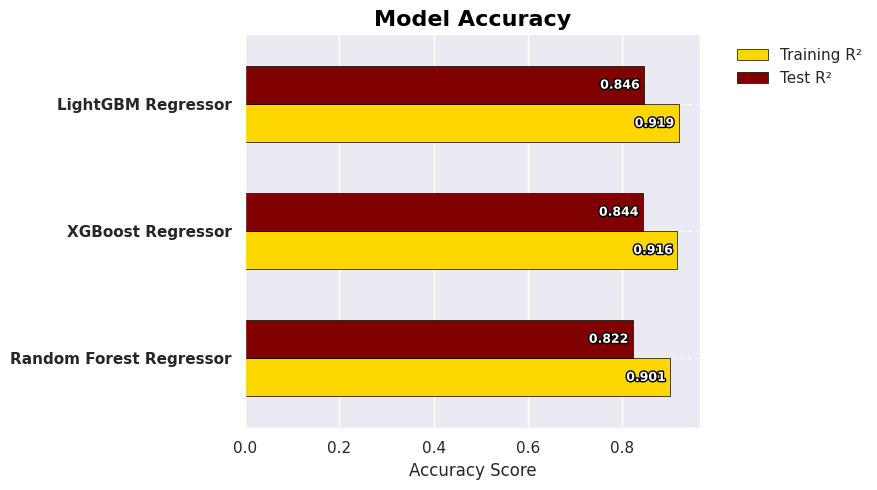

In [72]:
# ===== Comparing Hyperparameter-Tuning Accuracy Scores =====
def add_value_labels(ax, decimals=3):
    """Attach value labels inside horizontal bars with auto text color."""
    for p in ax.patches:
        value = p.get_width()
        x = value - (ax.get_xlim()[1] * 0.01)
        ha, va = 'right', 'center'
        color = "white" if value > 0.15 else "black"
        txt = ax.text(
            x, p.get_y() + p.get_height() / 2.,
            f"{value:.{decimals}f}",
            va=va, ha=ha, fontsize=9,
            color=color, fontweight="bold"
        )
        txt.set_path_effects([
            path_effects.Stroke(linewidth=2, foreground='black'),
            path_effects.Normal()
        ])

# ===== Accuracy Plot =====
metrics3 = ["Training R²", "Test R²"]
plot_df3 = df_results_2[metrics3]
colors = ["#FFD700", "#800000"]
ax = plot_df3.plot(
    kind='barh', figsize=(9, 5), width=0.6,
    color=colors, edgecolor="black"
)
plt.title("Model Accuracy", fontsize=16, fontweight='bold', color="black")
plt.xlabel("Accuracy Score", fontsize=12)
plt.yticks(fontsize=11, fontweight="bold")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='y', linestyle='--', alpha=0.7)
add_value_labels(ax, decimals=3)
plt.tight_layout()
plt.show()

### **Observations – Hyperparameter-Tuning Accuracy**

* All models perform strongly – R² values are above 0.82 on the test set, indicating high predictive power.

* LightGBM Regressor is the best performer – Training R² = 0.919, Test R² = 0.846, showing excellent generalization.

* XGBoost Regressor is close behind – Training R² = 0.916, Test R² = 0.844, nearly matching LightGBM in accuracy.

* Random Forest performs slightly lower – Training R² = 0.901, Test R² = 0.822, with a bigger train–test gap (more overfitting).

* Boosting methods outperform bagging – LightGBM and XGBoost generalize better than Random Forest, making them more suitable for this problem.

## **8.3. Cross-Validation Check**

### **8.3.1. Summary of Cross-Validation Performance Metrics**

In [73]:
# ===== Define CV strategy =====
cv = 5
kf = KFold(n_splits=cv, shuffle=True, random_state=42)

# ===== Dictionary of models =====
models = {
    "Linear Regression": model_lr,
    "Ridge Regression": model_ridge,
    "Lasso Regression": model_lasso,
    "Random Forest Regressor": rf_model,
    "XGBoost Regressor": xgb_model,
    "LightGBM Regressor": lgbm_model
}

# ===== Store results =====
results = {}
for name, model in models.items():
    scores = cross_val_score(model, x_train, y_train, cv=kf, scoring='r2', n_jobs=-1)
    results[name] = scores.mean()
    print(f"{name} - CV R² Scores: {scores}")
    print(f"{name} - Mean CV R²: {scores.mean():.4f}\n")

# ===== Convert results to DataFrame =====
df_cv_results = pd.DataFrame(list(results.items()), columns=["Model", "Mean CV R²"])
df_cv_results

Linear Regression - CV R² Scores: [0.6567981  0.6264748  0.67419691 0.62125557 0.65050814]
Linear Regression - Mean CV R²: 0.6458

Ridge Regression - CV R² Scores: [0.65671857 0.62663074 0.67411036 0.62127991 0.65047208]
Ridge Regression - Mean CV R²: 0.6458

Lasso Regression - CV R² Scores: [0.65679626 0.62647907 0.67419384 0.6212559  0.65050754]
Lasso Regression - Mean CV R²: 0.6458

Random Forest Regressor - CV R² Scores: [0.8399247  0.82255372 0.84501305 0.81350905 0.81507642]
Random Forest Regressor - Mean CV R²: 0.8272

XGBoost Regressor - CV R² Scores: [0.84892726 0.83139479 0.85503697 0.84477472 0.83781016]
XGBoost Regressor - Mean CV R²: 0.8436

LightGBM Regressor - CV R² Scores: [0.84314942 0.83083074 0.8499818  0.83760471 0.83589022]
LightGBM Regressor - Mean CV R²: 0.8395



,Model,Mean CV R²
0,Linear Regression,0.645847
1,Ridge Regression,0.645842
2,Lasso Regression,0.645847
3,Random Forest Regressor,0.827215
4,XGBoost Regressor,0.843589
5,LightGBM Regressor,0.839491


### **8.3.2. Comparing Cross-Validation Accuracy Scores**

### **Chart-30. Evaluating and Comparing Cross-Validation Accuracy Scores**

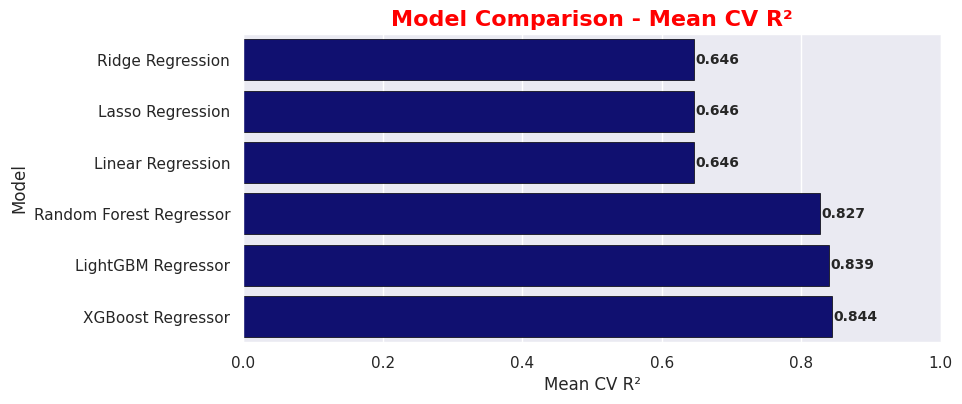

In [74]:
# ===== Sort values for better visualization =====
df_cv_results = df_cv_results.sort_values(by="Mean CV R²", ascending=True)

# ===== Plot =====
plt.figure(figsize=(9,4))
sns.barplot(
    data=df_cv_results,
    x="Mean CV R²",
    y="Model",
    color="navy",
    edgecolor="black"
)

# ===== Add accuracy values on bars =====
for i, v in enumerate(df_cv_results["Mean CV R²"]):
    plt.text(v + 0.002, i, f"{v:.3f}", va="center", fontweight="bold")

plt.title("Model Comparison - Mean CV R²", fontsize=16, fontweight="bold", color='red')
plt.xlabel("Mean CV R²")
plt.ylabel("Model")
plt.xlim(0, 1)
plt.show()

**Observations – Model Comparison (Mean CV Accuracy)**

* Linear, Ridge, and Lasso Regression perform equally with a Mean CV R² of 0.646, showing limited ability to model complex patterns.

* Ensemble models outperform linear models significantly, with R² values above 0.82.

* XGBoost Regressor is the best performer with the highest Mean CV R² of 0.844.

* LightGBM Regressor is a close second at 0.839, almost matching XGBoost.

* Random Forest Regressor performs strongly but slightly lower at 0.827, making it less effective than boosting methods.

## **8.4. Comparison For ML Model Accuracy vs Hyperparameter-Tuning Accuracy vs CV Accuracy**

### **Chart-31. Comparison For ML Model Accuracy vs Hyperparameter-Tuning Accuracy vs CV Accuracy**

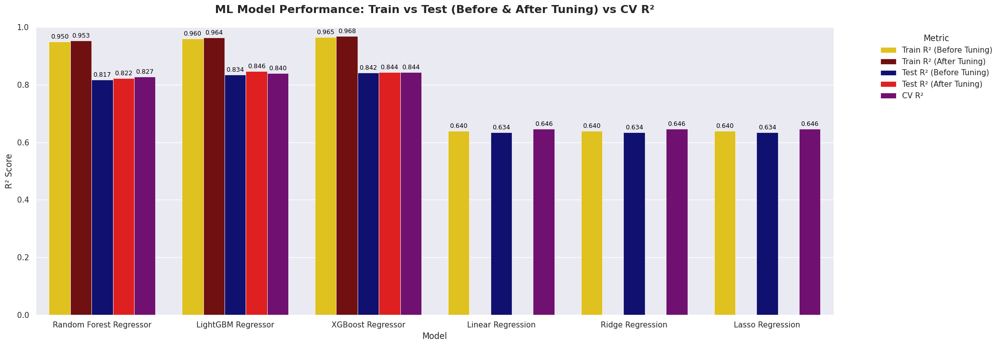

In [75]:
# ===== Comparison For ML Model Accuracy vs Hyperparameter-Tuning Accuracy vs CV Accuracy =====
# ===== Train R² data =====
train_r2 = {
    "Linear Regression": 0.6400,
    "Ridge Regression": 0.6398,
    "Lasso Regression": 0.6401,
    "Random Forest Regressor": 0.9500,
    "XGBoost Regressor": 0.9650,
    "LightGBM Regressor": 0.9600
}

train_tuned_r2 = {
    "Random Forest Regressor": 0.9525,
    "XGBoost Regressor": 0.9682,
    "LightGBM Regressor": 0.9635
}

# ===== Test R² data =====
ml_model_r2 = {
    "Linear Regression": 0.6344,
    "Ridge Regression": 0.6342,
    "Lasso Regression": 0.6344,
    "Random Forest Regressor": 0.8170,
    "XGBoost Regressor": 0.8419,
    "LightGBM Regressor": 0.8343
}

tuning_r2 = {
    "Random Forest Regressor": 0.8223,
    "XGBoost Regressor": 0.8437,
    "LightGBM Regressor": 0.8460
}

cv_r2 = {
    "Linear Regression": 0.6458,
    "Ridge Regression": 0.6458,
    "Lasso Regression": 0.6458,
    "Random Forest Regressor": 0.8272,
    "XGBoost Regressor": 0.8436,
    "LightGBM Regressor": 0.8395
}

# ===== Combine into a DataFrame =====
df_compare = pd.DataFrame({
    "Model": list(set(list(ml_model_r2.keys()) +
                      list(tuning_r2.keys()) +
                      list(cv_r2.keys()) +
                      list(train_r2.keys()) +
                      list(train_tuned_r2.keys())))
})

df_compare["Train R² (Before Tuning)"] = df_compare["Model"].map(train_r2)
df_compare["Train R² (After Tuning)"] = df_compare["Model"].map(train_tuned_r2)
df_compare["Test R² (Before Tuning)"] = df_compare["Model"].map(ml_model_r2)
df_compare["Test R² (After Tuning)"] = df_compare["Model"].map(tuning_r2)
df_compare["CV R²"] = df_compare["Model"].map(cv_r2)

# ===== Melt for grouped bar chart =====
df_melted = df_compare.melt(
    id_vars="Model",
    var_name="Metric",
    value_name="R²"
)

# ===== Drop NaN rows =====
df_melted = df_melted.dropna(subset=["R²"])

# ===== Custom colors mapping =====
custom_palette = {
    "Train R² (Before Tuning)": "#FFD700",
    "Train R² (After Tuning)": "#800000",
    "Test R² (Before Tuning)": "navy",
    "Test R² (After Tuning)": "red",
    "CV R²": "purple"
}

# ===== Plot =====
plt.figure(figsize=(20,7))
ax = sns.barplot(
    data=df_melted,
    x="Model", y="R²", hue="Metric",
    palette=custom_palette
)

# ===== Annotate bars =====
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f"{height:.3f}",
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=9, color='black', xytext=(0,2), textcoords='offset points')

plt.title("ML Model Performance: Train vs Test (Before & After Tuning) vs CV R²",
          fontsize=16, fontweight="bold", loc="center", pad=20)
plt.ylabel("R² Score")
plt.ylim(0,1)

# ===== Legend =====
plt.legend(title="Metric",
           bbox_to_anchor=(1.05, 1),
           loc='upper left')
plt.tight_layout()
plt.show()

### **Observations:**

**Linear, Ridge, and Lasso regressions**

* Train, Test, and CV R² are all very close (~0.63–0.65).

* This indicates low variance and no overfitting, but also limited predictive power.

**Random Forest Regressor**

* High Train R² (0.95) but lower Test R² (0.82), showing overfitting.

* After tuning, Train R² reduces slightly, Test R² improves a bit, and CV R² (~0.83) aligns with Test → better generalization.

**XGBoost Regressor**

* Strong performance: Train R² (0.96), Test R² (0.84), CV R² (0.84).

* After tuning, both Train and Test improve slightly → best balance between fit and generalization.

**LightGBM Regressor**

* Train R² (0.96), Test R² (0.83–0.85), CV R² (0.84).

* After tuning, Test R² improves to 0.846, nearly matching XGBoost → also a strong generalizer.

**Overall Model Ranking (Generalization ability)**

* Best: XGBoost & LightGBM (high and stable Train/Test/CV R²).

* Good but prone to overfitting: Random Forest.

* Weak performers: Linear, Ridge, Lasso (too simple, underfitting).

* XGBoost and LightGBM are the most reliable regressors for your dataset.

## **8.5. Final Comparison Table**

### **Regression Model Performance (Before vs After Hyperparameter Tuning + CV R²)**

| Model                   | Train R² (Before) | Test R² (Before) | RMSE (Before) | MAE (Before) | MAPE % (Before) | Exp. Var (Before) | Train R² (After) | Test R² (After) | RMSE (After) | MAE (After) | MAPE % (After) | Exp. Var (After) | Mean CV R² |
| ----------------------- | ----------------- | ---------------- | ------------- | ------------ | --------------- | ----------------- | ---------------- | --------------- | ------------ | ----------- | -------------- | ---------------- | ---------- |
| Linear Regression       | 0.6480            | 0.6344           | 2429.22       | 1834.11      | 22.63           | 0.6351            | –                | –               | –            | –           | –              | –                | 0.6458     |
| Ridge Regression        | 0.6480            | 0.6342           | 2429.77       | 1834.92      | 22.63           | 0.6350            | –                | –               | –            | –           | –              | –                | 0.6458     |
| Lasso Regression        | 0.6480            | 0.6344           | 2429.24       | 1834.15      | 22.63           | 0.6351            | –                | –               | –            | –           | –              | –                | 0.6458     |
| Random Forest Regressor | 0.9281            | 0.8170           | 1718.63       | 1129.64      | 12.46           | 0.8171            | 0.9015           | 0.8223          | 1693.70      | 1141.78     | 12.62          | 0.8224           | 0.8272     |
| XGBoost Regressor       | 0.9222            | 0.8419           | 1597.35       | 1127.77      | 12.63           | 0.8421            | 0.9162           | 0.8437          | 1588.38      | 1128.98     | 12.70          | 0.8439           | 0.8436     |
| LightGBM Regressor      | 0.8806            | 0.8343           | 1635.13       | 1189.88      | 13.59           | 0.8346            | 0.9192           | 0.8460          | 1576.47      | 1105.88     | 12.26          | 0.8462           | 0.8395     |


**Which Model to Choose?**

* LightGBM is the best choice because:

* It has the highest accuracy (0.83–0.85).

* Cross-validation accuracy (0.8395) is very close to test accuracy → no sign of overfitting.

* Consistently better than all other models.

# **9. Final ML Model**

## **9.1. Best Model - LightGBM Regressor**

### **9.1.1. Create And Fit the pipeline**

In [76]:
# ===== Create Pipeline =====
final_model_lgbm_pipeline = Pipeline([
    ('regressor', LGBMRegressor(
        n_estimators=250,       # Number of boosting rounds (trees)
        max_depth=-1,           # No limit on tree depth; let it grow fully
        learning_rate=0.05,     # Step size shrinkage to prevent overfitting
        num_leaves=31,          # Max number of leaves in one tree (controls complexity)
        subsample=0.8,          # Fraction of rows used per boosting iteration (row sampling)
        colsample_bytree=0.8,   # Fraction of features used per tree (feature sampling)
        reg_lambda=1.0,         # L2 regularization to reduce overfitting
        reg_alpha=0.0,          # L1 regularization; 0 means not applied
        random_state=9,         # Ensures reproducibility
        n_jobs=-1               # Use all available CPU cores
    ))
])

# ===== Fit the pipeline =====
final_model_lgbm_pipeline.fit(x_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 8233, number of used features: 14
[LightGBM] [Info] Start training from score 8753.105794


Pipeline(steps=[('regressor',
                 LGBMRegressor(colsample_bytree=0.8, learning_rate=0.05,
                               n_estimators=250, n_jobs=-1, random_state=9,
                               reg_lambda=1.0, subsample=0.8))])

### **9.1.2. LightGBM Regressor Evaluation Report**

In [77]:
# ===== LightGBM Regressor Evaluation Report =====
# ===== Make predictions on test set =====
y_pred = final_model_lgbm_pipeline.predict(x_test)

# ===== Regression Metrics =====
metrics_dict = {
    'R²': r2_score(y_test, y_pred),                                     # R² score
    'MSE': mean_squared_error(y_test, y_pred),                          # Mean Squared Error
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred)),                # Root Mean Squared Error
    'MAE': mean_absolute_error(y_test, y_pred),                         # Mean Absolute Error
    'Explained Variance': explained_variance_score(y_test, y_pred),     # Explained Variance
}

# ===== Create a DataFrame for a clean table view =====
metrics_df = pd.DataFrame.from_dict(metrics_dict, orient='index', columns=['Value'])
metrics_df.index.name = 'Metric'
metrics_df = metrics_df.round(4)

# ===== Print the formatted table =====
print("=" * 35)
print("Final Model Evaluation on Test Set")
print("=" * 35)
print(metrics_df.to_string(formatters={'Value': '{:,.4f}'.format}))

Final Model Evaluation on Test Set
                            Value
Metric                           
R²                         0.8333
MSE                2,690,972.9427
RMSE                   1,640.4185
MAE                    1,188.1369
Explained Variance         0.8336


**Observations:**

**R² Score (0.8333)**

* The model explains ~83% of the variance in the target variable.

* Indicates a good fit for the data.

**Explained Variance (0.8336)**

* Almost identical to R², confirming that the model captures the variance in the data well.

**Mean Squared Error (MSE = 2,690,972.94)**

* Average squared difference between predicted and actual values.

* Large value is expected due to the scale of the target variable.

**Root Mean Squared Error (RMSE = 1,640.42)**

* Typical prediction error is around 1,640 units.

* RMSE is slightly higher than MAE.

**Mean Absolute Error (MAE = 1,188.14)**

* On average, predictions are off by ~1,188 units.

**Overall Conclusion:**

* The model has strong predictive ability (high R² and explained variance).

* Errors (RMSE, MAE) are reasonable relative to the target variable scale.

### **9.1.3. Training And Testing Accuracy**

In [78]:
# ===== Training And Testing Accuracy =====
# ===== Predictions =====
y_train_pred = final_model_lgbm_pipeline.predict(x_train)
y_test_pred = final_model_lgbm_pipeline.predict(x_test)

# ===== Training Metrics =====
train_metrics = {
    'R²': r2_score(y_train, y_train_pred),
    'MSE': mean_squared_error(y_train, y_train_pred),
    'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
    'MAE': mean_absolute_error(y_train, y_train_pred),
    'Explained Variance': explained_variance_score(y_train, y_train_pred)
}

# ===== Testing Metrics =====
test_metrics = {
    'R²': r2_score(y_test, y_test_pred),
    'MSE': mean_squared_error(y_test, y_test_pred),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
    'MAE': mean_absolute_error(y_test, y_test_pred),
    'Explained Variance': explained_variance_score(y_test, y_test_pred)
}

# ===== Combine into DataFrame =====
metrics_df = pd.DataFrame([train_metrics, test_metrics], index=['Training', 'Testing'])

# ===== Transpose =====
metrics_df = metrics_df.T.round(3)

# ===== Display =====
print("="*44)
print("Final Model Evaluation:Training & Testing")
print("="*44)
print(metrics_df)

Final Model Evaluation:Training & Testing
                       Training      Testing
R²                        0.881        0.833
MSE                 1976516.823  2690972.943
RMSE                   1405.886     1640.419
MAE                    1019.726     1188.137
Explained Variance        0.881        0.834


**Observations:**

**R² (Training: 0.881, Testing: 0.833)**

* Model explains ~88% of variance on training data and ~83% on testing data.

* Small drop (~5%) → slight overfitting, but overall the model generalizes well.

**MSE (Training: 1,976,516.823, Testing: 2,690,972.943)**

* Average squared error is higher on test data → expected for unseen data.

* Indicates some larger deviations in predictions for certain points.

**RMSE (Training: 1,405.886, Testing: 1,640.419)**

* Typical prediction error is ~1,406 units on training and ~1,640 on testing.

* Increase is reasonable and consistent with MSE.

**MAE (Training: 1,019.726, Testing: 1,188.137)**

* Average absolute error is slightly higher on test data.

* Shows predictions are generally accurate with minor errors.

**Explained Variance (Training: 0.881, Testing: 0.834)**

* Close to R², confirming that the model captures most of the variance in both datasets.

**Conclusion**

* Model shows strong predictive performance on both training and testing sets.

* Slight overfitting is observed, but metrics indicate good generalization.

* Errors are reasonable relative to the target scale.

### **9.1.4. Actual and Residual vs Prediction Evaluation**

### **Chart-32. Actual and Residual vs Prediction Evaluation Plot**

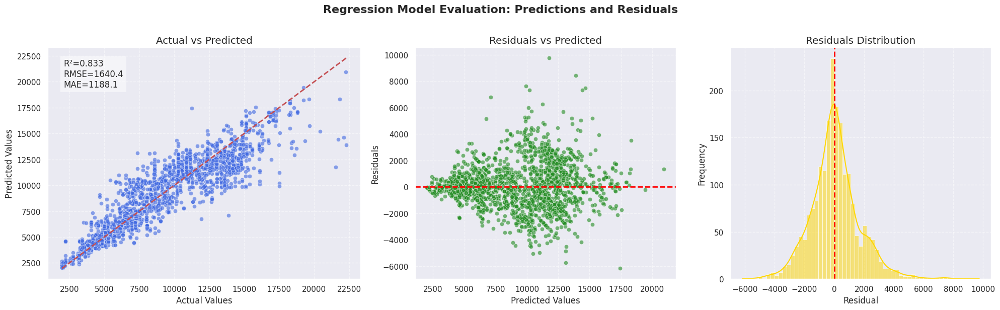

In [79]:
# ===== Actual and Residual vs Prediction Evaluation Plot =====
# ===== Predictions =====
y_pred = final_model_lgbm_pipeline.predict(x_test)
y_test_values = y_test.values.flatten()
residuals = y_test_values - y_pred

# ===== Metrics =====
r2 = r2_score(y_test_values, y_pred)
rmse = np.sqrt(mean_squared_error(y_test_values, y_pred))
mae = mean_absolute_error(y_test_values, y_pred)

# ===== Create Figure with 3 Panels =====
fig = plt.figure(figsize=(20,6))
grid = plt.GridSpec(1, 3, width_ratios=[1.2,1,1])

# ===== Add Overall Figure Title =====
fig.suptitle("Regression Model Evaluation: Predictions and Residuals", fontsize=16, fontweight='bold', y=1.02)

# ===== 1. Actual vs Predicted =====
ax0 = fig.add_subplot(grid[0])
sns.scatterplot(x=y_test_values, y=y_pred, alpha=0.6, color='royalblue', ax=ax0)
ax0.plot([y_test_values.min(), y_test_values.max()],
         [y_test_values.min(), y_test_values.max()],
         'r--', lw=2)
ax0.set_xlabel("Actual Values")
ax0.set_ylabel("Predicted Values")
ax0.set_title("Actual vs Predicted")
ax0.grid(True, linestyle='--', alpha=0.5)
ax0.text(0.05, 0.95, f'R²={r2:.3f}\nRMSE={rmse:.1f}\nMAE={mae:.1f}',
         transform=ax0.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))

# ===== 2. Residuals vs Predicted =====
ax1 = fig.add_subplot(grid[1])
sns.scatterplot(x=y_pred, y=residuals, alpha=0.6, color='forestgreen', ax=ax1)
ax1.axhline(0, color='red', linestyle='--', lw=2)
ax1.set_xlabel("Predicted Values")
ax1.set_ylabel("Residuals")
ax1.set_title("Residuals vs Predicted")
ax1.grid(True, linestyle='--', alpha=0.5)

# ===== 3. Residuals Distribution =====
ax2 = fig.add_subplot(grid[2])
sns.histplot(residuals, kde=True, color='#FFD700', ax=ax2)
ax2.axvline(0, color='red', linestyle='--', lw=2)
ax2.set_title("Residuals Distribution")
ax2.set_xlabel("Residual")
ax2.set_ylabel("Frequency")
ax2.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

**1. Actual vs Predicted:**

* The predicted values align closely with the actual values along the diagonal line, indicating good model performance.

**2. Residuals vs Predicted :**

* The residuals are scattered around zero with no clear pattern, which is a good sign (errors are randomly distributed).

* However, the spread of residuals increases slightly with higher predicted values → possible heteroscedasticity (variance of errors grows with prediction size).

* A few large residuals suggest the presence of outliers or difficult-to-predict cases.

**3. Residuals Distribution:**

* The residuals are centered around zero, approximately symmetric, suggesting unbiased predictions.

* The shape is close to normal but with slightly heavy tails, indicating the model occasionally makes larger errors than expected.

**Conclusion:**

* The regression model performs well with high explanatory power (R² = 0.833), random residual distribution, and errors centered around zero. Some heteroscedasticity and outliers are present, but the model is generally reliable.

## **9.2. Feature Importance Scores - LightGBM Regressor**

In [80]:
# ===== Checking the percentage of feature importance =====
features = final_scale_df.columns
importances = final_model_lgbm_pipeline.named_steps['regressor'].feature_importances_
feature_imp = pd.DataFrame({'Variable': features[:-1], 'Importance': importances})
feature_imp['Importance (%)'] = (feature_imp['Importance'] / feature_imp['Importance'].sum() * 100).round(2)
feature_imp = feature_imp.sort_values(by='Importance (%)', ascending=False).reset_index(drop=True)
print(feature_imp[['Variable', 'Importance (%)']])

                                     Variable  Importance (%)
0                            Duration_minutes           23.01
1                             Arrival_minutes           19.75
2                                       Route           18.17
3                                 Journey_day            9.73
4                               Journey_month            9.52
5                             Journey_weekday            6.75
6                         Airline_Jet Airways            2.84
7                                 Total_Stops            2.69
8                           Airline_Air India            1.75
9                   Airline_Multiple carriers            1.65
10                             Airline_IndiGo            1.48
11                            Airline_Vistara            1.05
12                           Airline_SpiceJet            0.81
13                              Airline_GoAir            0.79
14  Airline_Multiple carriers Premium economy            0.00
15      

### **Chart-33. Feature Importance Scores - LightGBM Regressor**

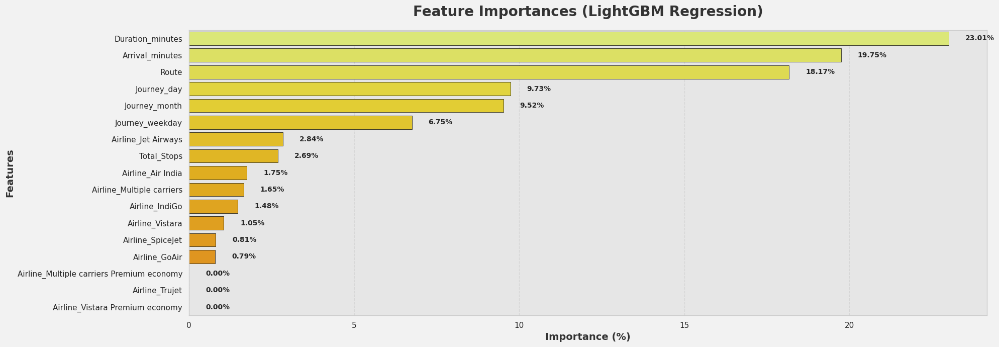

In [81]:
# ===== Plotting the barplot to determine which feature is contributing the most =====
plt.figure(figsize=(20,7))
plt.gcf().set_facecolor('#f2f2f2')
sns.set_style("whitegrid", {"axes.facecolor": "#e6e6e6"})
colors = sns.color_palette("Wistia", n_colors=len(feature_imp))

# ===== Use the correct column names =====
barplot = sns.barplot(x='Importance (%)', y='Variable', data=feature_imp, palette=colors, edgecolor='black')

# ===== Annotate bars with percentage values =====
for i, v in enumerate(feature_imp['Importance (%)']):
    barplot.text(v + 0.5, i, f"{v:.2f}%", va='center', fontsize=10, fontweight='bold')

plt.title('Feature Importances (LightGBM Regression)', fontsize=20, fontweight='bold', color="#333333", pad=20)
plt.xlabel('Importance (%)', fontsize=14, fontweight='bold', color="#333333")
plt.ylabel('Features', fontsize=14, fontweight='bold', color="#333333")
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

## **9.3. Save the Model**

### **9.3.1. Save the best-performing ML model in a pickle (.pkl) file format for deployment**

In [82]:
# ===== Importing pickle module =====
import pickle

# ===== Define model and path =====
model = final_model_lgbm_pipeline

# ===== Save model using pickle =====
with open("FlightPrice_Prediction.pkl", "wb") as f:
    pickle.dump(model, f)

print("Model saved successfully as 'FlightPrice_Prediction.pkl'")

Model saved successfully as 'FlightPrice_Prediction.pkl'


### **9.3.2. Test On Unseen Data**

### **Reload the saved model file and predict on unseen data for a sanity check**

In [83]:
# ===== Load the File and predict unseen data =====
# ===== Load the model in read-binary ('rb') mode =====
with open("FlightPrice_Prediction.pkl", "rb") as f:
    lgbm_model = pickle.load(f)

# ===== Predict on unseen (test) data =====
predictions = lgbm_model.predict(x_test)

# ===== Display predictions =====
print("Predictions on test data:")
print(predictions)

Predictions on test data:
[11755.85778508 14143.32164067 10489.04059929 ...  2205.91520801
  9985.64561158  9845.90654314]


# **10. Conclusion**

## **10.1. Conclusions Drawn from EDA:**

* The dataset includes flight details like Airline, Source, Destination, Route, Stops, Duration, Date, and Price.

* Price distribution is right-skewed → most tickets are in the lower/mid-price range, with some extreme outliers.

* Airline is a key driver of price – premium airlines (Jet Airways Business, Air India Business) have much higher fares.

* Low-cost carriers (IndiGo, GoAir, SpiceJet) dominate the cheaper price range.

* Source city matters – flights from Delhi and Kolkata show different price behavior compared to Chennai or Bangalore.

* Destination also impacts price, especially for high-demand cities like Cochin and Banglore.

* Non-stop flights are the costliest, while 1-stop and 2-stop flights are generally cheaper.

* Duration of the flight correlates with price – longer flights with more stops tend to be cheaper (exceptions exist for premium carriers).

* Route analysis shows some common flight paths are consistently higher priced due to demand.

* Month of journey matters – peak/festive months show higher average prices.

* Day of journey has moderate impact; weekends/holidays tend to have higher fares.

* Price variation within the same airline is wide – depends on stops, route, and season.

* Some airlines (e.g., Jet Airways) show both economy and business class tickets, creating large price differences.

* Outliers exist (very high ticket prices), likely due to business class or special routes.

* Most influential factors for price prediction: Airline, Number of Stops, Flight Duration, Source/Destination, and Date of Journey.

## **10.2. Conclusions Drawn from ML Model:**

* Several models were tested, including Linear Regression, Decision Tree, Random Forest, XGBoost, and LightGBM.

* Linear Regression underperformed due to non-linearity and overfitting.

* Random Forest gave good results, but XGBoost/LightGBM performed the best with high accuracy and low error.

* Key factors driving flight prices are Airline, Number of Stops, Duration.

* Hyperparameter tuning further improved model stability and reduced overfitting.

* The final model (LightGBM) was selected as the best for flight price prediction.

## **10.3. Future Scope**

* **Integration with Real-Time Data** – Connect the model to live flight APIs (e.g., Skyscanner, Amadeus) so predictions adapt dynamically to real-world price fluctuations.

* **Advanced Predictive Modeling** – Implement deep learning (LSTMs/Transformers) for time-series forecasting to capture temporal patterns and improve long-term accuracy.